In [2]:
import pickle
import pandas as pd

# Load the failure results pickle file
with open("failure_results.pkl", "rb") as f:
    failure_data = pickle.load(f)

# Extract network attributes
network_attributes = []
for city, data in failure_data.items():
    attrs = data.get("network_attributes", {})
    if "Nodes" in attrs:
        network_attributes.append({"City": city, **attrs})

# Convert to DataFrame
network_df = pd.DataFrame(network_attributes)

# Sort by number of nodes (largest to smallest)
network_df_sorted = network_df.sort_values(by="Nodes", ascending=False).reset_index(drop=True)

# Print the sorted DataFrame
print(network_df_sorted)


            City  Nodes  Avg_Degree    Avg_SPL   Density  Diameter  \
0        NewYork    463    2.203024  19.690369  0.004768        57   
1         London    369    2.330623  13.732738  0.006333        39   
2       Shanghai    345    2.301449  16.002663  0.006690        45   
3          Paris    302    2.370861  11.976876  0.007877        34   
4         Madrid    240    2.300000  14.587866  0.009623        44   
5          Tokyo    223    2.403587  10.642548  0.010827        32   
6          Delhi    205    2.107317  17.082927  0.010330        54   
7         Berlin    174    2.183908  14.049033  0.012624        46   
8        Chicago    143    2.083916  15.992416  0.014675        43   
9       Santiago    119    2.957983   8.834924  0.025068        24   
10        Boston    114    2.017544  13.954044  0.017854        34   
11         Milan    106    2.056604  12.085175  0.019587        35   
12          Oslo    101    2.039604  14.315842  0.020396        37   
13     Stockholm    

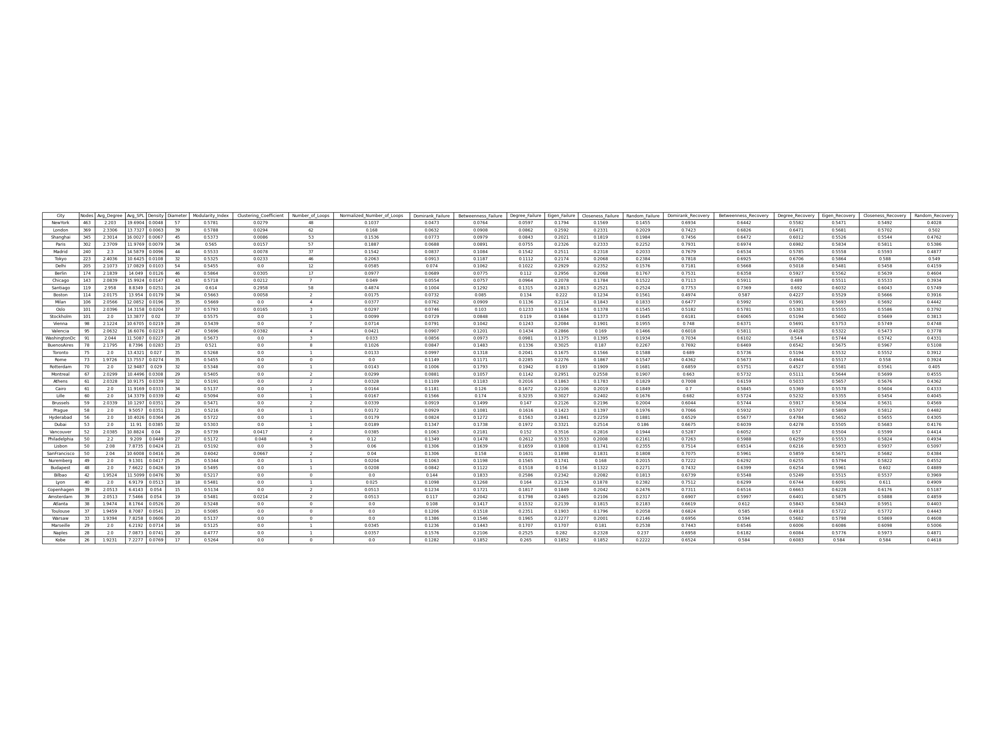

In [107]:
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the failure and recovery results
with open("failure_results.pkl", "rb") as f:
    failure_data = pickle.load(f)

with open("recovery_results.pkl", "rb") as f:
    recovery_data = pickle.load(f)

# Define required methods
required_methods = ["Domirank", "Betweenness", "Degree", "Eigen", "Closeness", "Random"]

# Build full wide table: network attributes + failure AUC + recovery AUC
full_records = []

for city in failure_data:
    if city not in recovery_data:
        continue
    f_attrs = failure_data[city].get("network_attributes", {})
    r_attrs = recovery_data[city].get("network_attributes", {})
    f_auc = failure_data[city].get("failure_auc", {})
    r_auc = recovery_data[city].get("recovery_auc", {})

    if f_attrs and r_attrs:
        record = {
            "City": city,
            **{k: v for k, v in f_attrs.items()},
            **{f"{method}_Failure": f_auc.get(method, np.nan) for method in required_methods},
            **{f"{method}_Recovery": r_auc.get(method, np.nan) for method in required_methods}
        }
        full_records.append(record)

# Create DataFrame
full_df = pd.DataFrame(full_records)

# Round numeric values to 4 decimal digits (except 'City')
for col in full_df.columns:
    if col != 'City':
        full_df[col] = pd.to_numeric(full_df[col], errors='coerce').round(4)

# Sort by number of nodes descending
full_df_sorted = full_df.sort_values(by="Nodes", ascending=False).reset_index(drop=True)

# Make the wide table figure
fig, ax = plt.subplots(figsize=(32, len(full_df_sorted) * 0.5))  # Very wide figure
ax.axis('off')

# Table plotting
table = ax.table(
    cellText=full_df_sorted.values,
    colLabels=full_df_sorted.columns,
    cellLoc='center',
    loc='center'
)

table.auto_set_font_size(False)
table.set_fontsize(9)
table.auto_set_column_width(col=list(range(len(full_df_sorted.columns))))

plt.tight_layout()
plt.show()


In [4]:
full_df_sorted.to_csv("metro_networks_attributes_auc.csv", index=False)

PermissionError: [Errno 13] Permission denied: 'metro_networks_attributes_auc.csv'

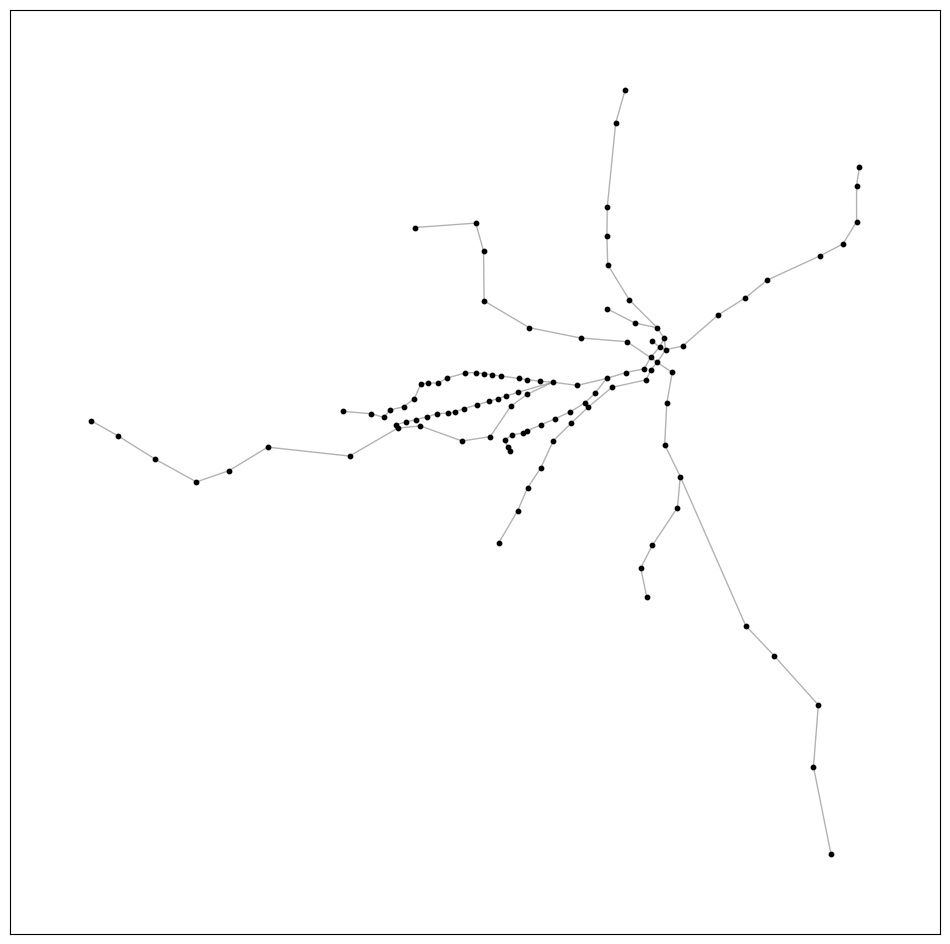

In [2]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt


city_name = "../Boston_MBTA"

# Load nodes and edges
nodes_df = pd.read_csv(fr"{city_name}\Node_CSV.csv", encoding='latin-1')
edges_df = pd.read_csv(fr"{city_name}\Edge_CSV.csv", encoding='latin-1')

# Create edge list
edge_list_N = list(zip(edges_df['Source'], edges_df['Target']))

# Create graph
G_N = nx.Graph()
G_N.add_edges_from(edge_list_N)

# Add node attributes for positions
node_pos = {row['ID']: (row['Lon'], row['Lat']) for _, row in nodes_df.iterrows()}

# Plot the spatial network
plt.figure(figsize=(12, 12))
ax = plt.gca()

# Plot edges
nx.draw_networkx_edges(G_N, pos=node_pos, edge_color="gray", alpha=0.6, ax=ax)

# Plot nodes in black
nx.draw_networkx_nodes(G_N, pos=node_pos, node_color='black', node_size=10, ax=ax)

# Optional: Annotate for city view (comment to remove)
# nx.draw_networkx_labels(G_N, pos=node_pos, font_size=5, font_color='blue', ax=ax)

# Set white background
ax.set_facecolor('white')

# Configure plot
# plt.title("Spatial Visualization of New York Metro Network")
# plt.xlabel("Longitude")
# plt.ylabel("Latitude")
plt.axis("on")  # Keep the axis for accurate spatial representation
plt.grid(False)
plt.savefig('fig_1/boston_network.svg', format='svg', dpi=600, bbox_inches='tight')

# Show plot
plt.show()


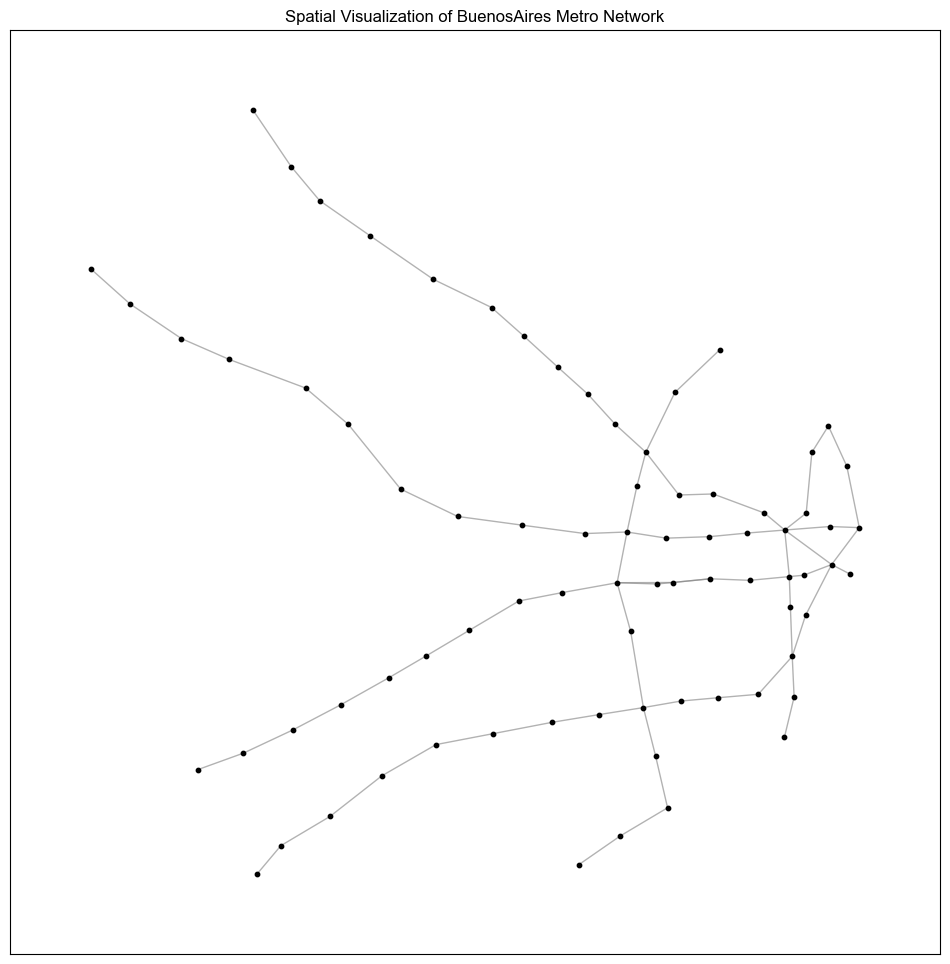

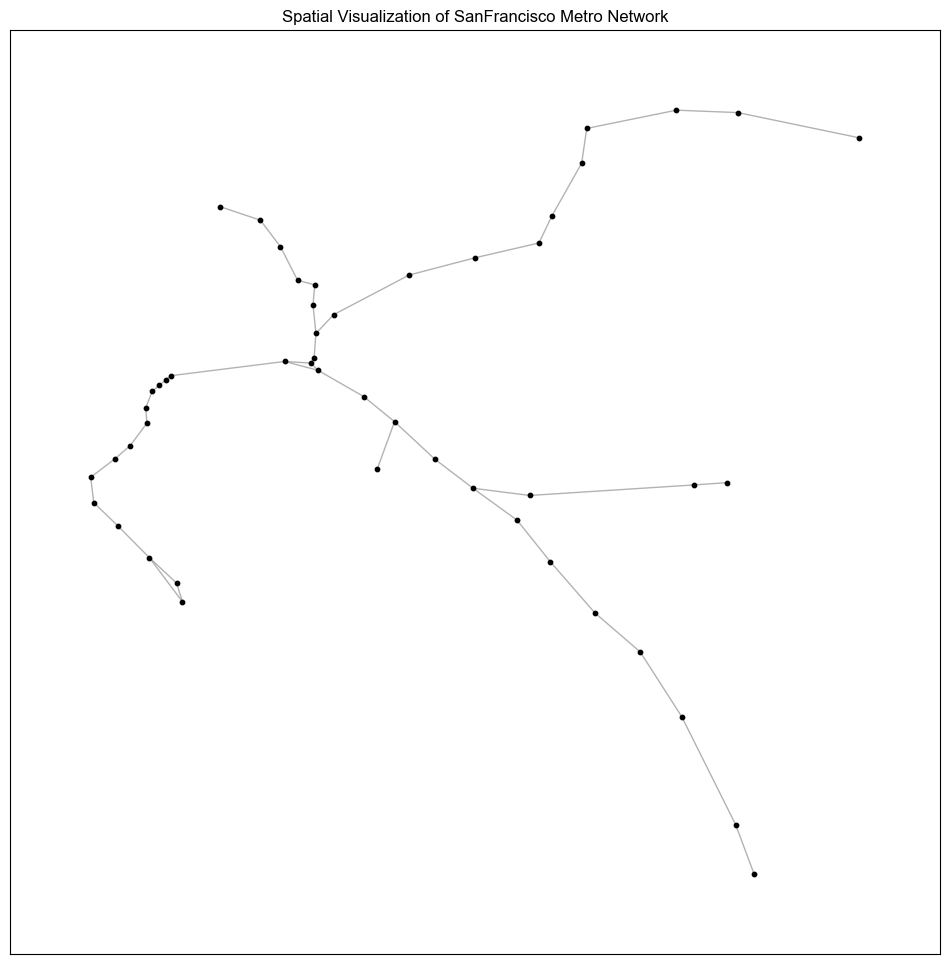

In [101]:
import networkx as nx
import pickle
import matplotlib.pyplot as plt

def load_and_plot_network(city_name):
    try:
        # Load the graph from the pickle file
        file_path = rf"C:\Users\orije\recoverability\spaces\L\L-{city_name}.pkl"
        with open(file_path, 'rb') as file:
            city_G = pickle.load(file)

        # Create an undirected graph (if not already)
        agg_G = nx.Graph()
        agg_G.add_nodes_from(city_G.nodes(data=True))
        for u, v in city_G.edges():
            if not agg_G.has_edge(u, v) and not agg_G.has_edge(v, u):
                agg_G.add_edge(u, v)

        # Extract positions using lat and lon
        node_pos = {node: (data['lon'], data['lat']) for node, data in agg_G.nodes(data=True) if 'lat' in data and 'lon' in data}

        # Plot the spatial network
        plt.figure(figsize=(12, 12))
        ax = plt.gca()

        # Plot edges
        nx.draw_networkx_edges(agg_G, pos=node_pos, edge_color="gray", alpha=0.6, ax=ax)

        # Plot nodes in black
        nx.draw_networkx_nodes(agg_G, pos=node_pos, node_color='black', node_size=10, ax=ax)

        # Set white background
        ax.set_facecolor('white')

        # Configure plot
        plt.title(f"Spatial Visualization of {city_name} Metro Network")
        # plt.xlabel("Longitude")
        # plt.ylabel("Latitude")
        plt.axis("on")
        plt.grid(False)

        # Save the plot as PNG with 300 DPI
        plt.savefig(f'fig_1/{city_name}_network.svg', format='svg', dpi=600, bbox_inches='tight')

        # Show plot
        plt.show()

    except Exception as e:
        print(f"Error loading or plotting the network for {city_name}: {e}")

# Example: Plot and save the network for Athens
load_and_plot_network("BuenosAires")
load_and_plot_network("SanFrancisco")


In [5]:
import pickle
import networkx as nx

# Load the networks from the gpickle file
with open("../all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

# List of cities for which we need to calculate attributes
selected_cities = ["NewYork", "London", "Shanghai", "Stockholm", "Vienna", "Warsaw", "Naples"]

# Function to calculate network attributes
def calculate_network_attributes(G):
    num_nodes = G.number_of_nodes()
    diameter = nx.diameter(G)
    avg_degree = round(sum(dict(G.degree()).values()) / num_nodes, 2) if num_nodes > 0 else 0
    avg_shortest_path_length = round(nx.average_shortest_path_length(G), 2) if nx.is_connected(G) else float('nan')
    density = round(nx.density(G), 4)
    clustering_coefficient = round(nx.average_clustering(G), 4)
    num_loops = sum(1 for cycle in nx.cycle_basis(G))
    
    # Calculate the normalized number of loops (loops per node)
    normalized_num_loops = round((num_loops / num_nodes if num_nodes > 0 else 0),3)

    # Modularity requires communities detection
    from networkx.algorithms import community
    communities = list(community.greedy_modularity_communities(G))
    modularity_index = round(community.modularity(G, communities), 2) if len(communities) > 1 else 0

    return (
        num_nodes, avg_degree, avg_shortest_path_length,
        density,diameter, modularity_index, clustering_coefficient, normalized_num_loops
    )

# Calculate and print attributes for selected cities
results = {}
for city in selected_cities:
    if city in networks:
        G = networks[city]
        results[city] = calculate_network_attributes(G)

results


{'NewYork': (463, 2.2, 19.69, 0.0048, 57, 0.88, 0.0279, 0.104),
 'London': (369, 2.33, 13.73, 0.0063, 39, 0.83, 0.0294, 0.168),
 'Shanghai': (345, 2.3, 16.0, 0.0067, 45, 0.83, 0.0086, 0.154),
 'Stockholm': (101, 2.0, 13.39, 0.02, 37, 0.8, 0.0, 0.01),
 'Vienna': (98, 2.12, 10.67, 0.0219, 28, 0.77, 0.0, 0.071),
 'Warsaw': (33, 1.94, 7.83, 0.0606, 20, 0.67, 0.0, 0.0),
 'Naples': (28, 2.0, 7.09, 0.0741, 20, 0.61, 0.0, 0.036)}

## Failure and recovery Curves saving for Fig 2

In [7]:
import os
import pickle
import matplotlib.pyplot as plt

# === Load results
with open("failure_results.pkl", "rb") as f:
    failure_data = pickle.load(f)

with open("recovery_results.pkl", "rb") as f:
    recovery_data = pickle.load(f)

# === Plot settings
colors = ['black', 'green', 'purple', 'blue', 'orange', 'crimson', 'gold']

Q = 2  # line width
TICK_LABEL_SIZE = 15

# === Target cities
target_cities = ["NewYork", "Stockholm", "Warsaw"]

# === Make output folders
os.makedirs("failure_curves", exist_ok=True)
os.makedirs("recovery_curves", exist_ok=True)

# === Methods
methods = ['Domirank', 'Betweenness', 'Degree', 'Eigen', 'Closeness', 'Random',"Greedy"]

for city in target_cities:
    print(f"📊 Plotting for {city}...")

    # === FAILURE Plot
    plt.figure(figsize=(10, 6))
    ax = plt.gca()
    perf_series = failure_data.get(city, {}).get("performance_series", {})

    for i, method in enumerate(methods):
        series = perf_series.get(method)
        if series:
            plt.plot(series, label=f"{method} Failure", color=colors[i % len(colors)],
                     linestyle='-', linewidth=Q)

    # === Confidence Interval (Random only)
    ci_upper = perf_series.get("Random_CI_Upper")
    ci_lower = perf_series.get("Random_CI_Lower")
    mean_run = perf_series.get("Random")

    if ci_upper and ci_lower and mean_run:
        x_vals = list(range(len(mean_run)))
        
        # Custom dashed style: [dash_length, gap_length]
        dash_pattern = (5, 5)  # You can adjust these values as needed
    
        # Plot dashed CI bounds with larger dash gaps
        plt.plot(x_vals, ci_upper, color='red', linewidth=1.5, label="Random 95% CI", dashes=dash_pattern)
        plt.plot(x_vals, ci_lower, color='red', linewidth=1.5, dashes=dash_pattern)
        
        # Shaded confidence interval region
        plt.fill_between(x_vals, ci_lower, ci_upper, color='red', alpha=0.2)


    ax.tick_params(axis='both', which='major', labelsize=TICK_LABEL_SIZE)
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Arial')

    plt.tight_layout()
    plt.savefig(f'failure_curves/{city}_failure.svg', format='svg', dpi=600)
    plt.close()

    # === RECOVERY Plot
    plt.figure(figsize=(10, 6))
    ax = plt.gca()
    perf_series = recovery_data.get(city, {}).get("performance_series", {})

    for i, method in enumerate(methods):
        series = perf_series.get(method)
        if series:
            plt.plot(series, label=f"{method} Recovery", color=colors[i % len(colors)],
                     linestyle='-', linewidth=Q)

    ci_upper = perf_series.get("Random_CI_Upper")
    ci_lower = perf_series.get("Random_CI_Lower")
    mean_run = perf_series.get("Random")

    if ci_upper and ci_lower and mean_run:
        x_vals = list(range(len(mean_run)))
        plt.plot(x_vals, ci_upper, color='red', linestyle='--', linewidth=1.5, label="Random 95% CI")
        plt.plot(x_vals, ci_lower, color='red', linestyle='--', linewidth=1.5)
        plt.fill_between(x_vals, ci_lower, ci_upper, color='red', alpha=0.2)

    ax.tick_params(axis='both', which='major', labelsize=TICK_LABEL_SIZE)
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Arial')

    plt.tight_layout()
    plt.savefig(f'recovery_curves/{city}_recovery.svg', format='svg', dpi=600)
    plt.close()

print("✅ All plots saved to 'failure_curves/' and 'recovery_curves/'")


📊 Plotting for NewYork...
📊 Plotting for Stockholm...
📊 Plotting for Warsaw...
✅ All plots saved to 'failure_curves/' and 'recovery_curves/'


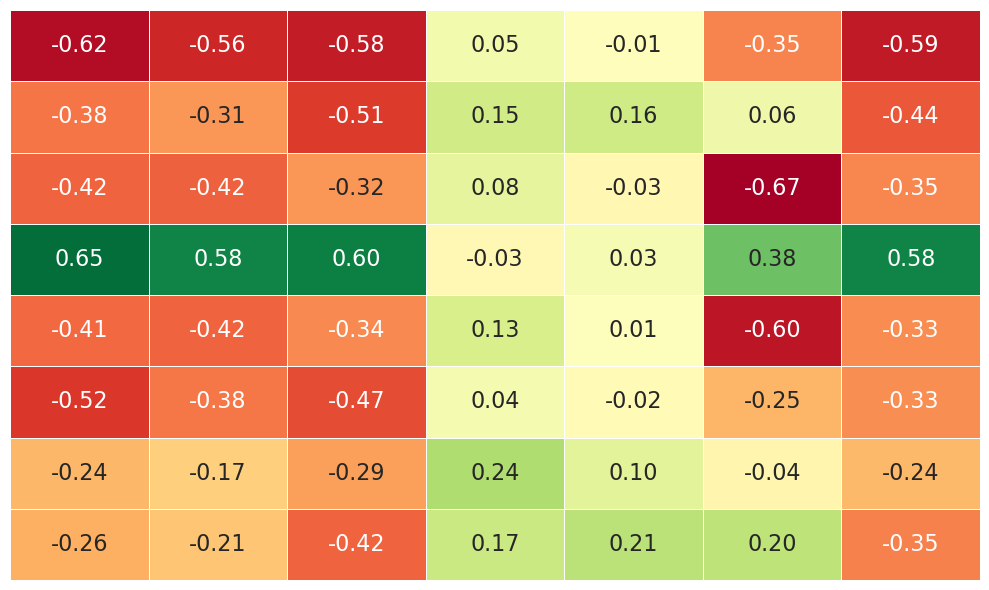

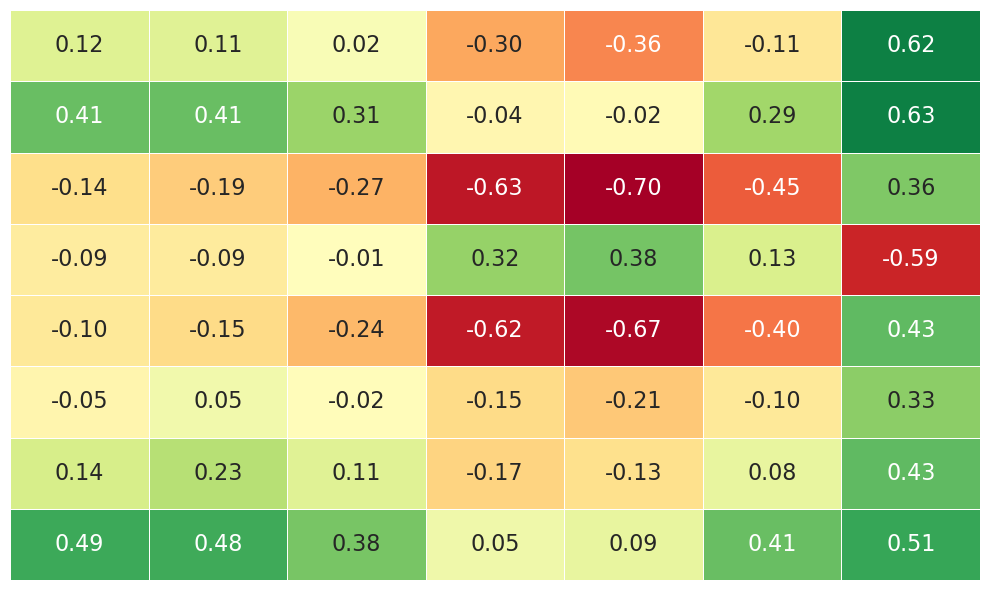

In [2]:
# Re-import required modules after kernel reset
import pickle
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kendalltau
import os

# Load pickle files again
with open("failure_results.pkl", "rb") as f:
    failure_data = pickle.load(f)

with open("recovery_results.pkl", "rb") as f:
    recovery_data = pickle.load(f)

# Define required methods and attributes
required_methods = ["Betweenness", "Closeness", "Degree", "Eigen", "Random", "Domirank","Greedy"]
required_attributes = [
    "Nodes", "Avg_Degree", "Avg_SPL", "Density", "Diameter",
    "Modularity_Index", "Clustering_Coefficient",
    "Number_of_Loops", "Normalized_Number_of_Loops"
]

# Filter valid cities
valid_cities = []
for city in failure_data:
    if city not in recovery_data:
        continue
    f_auc = failure_data[city].get("failure_auc", {})
    r_auc = recovery_data[city].get("recovery_auc", {})
    attrs = failure_data[city].get("network_attributes", {})

    if (
        all(method in f_auc and pd.notnull(f_auc[method]) for method in required_methods) and
        all(method in r_auc and pd.notnull(r_auc[method]) for method in required_methods) and
        all(attr in attrs and np.isfinite(attrs[attr]) for attr in required_attributes)
    ):
        valid_cities.append(city)

# Create aligned DataFrames
attr_df = pd.DataFrame([
    failure_data[city]["network_attributes"] for city in valid_cities
], index=valid_cities)[required_attributes]

failure_auc_df = pd.DataFrame([
    failure_data[city]["failure_auc"] for city in valid_cities
], index=valid_cities)[required_methods]

recovery_auc_df = pd.DataFrame([
    recovery_data[city]["recovery_auc"] for city in valid_cities
], index=valid_cities)[required_methods]

# Compute Kendall Tau correlations
def compute_kendall_tau(attr_df, auc_df):
    tau_df = pd.DataFrame(index=attr_df.columns, columns=auc_df.columns)
    for attr in attr_df.columns:
        for method in auc_df.columns:
            tau, _ = kendalltau(attr_df[attr], auc_df[method])
            tau_df.loc[attr, method] = tau
    return tau_df.astype(float)

tau_failure = compute_kendall_tau(attr_df, failure_auc_df)
tau_recovery = compute_kendall_tau(attr_df, recovery_auc_df)

# Filter out 'Number_of_Loops'
tau_failure_filtered = tau_failure.drop(index="Number_of_Loops")
tau_recovery_filtered = tau_recovery.drop(index="Number_of_Loops")

# Reorder methods
ordered_methods = ["Domirank", "Betweenness", "Degree", "Eigen", "Closeness", "Random","Greedy"]
tau_failure_filtered = tau_failure_filtered[ordered_methods]
tau_recovery_filtered = tau_recovery_filtered[ordered_methods]

# Plotting function
def plot_tau_heatmap_large_text(tau_df, filename):
    plt.figure(figsize=(10, 6))
    sns.heatmap(tau_df, annot=True, fmt=".2f", cmap="RdYlGn", center=0, linewidths=0.5,
                annot_kws={"size": 16}, cbar=False)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    os.makedirs("tau_correlation", exist_ok=True)
    # plt.savefig(f"tau_correlation/{filename}.svg", format='svg', dpi=600)
    plt.show()
    # plt.close()

# Save plots
plot_tau_heatmap_large_text(tau_failure_filtered, "failure_tau_clean_filtered")
plot_tau_heatmap_large_text(tau_recovery_filtered, "recovery_tau_clean_filtered")


In [1]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import mutual_info_regression
import os

# === Load results
with open("failure_results.pkl", "rb") as f:
    failure_data = pickle.load(f)

with open("recovery_results.pkl", "rb") as f:
    recovery_data = pickle.load(f)

# === Required fields
required_methods = ["Domirank", "Betweenness", "Degree","Greedy", "Eigen", "Closeness", "Random"]
required_attributes = [
    "Nodes", "Avg_Degree", "Avg_SPL", "Density", "Diameter",
    "Modularity_Index", "Clustering_Coefficient", "Normalized_Number_of_Loops","CV"
]

# === Filter cities
valid_cities = []
for city in failure_data:
    if city not in recovery_data:
        continue
    f_auc = failure_data[city].get("failure_auc", {})
    r_auc = recovery_data[city].get("recovery_auc", {})
    attrs = failure_data[city].get("network_attributes", {})

    if (
        all(method in f_auc and pd.notnull(f_auc[method]) for method in required_methods) and
        all(method in r_auc and pd.notnull(r_auc[method]) for method in required_methods) and
        all(attr in attrs and np.isfinite(attrs[attr]) for attr in required_attributes)
    ):
        valid_cities.append(city)

# === Construct DataFrames
attr_df = pd.DataFrame([
    failure_data[city]["network_attributes"] for city in valid_cities
], index=valid_cities)[required_attributes]

failure_auc_df = pd.DataFrame([
    failure_data[city]["failure_auc"] for city in valid_cities
], index=valid_cities)[required_methods]

recovery_auc_df = pd.DataFrame([
    recovery_data[city]["recovery_auc"] for city in valid_cities
], index=valid_cities)[required_methods]

# === Compute mutual information scores
def compute_mi_scores(X, Y):
    mi_matrix = pd.DataFrame(index=X.columns, columns=Y.columns)
    for col in Y.columns:
        mi = mutual_info_regression(X, Y[col], random_state=42)
        mi_matrix[col] = mi
    return mi_matrix.astype(float)

mi_failure = compute_mi_scores(attr_df, failure_auc_df)
mi_recovery = compute_mi_scores(attr_df, recovery_auc_df)

# === Plotting
def plot_mi_heatmap(mi_df, title, filename):
    plt.figure(figsize=(10, 6))
    sns.heatmap(mi_df, annot=True, cmap="RdYlGn", linewidths=0.5, fmt=".2f")
    plt.title(title)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    # plt.savefig(f"MI/{filename}", dpi=300)
    
    plt.show()
    


plot_mi_heatmap(mi_failure, "Mutual Information: Network Attributes vs Failure AUC", "mi_failure_auc.png")
plot_mi_heatmap(mi_recovery, "Mutual Information: Network Attributes vs Recovery AUC", "mi_recovery_auc.png")


KeyError: "None of [Index(['Nodes', 'Edges', 'Diameter', 'Avg_Degree', 'Avg_SPL', 'Density',\n       'Clustering_Coefficient', 'Normalized_Number_of_Loops',\n       'Modularity_Index', 'Avg_Degree_Centrality',\n       'Avg_Betweenness_Centrality', 'Avg_Closeness_Centrality',\n       'Avg_Eigenvector_Centrality', 'Algebraic_Connectivity', 'Assortativity',\n       'Rich_Club_Coefficient', 'Transitivity', 'Global_Efficiency',\n       'Local_Efficiency', 'CV', 'Gini_Degree', 'Degree_Variance',\n       'Meshedness', 'Gini_Betweenness', 'Gamma_Index'],\n      dtype='object')] are in the [columns]"

In [8]:
from sklearn.feature_selection import mutual_info_regression

# Filter out 'Number_of_Loops' from attr_df
filtered_attr_df = attr_df

# Reorder method columns
ordered_methods = ["Domirank", "Betweenness", "Degree","Greedy", "Eigen", "Closeness", "Random"]
failure_auc_df = failure_auc_df[ordered_methods]
recovery_auc_df = recovery_auc_df[ordered_methods]

# Function to compute and print MI scores sorted
def print_sorted_mi_scores(X, Y, title):
    print(f"\n=== Mutual Information Scores for {title} ===")
    for method in Y.columns:
        mi_scores = mutual_info_regression(X, Y[method], random_state=42)
        mi_series = pd.Series(mi_scores, index=X.columns)
        sorted_mi = mi_series.sort_values(ascending=False)
        print(f"\n{method}:")
        for attr, score in sorted_mi.items():
            print(f"  {attr}: {score:.4f}")

# Print sorted MI scores for both failure and recovery
print_sorted_mi_scores(filtered_attr_df, failure_auc_df, "Failure AUC")
print_sorted_mi_scores(filtered_attr_df, recovery_auc_df, "Recovery AUC")



=== Mutual Information Scores for Failure AUC ===

Domirank:
  Density: 0.5435
  Nodes: 0.5297
  Modularity_Index: 0.3964
  Avg_SPL: 0.2146
  Diameter: 0.2055
  Avg_Degree: 0.1265
  Normalized_Number_of_Loops: 0.0914
  Clustering_Coefficient: 0.0000
  CV: 0.0000

Betweenness:
  Density: 0.3974
  Modularity_Index: 0.3839
  Nodes: 0.3103
  Avg_SPL: 0.1761
  Diameter: 0.1228
  Avg_Degree: 0.1070
  Clustering_Coefficient: 0.0822
  Normalized_Number_of_Loops: 0.0650
  CV: 0.0093

Degree:
  Nodes: 0.6312
  Density: 0.5821
  Avg_Degree: 0.2717
  Modularity_Index: 0.2433
  Diameter: 0.2311
  Avg_SPL: 0.1803
  Normalized_Number_of_Loops: 0.1658
  CV: 0.1204
  Clustering_Coefficient: 0.0518

Greedy:
  Nodes: 0.5284
  Density: 0.4815
  Avg_Degree: 0.2129
  CV: 0.2100
  Modularity_Index: 0.1566
  Normalized_Number_of_Loops: 0.1366
  Avg_SPL: 0.0852
  Clustering_Coefficient: 0.0694
  Diameter: 0.0443

Eigen:
  Density: 0.0921
  Clustering_Coefficient: 0.0590
  Avg_Degree: 0.0559
  Diameter: 0.0123

In [9]:
filtered_attr_df

,Nodes,Avg_Degree,Avg_SPL,Density,Diameter,Modularity_Index,Clustering_Coefficient,Normalized_Number_of_Loops,CV
WashingtonDc,91,2.043956,11.508669,0.022711,28,0.567291,0.000000,0.032967,0.306970
Boston,114,2.017544,13.954044,0.017854,34,0.566276,0.005848,0.017544,0.278397
Chicago,143,2.083916,15.992416,0.014675,43,0.571754,0.021212,0.048951,0.328448
Delhi,205,2.107317,17.082927,0.010330,54,0.545471,0.000000,0.058537,0.268519
Tokyo,223,2.403587,10.642548,0.010827,32,0.532454,0.023333,0.206278,0.469245
Paris,302,2.370861,11.976876,0.007877,34,0.565038,0.015689,0.188742,0.464629
Shanghai,345,2.301449,16.002663,0.006690,45,0.537288,0.008599,0.153623,0.412310
London,369,2.330623,13.732738,0.006333,39,0.578751,0.029449,0.168022,0.436370
NewYork,463,2.203024,19.690369,0.004768,57,0.578083,0.027893,0.103672,0.351046
Budapest,48,2.000000,7.662234,0.042553,19,0.549479,0.000000,0.020833,0.381881


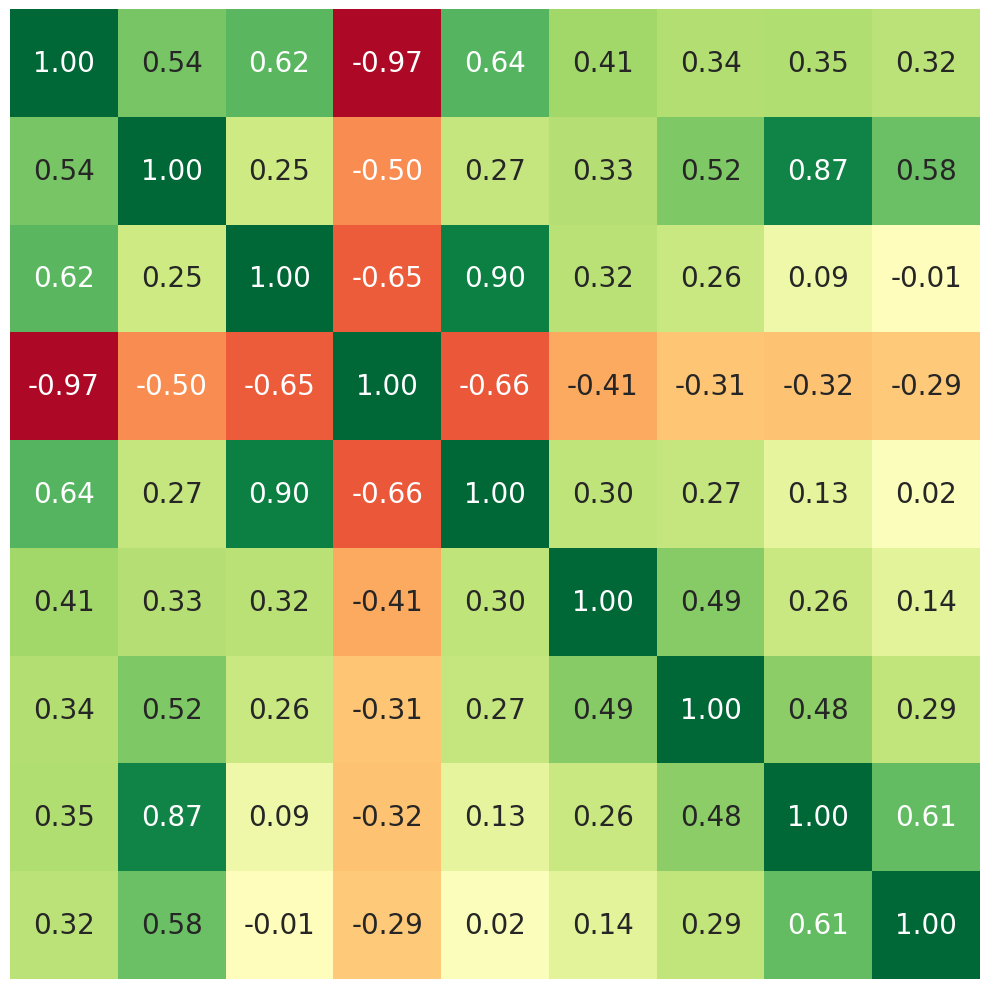

In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import kendalltau

# Compute Kendall Tau correlation matrix
tau_matrix = pd.DataFrame(index=filtered_attr_df.columns, columns=filtered_attr_df.columns)

for attr1 in filtered_attr_df.columns:
    for attr2 in filtered_attr_df.columns:
        tau, _ = kendalltau(filtered_attr_df[attr1], filtered_attr_df[attr2])
        tau_matrix.loc[attr1, attr2] = tau

tau_matrix = tau_matrix.astype(float)

# === Plot the heatmap for editable output
plt.figure(figsize=(10, 10))
sns.heatmap(
    tau_matrix, annot=True, fmt=".2f", cmap="RdYlGn", center=0, linewidths=0,
    annot_kws={"size": 20}, cbar=False,
    xticklabels=False, yticklabels=False  # Remove axis labels for Illustrator editing
)

plt.tight_layout()
plt.savefig("fig_3/full_corr_table.svg", format='svg', dpi=600)  # Save as SVG for vector editing
plt.show()


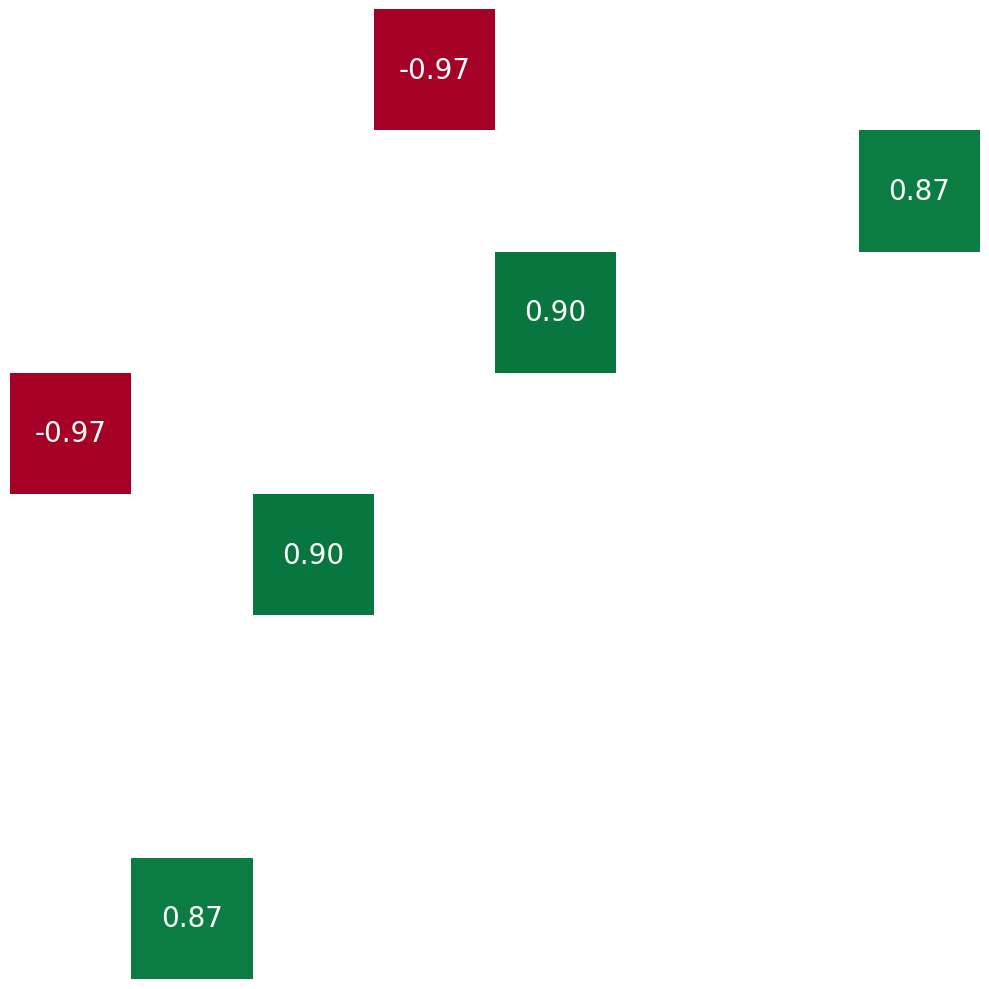

In [15]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


# Compute Pearson correlation
corr_matrix = filtered_attr_df.corr(method="kendall")

# Create mask for values with abs(corr) <= 0.7 or corr == 1 (these will be white)
highlight_mask = (corr_matrix.abs() <= 0.7) | (corr_matrix == 1)

# Create a colormap where masked values appear white
cmap = sns.diverging_palette(150, 10, as_cmap=True)

# Plot
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, mask=highlight_mask, annot=True, fmt=".2f",
            cmap="RdYlGn", center=0, linewidths=0, annot_kws={"size": 20},
            cbar=False, square=True,xticklabels=False, yticklabels=False)

plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
# plt.title("Correlations | Highlighted for |r| > 0.7 (Excl. Self)", fontsize=14)
plt.tight_layout()
plt.savefig("fig_3/only_high_corr_table.svg", format='svg', dpi=600)
plt.show()


In [122]:
import pickle
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Load failure results to extract network attributes
with open("failure_results.pkl", "rb") as f:
    failure_data = pickle.load(f)

# Extract attribute DataFrame
required_attributes = [
    "Nodes", "Avg_Degree", "Avg_SPL", "Density", "Diameter",
    "Modularity_Index", "Clustering_Coefficient", "Normalized_Number_of_Loops"
]

valid_cities = [
    city for city in failure_data
    if all(attr in failure_data[city]["network_attributes"] for attr in required_attributes)
]

attr_df = pd.DataFrame([
    failure_data[city]["network_attributes"] for city in valid_cities
], index=valid_cities)[required_attributes]

# Compute VIF
vif_df = pd.DataFrame()
vif_df["Feature"] = attr_df.columns
vif_df["VIF"] = [variance_inflation_factor(attr_df.values, i) for i in range(attr_df.shape[1])]

vif_df.sort_values(by="VIF", ascending=False)
vif_df

,Feature,VIF
0,Nodes,20.785626
1,Avg_Degree,4342.405835
2,Avg_SPL,677.794982
3,Density,46.373592
4,Diameter,403.243060
5,Modularity_Index,2593.879275
6,Clustering_Coefficient,7.468643
7,Normalized_Number_of_Loops,91.841317


In [21]:
from sklearn.linear_model import LinearRegression

# Fit and print regression equations for all failure and recovery methods using all attributes
for context_name, auc_df in [("Failure", failure_auc_df), ("Recovery", recovery_auc_df)]:
    for method in auc_df.columns:
        X = attr_df.copy()
        y = auc_df[method]

        model = LinearRegression().fit(X, y)
        equation = f"{context_name} AUC ({method}) = {model.intercept_:.4f}"
        for coef, feature in zip(model.coef_, X.columns):
            equation += f" + ({coef:.4f} * {feature})"
        print(f"\n📊 {context_name} | {method}")
        print(equation)



📊 Failure | Betweenness
Failure AUC (Betweenness) = -7.8961 + (-0.0002 * Nodes) + (3.9229 * Avg_Degree) + (0.0127 * Avg_SPL) + (6.3049 * Density) + (-0.0015 * Diameter) + (0.0100 * Modularity_Index) + (-0.4329 * Clustering_Coefficient) + (-7.5027 * Normalized_Number_of_Loops)

📊 Failure | Closeness
Failure AUC (Closeness) = 12.4983 + (-0.0002 * Nodes) + (-6.3232 * Avg_Degree) + (-0.0094 * Avg_SPL) + (-4.5283 * Density) + (0.0058 * Diameter) + (0.3918 * Modularity_Index) + (-0.6188 * Clustering_Coefficient) + (13.3185 * Normalized_Number_of_Loops)

📊 Failure | Degree
Failure AUC (Degree) = 13.9497 + (-0.0004 * Nodes) + (-6.8270 * Avg_Degree) + (0.0181 * Avg_SPL) + (-3.9268 * Density) + (-0.0007 * Diameter) + (-0.7162 * Modularity_Index) + (-0.2609 * Clustering_Coefficient) + (14.1823 * Normalized_Number_of_Loops)

📊 Failure | Eigen
Failure AUC (Eigen) = -27.5356 + (-0.0004 * Nodes) + (13.5949 * Avg_Degree) + (-0.0071 * Avg_SPL) + (15.7130 * Density) + (0.0083 * Diameter) + (0.6108 * Mo

In [11]:
from sklearn.feature_selection import mutual_info_regression

kendall_corr = filtered_attr_df.corr(method="kendall")

# Function to print top 3 MI features and flag high correlation
def report_top_mi_with_high_kendall(mi_df, corr_df, context="Failure"):
    print(f"\n=== Top 3 MI Attributes per Method ({context}) ===")
    for method in mi_df.columns:
        sorted_mi = mi_df[method].sort_values(ascending=False)
        top3_attrs = sorted_mi.head(4)
        print(f"\n{method}:")
        for attr in top3_attrs.index:
            # Check for any other attribute highly correlated with this one
            high_corr_partners = corr_df[attr][(corr_df[attr].abs() > 0.7) & (corr_df[attr].abs() < 1)].index.tolist()
            if high_corr_partners:
                tag = f"✅ correlated with: {', '.join(high_corr_partners)}"
            else:
                tag = ""
            print(f"  {attr}: MI={top3_attrs[attr]:.4f} {tag}")

# Compute MI scores
mi_failure = pd.DataFrame(index=filtered_attr_df.columns)
mi_recovery = pd.DataFrame(index=filtered_attr_df.columns)

for method in failure_auc_df.columns:
    mi_failure[method] = mutual_info_regression(filtered_attr_df, failure_auc_df[method], random_state=42)
for method in recovery_auc_df.columns:
    mi_recovery[method] = mutual_info_regression(filtered_attr_df, recovery_auc_df[method], random_state=42)

# Print reports
report_top_mi_with_high_kendall(mi_failure, kendall_corr, context="Failure")
report_top_mi_with_high_kendall(mi_recovery, kendall_corr, context="Recovery")



=== Top 3 MI Attributes per Method (Failure) ===

Domirank:
  Density: MI=0.5435 ✅ correlated with: Nodes
  Nodes: MI=0.5297 ✅ correlated with: Density
  Modularity_Index: MI=0.3964 
  Diameter: MI=0.2228 ✅ correlated with: Avg_SPL

Betweenness:
  Density: MI=0.4019 ✅ correlated with: Nodes
  Modularity_Index: MI=0.3839 
  Nodes: MI=0.3115 ✅ correlated with: Density
  Avg_SPL: MI=0.1761 ✅ correlated with: Diameter

Degree:
  Nodes: MI=0.6369 ✅ correlated with: Density
  Density: MI=0.5821 ✅ correlated with: Nodes
  Diameter: MI=0.2748 ✅ correlated with: Avg_SPL
  Avg_Degree: MI=0.2654 ✅ correlated with: Normalized_Number_of_Loops

Eigen:
  Density: MI=0.0965 ✅ correlated with: Nodes
  Clustering_Coefficient: MI=0.0772 
  Avg_Degree: MI=0.0323 ✅ correlated with: Normalized_Number_of_Loops
  Diameter: MI=0.0126 ✅ correlated with: Avg_SPL

Closeness:
  Modularity_Index: MI=0.1757 
  Density: MI=0.1346 ✅ correlated with: Nodes
  Normalized_Number_of_Loops: MI=0.0572 ✅ correlated with: Avg

In [13]:
from sklearn.feature_selection import mutual_info_regression
from sklearn.linear_model import LinearRegression

# Get the top 3 MI features for each method
def get_top3_mi_features(X, y):
    mi = mutual_info_regression(X, y, random_state=42)
    mi_series = pd.Series(mi, index=X.columns).sort_values(ascending=False)
    return mi_series.head(3).index.tolist()

# Fit linear regression and print equation
def fit_and_print_regression(X, y, method_name, context="Failure"):
    top_features = get_top3_mi_features(X, y)
    X_top = X[top_features]

    model = LinearRegression().fit(X_top, y)
    coefs = model.coef_
    intercept = model.intercept_

    # Print the regression equation
    eq = f"{context} AUC ({method_name}) = {intercept:.4f}"
    for i, feature in enumerate(top_features):
        eq += f" + ({coefs[i]:.6f} * {feature})"
    print(eq)

# Run for all methods in both failure and recovery
for method in failure_auc_df.columns:
    fit_and_print_regression(filtered_attr_df, failure_auc_df[method], method, context="Failure")

for method in recovery_auc_df.columns:
    fit_and_print_regression(filtered_attr_df, recovery_auc_df[method], method, context="Recovery")


Failure AUC (Domirank) = 0.2190 + (0.737676 * Density) + (-0.000046 * Nodes) + (-0.253782 * Modularity_Index)
Failure AUC (Betweenness) = 0.1431 + (1.325204 * Density) + (-0.097922 * Modularity_Index) + (-0.000023 * Nodes)
Failure AUC (Degree) = 0.0024 + (-0.000237 * Nodes) + (2.550044 * Density) + (0.003193 * Diameter)
Failure AUC (Eigen) = 0.1022 + (0.154673 * Density) + (0.134283 * Clustering_Coefficient) + (0.056407 * Avg_Degree)
Failure AUC (Closeness) = 0.2388 + (-0.125012 * Modularity_Index) + (0.349328 * Density) + (0.196644 * Normalized_Number_of_Loops)
Failure AUC (Random) = 0.3452 + (-0.020801 * Avg_SPL) + (0.003277 * Diameter) + (-0.515860 * Density)
Recovery AUC (Domirank) = 3.1798 + (3.042008 * Normalized_Number_of_Loops) + (-1.297899 * Avg_Degree) + (0.000234 * Nodes)
Recovery AUC (Betweenness) = 12.6775 + (12.601167 * Normalized_Number_of_Loops) + (-6.051321 * Avg_Degree) + (-5.854575 * Density)
Recovery AUC (Degree) = 0.7367 + (0.218805 * Normalized_Number_of_Loops) + 

In [15]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.feature_selection import mutual_info_regression
import numpy as np
import pandas as pd
from sklearn.metrics import root_mean_squared_error

# === Redundancy rules ===
redundant_pairs = {
    frozenset(["Nodes", "Density"]): "Density",
    frozenset(["Avg_Degree", "Normalized_Number_of_Loops"]): "Normalized_Number_of_Loops",
    frozenset(["Avg_SPL", "Diameter"]): "Avg_SPL"
}

# === Resolve top features ===
def resolve_top_features(top_features):
    resolved = set(top_features)
    for pair, keep in redundant_pairs.items():
        intersection = resolved.intersection(pair)
        if len(intersection) == 2:
            to_remove = list(intersection - {keep})[0]
            resolved.remove(to_remove)
            print(f"⚠️ Conflict between {pair}. Keeping: {keep}")
    return list(resolved)

# === Fit and evaluate model ===
def fit_regression(X, y, method, context):
    # Top MI features
    mi = mutual_info_regression(X, y, random_state=42)
    top_features = pd.Series(mi, index=X.columns).sort_values(ascending=False).head(5)
    resolved_features = resolve_top_features(top_features.index[:3])

    X_selected = X[resolved_features]
    model = LinearRegression().fit(X_selected, y)
    preds = model.predict(X_selected)

    # Evaluation
    r2 = r2_score(y, preds)
    rmse = root_mean_squared_error(y, preds)


    # Equation
    eq = f"{context} AUC ({method}) = {model.intercept_:.4f}"
    for coef, name in zip(model.coef_, resolved_features):
        eq += f" + ({coef:.4f} * {name})"
    print(f"\n📊 {context} | {method}")
    print(f"Equation: {eq}")
    print(f"R²: {r2:.3f} | RMSE: {rmse:.3f}")

    # Plot
    plt.figure(figsize=(6, 4))
    plt.scatter(y, preds, edgecolors='k')
    plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')
    plt.xlabel("Actual AUC")
    plt.ylabel("Predicted AUC")
    plt.title(f"{context} AUC Prediction - {method}")
    plt.grid(True)
    plt.tight_layout()
    # plt.savefig(f"visuals_for_paper/regression_{context.lower()}_{method}.png", dpi=300)
    # plt.show()
    plt.close()

# === Run for all methods ===
for method in failure_auc_df.columns:
    fit_regression(filtered_attr_df, failure_auc_df[method], method, context="Failure")

for method in recovery_auc_df.columns:
    fit_regression(filtered_attr_df, recovery_auc_df[method], method, context="Recovery")


⚠️ Conflict between frozenset({'Nodes', 'Density'}). Keeping: Density

📊 Failure | Domirank
Equation: Failure AUC (Domirank) = 0.2048 + (0.9289 * Density) + (-0.2483 * Modularity_Index)
R²: 0.668 | RMSE: 0.015
⚠️ Conflict between frozenset({'Nodes', 'Density'}). Keeping: Density

📊 Failure | Betweenness
Equation: Failure AUC (Betweenness) = 0.1360 + (1.4213 * Density) + (-0.0952 * Modularity_Index)
R²: 0.554 | RMSE: 0.025
⚠️ Conflict between frozenset({'Nodes', 'Density'}). Keeping: Density

📊 Failure | Degree
Equation: Failure AUC (Degree) = -0.0251 + (0.0026 * Diameter) + (3.2223 * Density)
R²: 0.544 | RMSE: 0.038

📊 Failure | Eigen
Equation: Failure AUC (Eigen) = 0.1022 + (0.1547 * Density) + (0.1343 * Clustering_Coefficient) + (0.0564 * Avg_Degree)
R²: 0.068 | RMSE: 0.053

📊 Failure | Closeness
Equation: Failure AUC (Closeness) = 0.2388 + (0.3493 * Density) + (-0.1250 * Modularity_Index) + (0.1966 * Normalized_Number_of_Loops)
R²: 0.165 | RMSE: 0.033
⚠️ Conflict between frozenset({

In [17]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import mutual_info_regression
from sklearn.metrics import r2_score, root_mean_squared_error
import pandas as pd
import numpy as np
import os

# Create output directory
# os.makedirs("visuals_for_paper", exist_ok=True)

# === Conflict resolution rules
conflict_subs = {
    "Nodes": "Density",
    "Avg_Degree": "Normalized_Number_of_Loops",
    "Diameter": "Avg_SPL"
}

# === Resolve top MI features with conflict rules
# === Resolve top MI features with conflict rules (allow < 3 after filtering)
def resolve_conflicted_features(top_features):
    resolved = []
    used = set()
    for feat in top_features[:3]:
        # Apply substitution if part of conflict
        if feat in conflict_subs:
            substitute = conflict_subs[feat]
            if substitute not in resolved:
                resolved.append(substitute)
                used.add(substitute)
        # Keep original if it's not a substitute of another
        elif feat not in conflict_subs.values():
            resolved.append(feat)
        # Allow substitute if it hasn't been used yet
        elif feat in conflict_subs.values() and feat not in used:
            resolved.append(feat)
        # Don't enforce limit here — we allow < 3
    return resolved


# === Fit, evaluate, and plot linear regression
def fit_regression_clean(X, y, method, context):
    # Step 1: Get top MI features
    mi = mutual_info_regression(X, y, random_state=42)
    top_mi = pd.Series(mi, index=X.columns).sort_values(ascending=False)
    resolved_features = resolve_conflicted_features(top_mi.index)

    X_sel = X[resolved_features]
    model = LinearRegression().fit(X_sel, y)
    preds = model.predict(X_sel)

    # Step 2: Evaluate
    r2 = r2_score(y, preds)
    rmse = root_mean_squared_error(y, preds)

    # Step 3: Print equation
    eq = f"{context} AUC ({method}) = {model.intercept_:.4f}"
    for coef, feat in zip(model.coef_, resolved_features):
        eq += f" + ({coef:.4f} * {feat})"
    print(f"\n📊 {context} | {method}")
    print(f"Equation: {eq}")
    print(f"R²: {r2:.3f} | RMSE: {rmse:.3f}")

    # Step 4: Plot
    plt.figure(figsize=(6, 4))
    plt.scatter(y, preds, edgecolors='k')
    plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')
    plt.xlabel("Actual AUC")
    plt.ylabel("Predicted AUC")
    plt.title(f"{context} AUC Prediction - {method}")
    plt.grid(True)
    plt.tight_layout()
    # plt.savefig(f"visuals_for_paper/regression_{context.lower()}_{method}.png", dpi=300)
    # plt.show()
    plt.close()

# === Run for all methods
for method in failure_auc_df.columns:
    fit_regression_clean(filtered_attr_df, failure_auc_df[method], method, context="Failure")

for method in recovery_auc_df.columns:
    fit_regression_clean(filtered_attr_df, recovery_auc_df[method], method, context="Recovery")



📊 Failure | Domirank
Equation: Failure AUC (Domirank) = 0.2048 + (0.9289 * Density) + (-0.2483 * Modularity_Index)
R²: 0.668 | RMSE: 0.015

📊 Failure | Betweenness
Equation: Failure AUC (Betweenness) = 0.1360 + (1.4213 * Density) + (-0.0952 * Modularity_Index)
R²: 0.554 | RMSE: 0.025

📊 Failure | Degree
Equation: Failure AUC (Degree) = -0.0395 + (3.2340 * Density) + (0.0082 * Avg_SPL)
R²: 0.545 | RMSE: 0.038

📊 Failure | Eigen
Equation: Failure AUC (Eigen) = 0.2152 + (0.0967 * Density) + (0.1383 * Clustering_Coefficient) + (0.1110 * Normalized_Number_of_Loops)
R²: 0.068 | RMSE: 0.053

📊 Failure | Closeness
Equation: Failure AUC (Closeness) = 0.2388 + (-0.1250 * Modularity_Index) + (0.3493 * Density) + (0.1966 * Normalized_Number_of_Loops)
R²: 0.165 | RMSE: 0.033

📊 Failure | Random
Equation: Failure AUC (Random) = 0.3414 + (-0.0112 * Avg_SPL) + (-0.6286 * Density)
R²: 0.738 | RMSE: 0.016

📊 Recovery | Domirank
Equation: Recovery AUC (Domirank) = 0.6333 + (0.4872 * Normalized_Number_of

In [143]:
import matplotlib.pyplot as plt
import matplotlib as mpl

# Create a fake scalar mappable for colorbar with RdYlGn colormap and range -1 to 1
fig, ax = plt.subplots(figsize=(1.0, 12))  # Tall vertical bar
norm = mpl.colors.Normalize(vmin=-1, vmax=1)
cbar = mpl.colorbar.ColorbarBase(ax, cmap="mako", norm=norm, orientation='vertical')

# Remove ticks and labels
cbar.ax.tick_params(size=0)
cbar.ax.set_yticklabels([])
cbar.ax.set_ylabel("")

# Save
plt.tight_layout()
plt.savefig("fig_3/legend_bar_makon.svg", format='svg', dpi=600, bbox_inches='tight', transparent=True)
plt.close()


In [127]:
from matplotlib import colormaps
list(colormaps)

['magma',
 'inferno',
 'plasma',
 'viridis',
 'cividis',
 'twilight',
 'twilight_shifted',
 'turbo',
 'Blues',
 'BrBG',
 'BuGn',
 'BuPu',
 'CMRmap',
 'GnBu',
 'Greens',
 'Greys',
 'OrRd',
 'Oranges',
 'PRGn',
 'PiYG',
 'PuBu',
 'PuBuGn',
 'PuOr',
 'PuRd',
 'Purples',
 'RdBu',
 'RdGy',
 'RdPu',
 'RdYlBu',
 'RdYlGn',
 'Reds',
 'Spectral',
 'Wistia',
 'YlGn',
 'YlGnBu',
 'YlOrBr',
 'YlOrRd',
 'afmhot',
 'autumn',
 'binary',
 'bone',
 'brg',
 'bwr',
 'cool',
 'coolwarm',
 'copper',
 'cubehelix',
 'flag',
 'gist_earth',
 'gist_gray',
 'gist_heat',
 'gist_ncar',
 'gist_rainbow',
 'gist_stern',
 'gist_yarg',
 'gnuplot',
 'gnuplot2',
 'gray',
 'hot',
 'hsv',
 'jet',
 'nipy_spectral',
 'ocean',
 'pink',
 'prism',
 'rainbow',
 'seismic',
 'spring',
 'summer',
 'terrain',
 'winter',
 'Accent',
 'Dark2',
 'Paired',
 'Pastel1',
 'Pastel2',
 'Set1',
 'Set2',
 'Set3',
 'tab10',
 'tab20',
 'tab20b',
 'tab20c',
 'grey',
 'gist_grey',
 'gist_yerg',
 'Grays',
 'magma_r',
 'inferno_r',
 'plasma_r',
 'viri

In [110]:
def calculate_network_performance(G):
    # sd = dict(nx.shortest_path_length(G))

    if(len(G)==0):
        return 0
    
    gc_size = [len(c) for c in sorted(nx.connected_components(G), key=len, reverse=True)][0]
    return gc_size


def plot_functionality_ratio(failure_performance):
    plt.figure(figsize=(10, 5))
    steps = list(range(1, len(failure_performance) + 1))
    plt.plot(steps, failure_performance, marker='o', linestyle='-', color='blue')
    plt.title('Network Functionality Ratio During Failure')
    plt.xlabel('Step (Order of Node Failure)')
    plt.ylabel('Network Functionality Ratio')
    plt.grid(True)
    plt.show()

In [154]:
import copy
import numpy as np
import networkx as nx
import time

def domirank(G, sigma=-1, dt=0.1, epsilon=1e-5, maxIter=1000, checkStep=10):
    if isinstance(G, nx.Graph):  # Check if it is a NetworkX graph
        G = nx.to_scipy_sparse_array(G)  # Convert to scipy sparse array if it is a graph
    else:
        G = G.copy()
    if sigma == -1:
        sigma = optimal_sigma(G, dt=dt, epsilon=epsilon, maxIter=maxIter, checkStep=checkStep)
    pGAdj = sigma * G.astype(np.float32)
    Psi = np.zeros(pGAdj.shape[0]).astype(np.float32)
    maxVals = np.zeros(int(maxIter / checkStep)).astype(np.float32)
    dt = np.float32(dt)
    j = 0
    boundary = epsilon * pGAdj.shape[0] * dt
    for i in range(maxIter):
        tempVal = ((pGAdj @ (1 - Psi)) - Psi) * dt
        Psi += tempVal.real
        if i % checkStep == 0:
            if np.abs(tempVal).sum() < boundary:
                break
            maxVals[j] = tempVal.max()
            if i == 0:
                initialChange = maxVals[j]
            if j > 0:
                if maxVals[j] > maxVals[j - 1] and maxVals[j - 1] > maxVals[j - 2]:
                    return False, Psi
            j += 1

    return True, Psi

def find_eigenvalue(G, minVal=0, maxVal=1, maxDepth=100, dt=0.1, epsilon=1e-5, maxIter=100, checkStep=10):
    x = (minVal + maxVal) / G.sum(axis=-1).max()
    minValStored = 0
    for i in range(maxDepth):
        if maxVal - minVal < epsilon:
            break
        if domirank(G, x, dt, epsilon, maxIter, checkStep)[0]:
            minVal = x
            x = (minVal + maxVal) / 2
            minValStored = minVal
        else:
            maxVal = (x + maxVal) / 2
            x = (minVal + maxVal) / 2
        if minVal == 0:
            print(f'Current Interval : [-inf, -{1 / maxVal}]')
        else:
            print(f'Current Interval : [-{1 / minVal}, -{1 / maxVal}]')
    finalVal = (maxVal + minVal) / 2
    return -1 / finalVal

def process_iteration(q, i, sigma, spArray, maxIter, checkStep, dt, epsilon, sampling):
    tf, domiDist = domirank(spArray, sigma, dt=dt, epsilon=epsilon, maxIter=maxIter, checkStep=checkStep)
    domiAttack = generate_attack(domiDist)
    ourTempAttack, __ = network_attack_sampled(spArray, domiAttack, sampling=sampling)
    finalErrors = ourTempAttack.sum()
    q.put(finalErrors)

def optimal_sigma(spArray, endVal=0, startval=0.000001, iterationNo=100, dt=0.1, epsilon=1e-5, maxIter=100, checkStep=10, maxDepth=100, sampling=0):
    if endVal == 0:
        endVal = find_eigenvalue(spArray, maxDepth=maxDepth, dt=dt, epsilon=epsilon, maxIter=maxIter, checkStep=checkStep)
    import multiprocessing as mp
    endval = -0.9999 / endVal
    tempRange = np.arange(startval, endval + (endval - startval) / iterationNo, (endval - startval) / iterationNo)
    processes = []
    q = mp.Queue()
    for i, sigma in enumerate(tempRange):
        p = mp.Process(target=process_iteration, args=(q, i, sigma, spArray, maxIter, checkStep, dt, epsilon, sampling))
        p.start()
        processes.append(p)

    results = []
    for p in processes:
        p.join()
        result = q.get()
        results.append(result)
    finalErrors = np.array(results)
    minEig = np.where(finalErrors == finalErrors.min())[0][-1]
    minEig = tempRange[minEig]
    return minEig, finalErrors
optimal_sigma_value = 0.26

def simulate_failure_domirank(G, sigma, alpha=0.85, beta=0.1, theta=1.0):
    H = copy.deepcopy(G)
    
    num_nodes_to_remove = int(sigma * len(G.nodes))
    failure_performance = []
    seq_removed_domirank=[]
    initial_performance = calculate_network_performance(G)
    print("Initial performance is: ", initial_performance)

    converged, domirank_centrality = domirank(nx.to_scipy_sparse_array(G), sigma=optimal_sigma_value)
    if not converged:
        print("Warning: DomiRank calculation did not converge. Results may be inaccurate.")

    # Mapping nodes to their DomiRank centrality values
    domirank_dict = {node: domirank_centrality[i] for i, node in enumerate(G.nodes)}

    nodes_sorted_by_domirank = sorted(G.nodes, key=lambda n: domirank_dict[n], reverse=True)[:num_nodes_to_remove]
    
    failure_performance.append(1)
    i = 1
    for node in nodes_sorted_by_domirank:
        if node in H.nodes:
            H.remove_node(node)
            seq_removed_domirank.append(node)
        current_performance = calculate_network_performance(H)
        functionality_ratio = current_performance / initial_performance
        failure_performance.append(functionality_ratio)
        # print(f'Functionality after removing node {i}: {functionality_ratio}')
        i += 1
    
    return failure_performance, seq_removed_domirank




In [148]:
def simulate_failure_betweenness(G, sigma):
    H = copy.deepcopy(G)
    
    num_nodes_to_remove = int(sigma * len(G.nodes))
    failure_performance = []
    seq_removed_betweenness = []
    initial_performance = calculate_network_performance(G)
    
    betweenness_centrality = nx.betweenness_centrality(G)
    nodes_sorted_by_betweenness = sorted(G.nodes, key=lambda n: betweenness_centrality[n], reverse=True)[:num_nodes_to_remove]
    
    failure_performance.append(1)
    i = 1
    for node in nodes_sorted_by_betweenness:
        if node in H.nodes:
            H.remove_node(node)
            seq_removed_betweenness.append(node)
        
        current_performance = calculate_network_performance(H)
        functionality_ratio = current_performance / initial_performance
        failure_performance.append(functionality_ratio)
        # print(f'Functionality after removing node {i}: {functionality_ratio}')
        i += 1
    
    return failure_performance, seq_removed_betweenness




🔧 Varying Avg_Degree...


100%|██████████| 15/15 [00:00<00:00, 228.68it/s]



🔧 Varying Density...


100%|██████████| 15/15 [00:00<00:00, 288.43it/s]



🔧 Varying Diameter...


100%|██████████| 15/15 [00:00<00:00, 70.22it/s]



🔧 Varying Modularity_Index...


100%|██████████| 15/15 [00:00<00:00, 146.31it/s]



🔧 Varying Clustering_Coefficient...


100%|██████████| 15/15 [00:00<00:00, 215.56it/s]



🔧 Varying Avg_SPL...


100%|██████████| 15/15 [00:00<00:00, 76.12it/s]



🔧 Varying Normalized_Number_of_Loops...


100%|██████████| 15/15 [00:00<00:00, 234.19it/s]


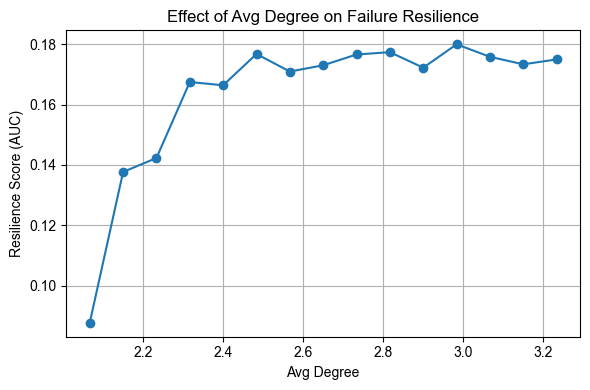

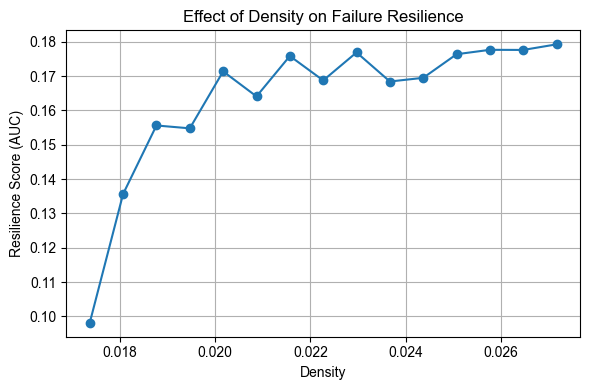

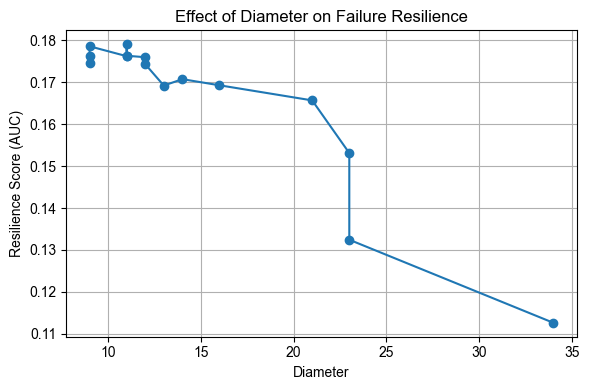

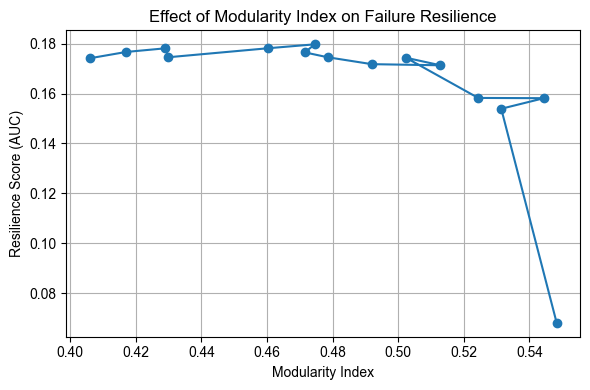

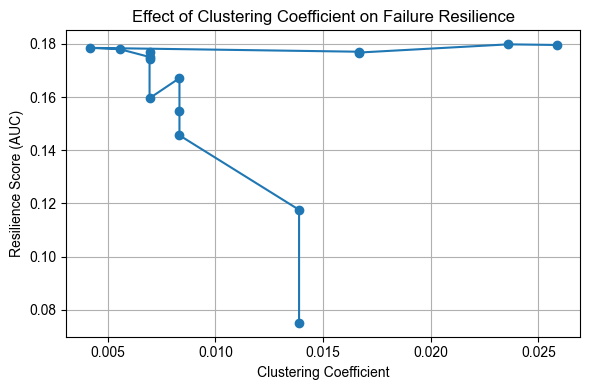

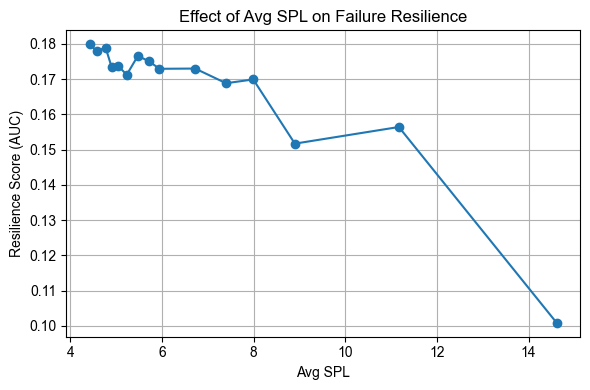

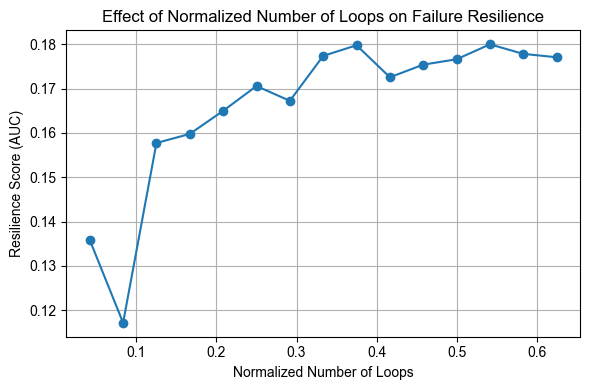

In [197]:
# Re-import libraries after environment reset
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm

# Redefine simulate_failure_domirank stub for compatibility
def simulate_failure_domirank(G, sigma, alpha=0.85, beta=0.1, theta=1.0):
    import copy
    H = copy.deepcopy(G)
    num_nodes_to_remove = int(sigma * len(G.nodes))
    failure_performance = []
    initial_performance = len(max(nx.connected_components(G), key=len))  # proxy

    nodes = list(G.nodes())
    np.random.shuffle(nodes)
    nodes_to_remove = nodes[:num_nodes_to_remove]

    failure_performance.append(1)
    for i, node in enumerate(nodes_to_remove):
        if node in H.nodes:
            H.remove_node(node)
        curr_perf = len(max(nx.connected_components(H), key=len)) / initial_performance
        failure_performance.append(curr_perf)
    return failure_performance, nodes_to_remove

# === Setup Parameters ===
total_nodes = 120
num_lines = 4
line_lengths = [30, 30, 30, 30]  # each line has 30 stations
sigma = 0.2

# Create path graphs
lines = [nx.path_graph(line_lengths[i]) for i in range(num_lines)]
offset = 0
for i in range(num_lines):
    lines[i] = nx.relabel_nodes(lines[i], lambda x, off=offset: x + off)
    offset += line_lengths[i]
G_base = nx.compose_all(lines)

# Transfer stations
transfer_links = [(10, 40), (70, 100), (25, 95)]
G_base.add_edges_from(transfer_links)

# Dummy node features
for node in G_base.nodes():
    G_base.nodes[node]['lat'] = np.random.uniform()
    G_base.nodes[node]['lon'] = np.random.uniform()
    G_base.nodes[node]['name'] = f"Node {node}"
    G_base.nodes[node]['original_ids'] = node

# Attributes to test
attributes = {
    "Avg_Degree": lambda G: np.mean([d for n, d in G.degree()]),
    "Density": nx.density,
    "Diameter": lambda G: nx.diameter(G) if nx.is_connected(G) else float('inf'),
    "Modularity_Index": lambda G: nx.algorithms.community.modularity(G, nx.algorithms.community.label_propagation_communities(G)),
    "Clustering_Coefficient": nx.average_clustering,
    "Avg_SPL": lambda G: nx.average_shortest_path_length(G) if nx.is_connected(G) else float('inf'),
    "Normalized_Number_of_Loops": lambda G: len(nx.cycle_basis(G)) / G.number_of_nodes()
}

comparison_data = {attr: [] for attr in attributes}

for attr_name, attr_func in attributes.items():
    print(f"\n🔧 Varying {attr_name}...")
    G = G_base.copy()
    existing_edges = set(G.edges())
    all_possible = set((u, v) for u in G.nodes() for v in G.nodes() if u < v and (u, v) not in existing_edges)
    possible_edges = list(all_possible)
    np.random.shuffle(possible_edges)

    steps = 15
    for step in tqdm(range(steps)):
        for _ in range(5):  # Increase edges gradually
            if possible_edges:
                G.add_edge(*possible_edges.pop())

        attr_val = attr_func(G)
        auc_val = np.trapz(simulate_failure_domirank(G, sigma)[0], dx=1) / len(G.nodes)
        comparison_data[attr_name].append((attr_val, auc_val))

# Store results in DataFrames for plotting
attr_dfs = {}
for attr in comparison_data:
    df = pd.DataFrame(comparison_data[attr], columns=[attr, "AUC"])
    attr_dfs[attr] = df

import os
# os.makedirs("visuals_for_paper", exist_ok=True)

# Plot
for attr, df in attr_dfs.items():
    plt.figure(figsize=(6, 4))
    plt.plot(df[attr], df["AUC"], marker='o')
    plt.xlabel(attr.replace("_", " "))
    plt.ylabel("Resilience Score (AUC)")
    plt.title(f"Effect of {attr.replace('_', ' ')} on Failure Resilience")
    plt.grid(True)
    plt.tight_layout()
    # plt.savefig(f"visuals_for_paper/{attr}_vs_auc.png", dpi=300)
    plt.show()


In [64]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import mutual_info_regression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import numpy as np

# === Load data
with open("failure_results.pkl", "rb") as f:
    failure_data = pickle.load(f)

with open("all_possible_attributes.pkl", "rb") as f:
    all_attr_data = pickle.load(f)

required_methods = ["Domirank", "Betweenness", "Degree","Greedy", "Closeness" , "Eigen", "Random"]


selected_attributes = [
    'Nodes', 'Avg_Degree', 'Density', 'Diameter', 'Clustering_Coefficient',
    'Avg_SPL', 'Modularity_Index', 'Normalized_Number_of_Loops',
    'Avg_Betweenness_Centrality', 'Avg_Closeness_Centrality',
    'Avg_Eigenvector_Centrality', 'Assortativity', 'Local_Efficiency',
    'CV', 'Gini', 'Rich_Club', 'Degree_Variance'
]




# # === Conflict rules
# conflict_resolution = {
#     frozenset(["Nodes", "Density"]): "Density",
#     frozenset(["Avg_Degree", "Normalized_Number_of_Loops"]): "Normalized_Number_of_Loops",
#     frozenset(["Avg_SPL", "Diameter"]): "Avg_SPL"
# }

conflict_resolution = {
    # frozenset(["Nodes", "Density","Global_Efficiency"]): "Density",
    # frozenset(["Avg_Degree","Network_Entropy","Normalized_Number_of_Loops"]): "Normalized_Number_of_Loops",
    # frozenset(["Avg_SPL", "Diameter", "Avg_Eccentricity","Algebraic_Connectivity"]): "Avg_SPL",
    # frozenset(["Clustering_Coefficient", "Transitivity", "Local_Efficiency"]): "Clustering_Coefficient",

    # # From heatmap: keep legacy variables only
    # frozenset(["Avg_Degree", "Network_Entropy"]): "Avg_Degree",
    # frozenset(["Avg_SPL", "Avg_Eccentricity"]): "Avg_SPL",
    # frozenset(["Diameter", "Avg_Eccentricity"]): "Diameter",
    # frozenset(["Clustering_Coefficient", "Transitivity"]): "Clustering_Coefficient",
    # frozenset(["Normalized_Number_of_Loops", "Network_Entropy"]): "Normalized_Number_of_Loops",
    # frozenset(["Modularity_Index", "Rich_Club_Coefficient"]): "Modularity_Index",
    # frozenset(["Avg_SPL", "Global_Efficiency"]): "Avg_SPL",
    # frozenset(["Clustering_Coefficient", "Local_Efficiency"]): "Clustering_Coefficient"
}


def apply_conflict_resolution(features):
    features = set(features)
    for conflict_set, keep in conflict_resolution.items():
        if conflict_set.issubset(features):
            to_remove = list(conflict_set - {keep})[0]
            features.remove(to_remove)
    return list(features)

def apply_conflict_resolution_with_substitution(features):
    features = set(features)
    for conflict_set, keep in conflict_resolution.items():
        if conflict_set.issubset(features):
            to_remove = list(conflict_set - {keep})[0]
            features.remove(to_remove)
    for conflict_set, keep in conflict_resolution.items():
        for f in conflict_set:
            if f in features and f != keep:
                features.remove(f)
                features.add(keep)
    return list(features)

def evaluate_model(X, y):
    model = LinearRegression().fit(X, y)
    y_pred = model.predict(X)
    r2 = r2_score(y, y_pred)
    rmse = np.sqrt(mean_squared_error(y, y_pred))
    mse = mean_squared_error(y, y_pred)
    n, k = X.shape
    adj_r2 = 1 - ((1 - r2) * (n - 1)) / (n - k - 1) if n > k + 1 else r2
    return model, r2, adj_r2, rmse, mse

# === Prepare Data
valid_cities = []
for city in failure_data:
    if city not in all_attr_data:
        continue
    # Check all required methods present in AUCs
    if not all(m in failure_data[city]["failure_auc"] for m in required_methods):
        continue
    # Check if all required attributes are present in the new data
    if not all(attr in all_attr_data[city] for attr in selected_attributes):
        continue
    valid_cities.append(city)


attr_df = pd.DataFrame(all_attr_data).T
attr_df = attr_df.loc[valid_cities, required_attributes]

auc_df = pd.DataFrame([
    failure_data[city]["failure_auc"] for city in valid_cities
], index=valid_cities)[required_methods]

# === MI scores
mi_scores = {
    method: dict(zip(attr_df.columns, mutual_info_regression(attr_df, auc_df[method], random_state=42)))
    for method in required_methods
}

# === Store and evaluate
metrics_by_method = {m: {} for m in required_methods}
equations_by_method = {m: {} for m in required_methods}

for method in required_methods:
    y = auc_df[method].values

    # 1. All Variables
    X_all = attr_df
    model, r2, adj_r2, rmse, mse = evaluate_model(X_all, y)
    metrics_by_method[method]["All Variables"] = (r2, adj_r2, rmse, mse)
    equation = " + ".join([f"({c:.4f} * {n})" for c, n in zip(model.coef_, X_all.columns)])
    equations_by_method[method]["All Variables"] = f"{model.intercept_:.4f} + {equation}"

    # 2. Top 3 MI
    top3 = sorted(mi_scores[method].items(), key=lambda x: x[1], reverse=True)[:3]
    top3_features = [f for f, _ in top3]
    X_top3 = attr_df[top3_features]
    model, r2, adj_r2, rmse, mse = evaluate_model(X_top3, y)
    metrics_by_method[method]["Top 3 MI"] = (r2, adj_r2, rmse, mse)
    equation = " + ".join([f"({c:.4f} * {n})" for c, n in zip(model.coef_, X_top3.columns)])
    equations_by_method[method]["Top 3 MI"] = f"{model.intercept_:.4f} + {equation}"

    # 3. Drop Conflicts
    top3_filtered = apply_conflict_resolution(top3_features)
    X_filtered = attr_df[top3_filtered]
    model, r2, adj_r2, rmse, mse = evaluate_model(X_filtered, y)
    metrics_by_method[method]["Drop Conflicts"] = (r2, adj_r2, rmse, mse)
    equation = " + ".join([f"({c:.4f} * {n})" for c, n in zip(model.coef_, X_filtered.columns)])
    equations_by_method[method]["Drop Conflicts"] = f"{model.intercept_:.4f} + {equation}"

    # 4. Substitute Conflicts
    top3_sub = apply_conflict_resolution_with_substitution(top3_features)
    X_sub = attr_df[top3_sub]
    model, r2, adj_r2, rmse, mse = evaluate_model(X_sub, y)
    metrics_by_method[method]["Substitute Conflicts"] = (r2, adj_r2, rmse, mse)
    equation = " + ".join([f"({c:.4f} * {n})" for c, n in zip(model.coef_, X_sub.columns)])
    equations_by_method[method]["Substitute Conflicts"] = f"{model.intercept_:.4f} + {equation}"

# === Convert metrics to DataFrames
# strategies = ["All Variables",
strategies=["Top 3 MI", "Drop Conflicts", "Substitute Conflicts"]
# strategies = ["Top 3 MI", "Drop Conflicts", "Substitute Conflicts"]
metric_names = ["R2", "Adj_R2", "RMSE", "MSE"]

dfs = {m: pd.DataFrame(index=required_methods, columns=strategies) for m in metric_names}
for method in required_methods:
    for strat in strategies:
        for i, metric in enumerate(metric_names):
            dfs[metric].loc[method, strat] = metrics_by_method[method][strat][i]

# === Print equations
for method in required_methods:
    print(f"\n📘 {method}")
    for strat in strategies:
        eq = equations_by_method[method][strat]
        r2 = metrics_by_method[method][strat][0]
        adjusted_r2=metrics_by_method[method][strat][1]
        rmse=metrics_by_method[method][strat][2]
        print(f"🔹 {strat}:")
        print(f"  Equation: y = {eq}")
        print(f"  R² = {r2:.3f}")
        print(f"  Adjusted R² = {adjusted_r2:.3f}")
        print(f"  RMSE = {rmse:.3f}")

titles = {
    "R2": "R² Score", "Adj_R2": "Adjusted R²",
    "RMSE": "Root Mean Squared Error", "MSE": "Mean Absolute Error"
}

for metric, df in dfs.items():
    df = df.astype(float)
    plt.figure(figsize=(12, 6))
    ax = df.plot(kind="bar", figsize=(12, 6), colormap="viridis", rot=0)

    # Remove legend safely
    legend = ax.get_legend()
    if legend:
        legend.set_visible(False)

    # Set tick font size
    ax.tick_params(axis='both', labelsize=15)
    ax.set_xticklabels([])
    # plt.ylabel(titles[metric], fontsize=20)
    # plt.title(f"{titles[metric]} Comparison Across Interpretability Strategies", fontsize=22)
    plt.tight_layout()
    # plt.savefig(f"fig_4/failure/{metric.lower()}_comparison.svg", format='svg', dpi=600)
    plt.show()



KeyError: "None of [Index(['Domirank', 'Betweenness', 'Degree', 'Greedy', 'Closeness', 'Eigen',\n       'Random'],\n      dtype='object')] are in the [columns]"

In [ ]:
required_attributes = [
    "Nodes", "Avg_Degree", "Avg_SPL", "Density", "Diameter",
    "Modularity_Index", "Clustering_Coefficient", "Normalized_Number_of_Loops","CV"
    # "Algebraic_Connectivity", "Assortativity", "Rich_Club_Coefficient",
    # "Transitivity", "Global_Efficiency", "Local_Efficiency",
    # "Avg_Eccentricity", "Network_Entropy"
]

selected_attributes = ['Nodes', 'Avg_Degree', 'Density', 'Diameter', 'Clustering_Coefficient',
 'Avg_SPL', 'Modularity_Index', 'Normalized_Number_of_Loops',
 'Avg_Betweenness_Centrality', 'Avg_Closeness_Centrality',
 'Avg_Eigenvector_Centrality', 'Assortativity', 'Local_Efficiency',"CV", "Gini", "Rich_Club", "Degree_Variance"]


📘 Domirank
🔹 Top 3 MI:
  Equation: y = 0.5200 + (0.1009 * Gini) + (0.0270 * Degree_Variance) + (0.4826 * CV)
  R² = 0.385
  Adjusted R² = 0.340
  RMSE = 0.059
  MSE = 0.003
🔹 Drop Conflicts:
  Equation: y = 0.5200 + (0.1009 * Gini) + (0.0270 * Degree_Variance) + (0.4826 * CV)
  R² = 0.385
  Adjusted R² = 0.340
  RMSE = 0.059
  MSE = 0.003
🔹 Substitute Conflicts:
  Equation: y = 0.5200 + (0.1009 * Gini) + (0.0270 * Degree_Variance) + (0.4826 * CV)
  R² = 0.385
  Adjusted R² = 0.340
  RMSE = 0.059
  MSE = 0.003

📘 Betweenness
🔹 Top 3 MI:
  Equation: y = 0.5333 + (1.1686 * Gini) + (-0.2188 * CV) + (0.0316 * Degree_Variance)
  R² = 0.857
  Adjusted R² = 0.847
  RMSE = 0.015
  MSE = 0.000
🔹 Drop Conflicts:
  Equation: y = 0.5333 + (1.1686 * Gini) + (-0.2188 * CV) + (0.0316 * Degree_Variance)
  R² = 0.857
  Adjusted R² = 0.847
  RMSE = 0.015
  MSE = 0.000
🔹 Substitute Conflicts:
  Equation: y = 0.5333 + (1.1686 * Gini) + (-0.2188 * CV) + (0.0316 * Degree_Variance)
  R² = 0.857
  Adjusted R²

<Figure size 1200x600 with 0 Axes>

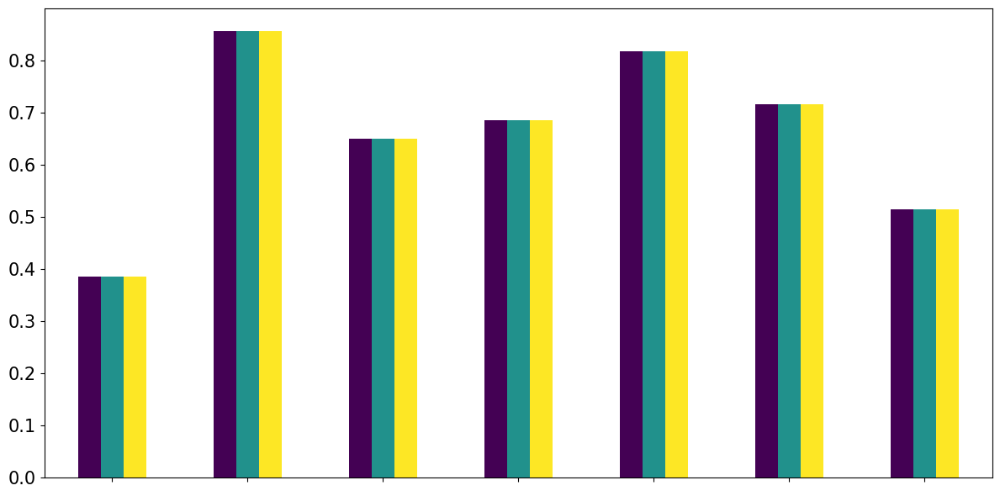

<Figure size 1200x600 with 0 Axes>

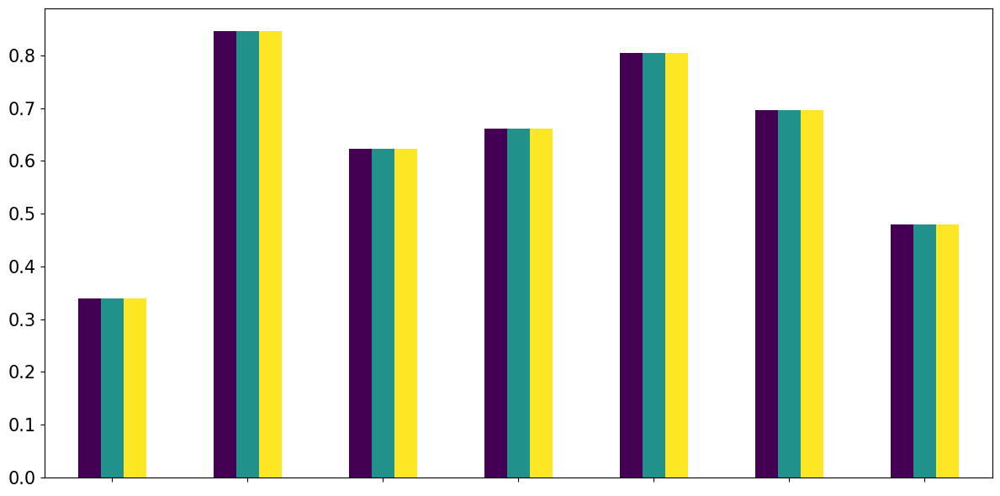

<Figure size 1200x600 with 0 Axes>

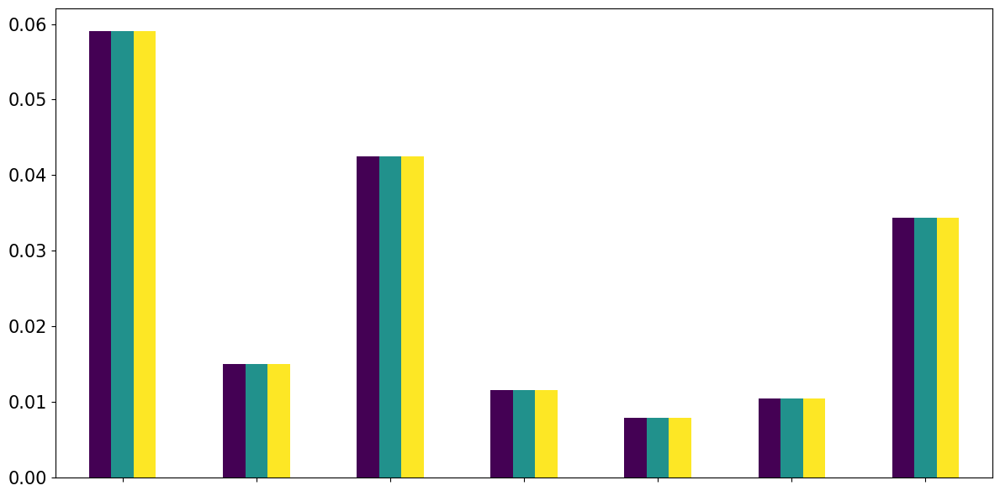

<Figure size 1200x600 with 0 Axes>

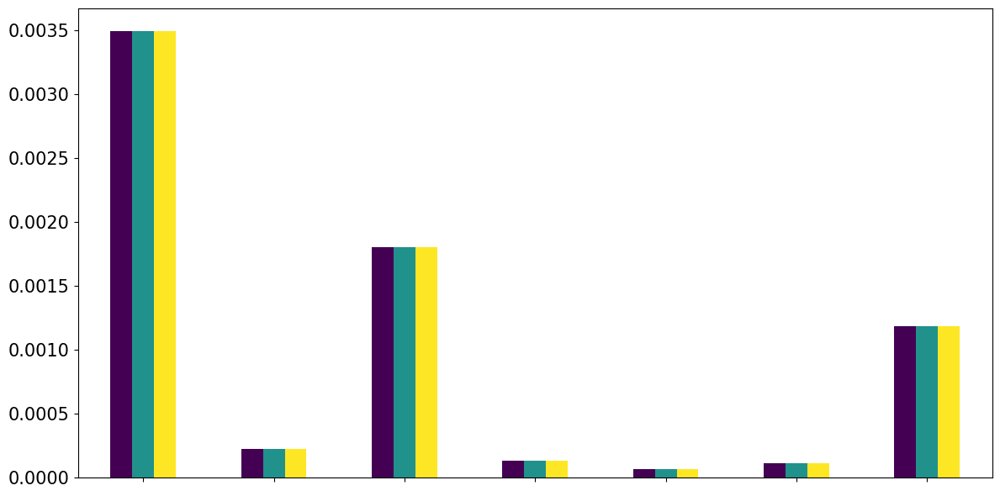

In [14]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import mutual_info_regression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import numpy as np

# === Load data
with open("recovery_results.pkl", "rb") as f:
    recovery_data = pickle.load(f)

with open("all_possible_attributes.pkl", "rb") as f:
    all_attr_data = pickle.load(f)

required_methods = ["Domirank", "Betweenness","Degree","Greedy", "Closeness", "Eigen", "Random"]
selected_attributes = [
    'Nodes', 'Avg_Degree', 'Density', 'Diameter', 'Clustering_Coefficient',
    'Avg_SPL', 'Modularity_Index', 'Normalized_Number_of_Loops',
    'Avg_Betweenness_Centrality', 'Avg_Closeness_Centrality',
    'Avg_Eigenvector_Centrality', 'Assortativity', 'Local_Efficiency',
    'CV', 'Gini', 'Rich_Club', 'Degree_Variance'
]

# === Conflict rules
conflict_resolution = {
    # frozenset(["Nodes", "Density"]): "Density",
    # frozenset(["Avg_Degree", "Normalized_Number_of_Loops"]): "Normalized_Number_of_Loops",
    # frozenset(["Avg_SPL", "Diameter"]): "Avg_SPL"
}

def apply_conflict_resolution(features):
    features = set(features)
    for conflict_set, keep in conflict_resolution.items():
        if conflict_set.issubset(features):
            to_remove = list(conflict_set - {keep})[0]
            features.remove(to_remove)
    return list(features)

def apply_conflict_resolution_with_substitution(features):
    features = set(features)
    for conflict_set, keep in conflict_resolution.items():
        if conflict_set.issubset(features):
            to_remove = list(conflict_set - {keep})[0]
            features.remove(to_remove)
    for conflict_set, keep in conflict_resolution.items():
        for f in conflict_set:
            if f in features and f != keep:
                features.remove(f)
                features.add(keep)
    return list(features)

def evaluate_model(X, y):
    model = LinearRegression().fit(X, y)
    y_pred = model.predict(X)
    r2 = r2_score(y, y_pred)
    rmse = np.sqrt(mean_squared_error(y, y_pred))
    mse = mean_squared_error(y, y_pred)
    n, k = X.shape
    adj_r2 = 1 - ((1 - r2) * (n - 1)) / (n - k - 1) if n > k + 1 else r2
    return model, r2, adj_r2, rmse, mse

# === Prepare Data
valid_cities = []
for city in recovery_data:
    if city not in all_attr_data:
        continue
    # Check all required methods present in AUCs
    if not all(m in recovery_data[city]["recovery_auc"] for m in required_methods):
        continue
    # Check if all required attributes are present in the new data
    if not all(attr in all_attr_data[city] for attr in selected_attributes):
        continue
    valid_cities.append(city)


attr_df = pd.DataFrame(all_attr_data).T
attr_df = attr_df.loc[valid_cities, required_attributes]

auc_df = pd.DataFrame([
    recovery_data[city]["recovery_auc"] for city in valid_cities
], index=valid_cities)[required_methods]

# === MI scores
mi_scores = {
    method: dict(zip(attr_df.columns, mutual_info_regression(attr_df, auc_df[method], random_state=42)))
    for method in required_methods
}

# === Store and evaluate
metrics_by_method = {m: {} for m in required_methods}
equations_by_method = {m: {} for m in required_methods}

for method in required_methods:
    y = auc_df[method].values

    # 1. All Variables
    X_all = attr_df
    model, r2, adj_r2, rmse, mse = evaluate_model(X_all, y)
    metrics_by_method[method]["All Variables"] = (r2, adj_r2, rmse, mse)
    equation = " + ".join([f"({c:.4f} * {n})" for c, n in zip(model.coef_, X_all.columns)])
    equations_by_method[method]["All Variables"] = f"{model.intercept_:.4f} + {equation}"

    # 2. Top 3 MI
    top3 = sorted(mi_scores[method].items(), key=lambda x: x[1], reverse=True)[:3]
    top3_features = [f for f, _ in top3]
    X_top3 = attr_df[top3_features]
    model, r2, adj_r2, rmse, mse = evaluate_model(X_top3, y)
    metrics_by_method[method]["Top 3 MI"] = (r2, adj_r2, rmse, mse)
    equation = " + ".join([f"({c:.4f} * {n})" for c, n in zip(model.coef_, X_top3.columns)])
    equations_by_method[method]["Top 3 MI"] = f"{model.intercept_:.4f} + {equation}"

    # 3. Drop Conflicts
    top3_filtered = apply_conflict_resolution(top3_features)
    X_filtered = attr_df[top3_filtered]
    model, r2, adj_r2, rmse, mse = evaluate_model(X_filtered, y)
    metrics_by_method[method]["Drop Conflicts"] = (r2, adj_r2, rmse, mse)
    equation = " + ".join([f"({c:.4f} * {n})" for c, n in zip(model.coef_, X_filtered.columns)])
    equations_by_method[method]["Drop Conflicts"] = f"{model.intercept_:.4f} + {equation}"

    # 4. Substitute Conflicts
    top3_sub = apply_conflict_resolution_with_substitution(top3_features)
    X_sub = attr_df[top3_sub]
    model, r2, adj_r2, rmse, mse = evaluate_model(X_sub, y)
    metrics_by_method[method]["Substitute Conflicts"] = (r2, adj_r2, rmse, mse)
    equation = " + ".join([f"({c:.4f} * {n})" for c, n in zip(model.coef_, X_sub.columns)])
    equations_by_method[method]["Substitute Conflicts"] = f"{model.intercept_:.4f} + {equation}"

# === Convert metrics to DataFrames
# strategies = ["All Variables", "Top 3 MI", "Drop Conflicts", "Substitute Conflicts"]
strategies = ["Top 3 MI", "Drop Conflicts", "Substitute Conflicts"]
metric_names = ["R2", "Adj_R2", "RMSE", "MSE"]

dfs = {m: pd.DataFrame(index=required_methods, columns=strategies) for m in metric_names}
for method in required_methods:
    for strat in strategies:
        for i, metric in enumerate(metric_names):
            dfs[metric].loc[method, strat] = metrics_by_method[method][strat][i]

# === Print equations
for method in required_methods:
    print(f"\n📘 {method}")
    for strat in strategies:
        eq = equations_by_method[method][strat]
        r2 = metrics_by_method[method][strat][0]
        adjusted_r2=metrics_by_method[method][strat][1]
        rmse=metrics_by_method[method][strat][2]
        mse=metrics_by_method[method][strat][3]
        print(f"🔹 {strat}:")
        print(f"  Equation: y = {eq}")
        print(f"  R² = {r2:.3f}")
        print(f"  Adjusted R² = {adjusted_r2:.3f}")
        print(f"  RMSE = {rmse:.3f}")
        print(f"  MSE = {mse:.3f}")

titles = {
    "R2": "R² Score", "Adj_R2": "Adjusted R²",
    "RMSE": "Root Mean Squared Error", "MSE": "Mean Absolute Error"
}

for metric, df in dfs.items():
    df = df.astype(float)
    plt.figure(figsize=(12, 6))
    ax = df.plot(kind="bar", figsize=(12, 6), colormap="viridis", rot=0)

    # Remove legend safely
    legend = ax.get_legend()
    if legend:
        legend.set_visible(False)

    # Set tick font size
    ax.tick_params(axis='both', labelsize=15)
    ax.set_xticklabels([])
    # plt.ylabel(titles[metric], fontsize=20)
    # plt.title(f"{titles[metric]} Comparison Across Interpretability Strategies", fontsize=22)
    plt.tight_layout()
    # plt.savefig(f"fig_4/recovery/{metric.lower()}_comparison.svg", format='svg', dpi=600)
    plt.show()


📉 Minimum AUC: 0.047
📈 Maximum AUC: 0.353


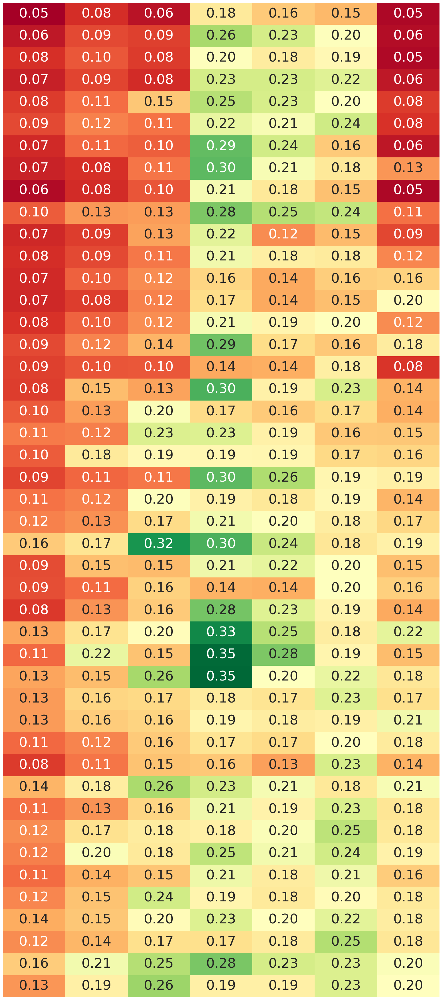

In [6]:
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Load the failure results pickle file
with open("failure_results.pkl", "rb") as f:
    results = pickle.load(f)

# Extract failure AUC and network attributes
auc_df = pd.DataFrame({city: res['failure_auc'] for city, res in results.items()}).T
attr_df = pd.DataFrame({city: res['network_attributes'] for city, res in results.items()}).T

# Define and filter method order
methods_ordered = ['Domirank','Betweenness','Degree', 'Eigen','Closeness' ,'Random','Greedy']
auc_df = auc_df[methods_ordered]

# Sort networks by node count
sorted_index = attr_df.sort_values(by="Nodes", ascending=False).index
auc_df_sorted = auc_df.loc[sorted_index]

# Determine min and max AUC values
min_auc = auc_df_sorted.min().min()
max_auc = auc_df_sorted.max().max()
print(f"📉 Minimum AUC: {min_auc:.3f}")
print(f"📈 Maximum AUC: {max_auc:.3f}")

# Plot heatmap without axis text or legend
plt.figure(figsize=(16, 36))
ax = sns.heatmap(auc_df_sorted, annot=True, fmt=".2f", cmap='RdYlGn', cbar=False,
                 xticklabels=False, yticklabels=False, annot_kws={"size": 35})

plt.title("")  # No title
plt.xlabel("")
plt.ylabel("")
plt.tight_layout()
# plt.savefig("extended_material/ext_fig_1/failure_heatmap.svg", format='svg', dpi=600)
plt.savefig("fig_2/failure_heatmap.svg", format='svg', dpi=600)
plt.show()


📉 Minimum AUC: 0.359
📈 Maximum AUC: 0.799


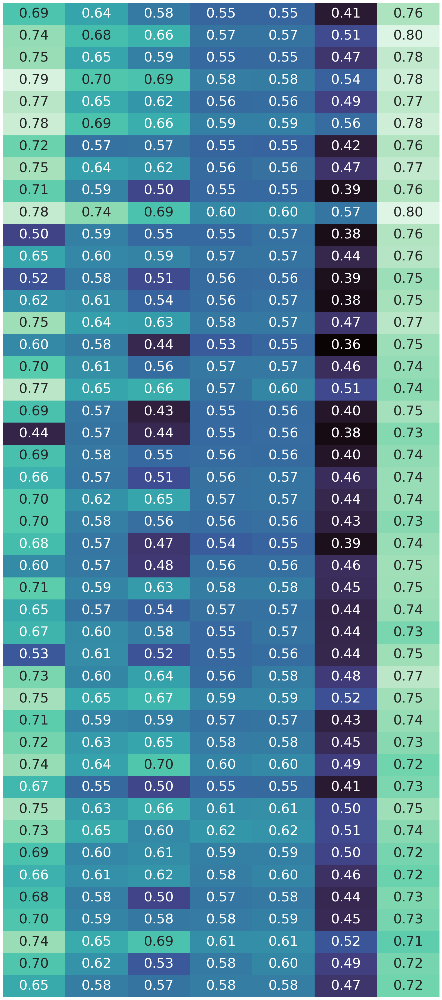

In [7]:
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Load the failure results pickle file
with open("recovery_results.pkl", "rb") as f:
    results = pickle.load(f)

# Extract recovery AUC and network attributes
auc_df = pd.DataFrame({city: res['recovery_auc'] for city, res in results.items()}).T
attr_df = pd.DataFrame({city: res['network_attributes'] for city, res in results.items()}).T

# Define and filter method order
methods_ordered = ['Domirank','Betweenness','Degree', 'Eigen','Closeness' ,'Random','Greedy']
auc_df = auc_df[methods_ordered]

# Sort networks by node count
sorted_index = attr_df.sort_values(by="Nodes", ascending=False).index
auc_df_sorted = auc_df.loc[sorted_index]

# Determine min and max AUC values
min_auc = auc_df_sorted.min().min()
max_auc = auc_df_sorted.max().max()
print(f"📉 Minimum AUC: {min_auc:.3f}")
print(f"📈 Maximum AUC: {max_auc:.3f}")

# Plot heatmap without axis text or legend
plt.figure(figsize=(16, 36))
ax = sns.heatmap(auc_df_sorted, annot=True, fmt=".2f", cmap='mako', cbar=False,
                 xticklabels=False, yticklabels=False, annot_kws={"size": 35})

plt.title("")  # No title
plt.xlabel("")
plt.ylabel("")
plt.tight_layout()
# plt.savefig("extended_material/ext_fig_2/recovery_heatmap.svg", format='svg', dpi=600)
plt.savefig("fig_2/recovery_heatmap.svg", format='svg', dpi=600)
plt.show()


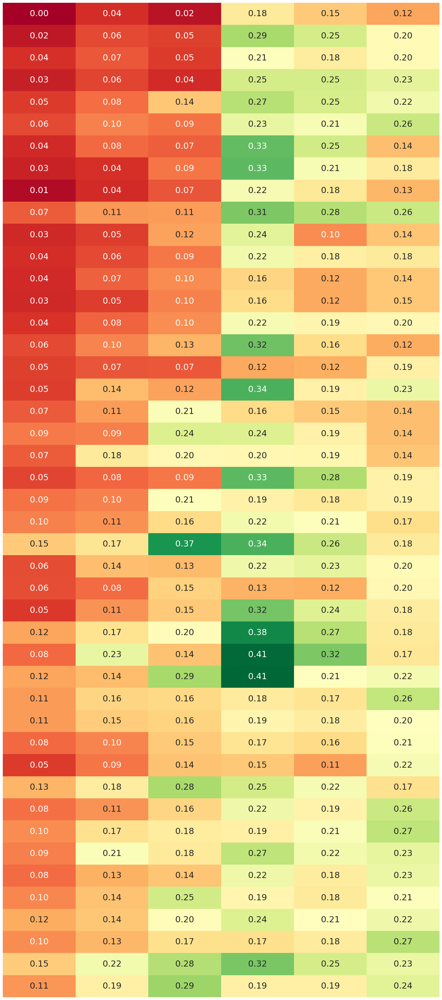

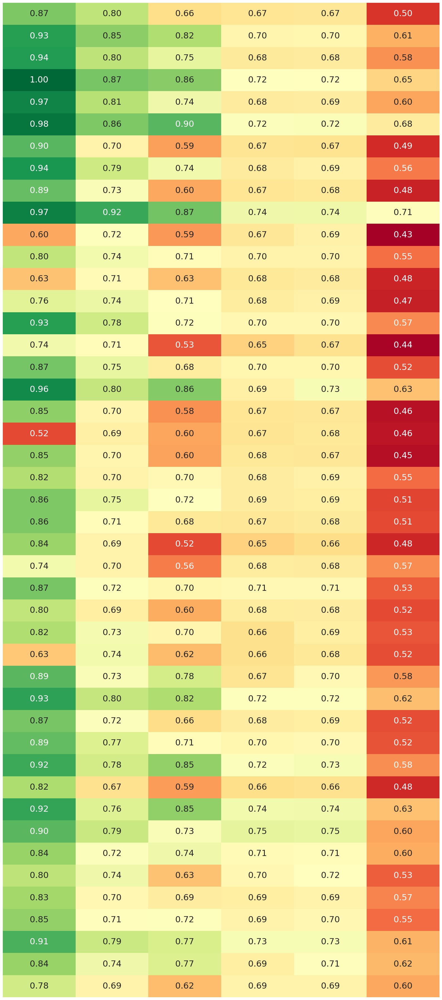

In [56]:
# Re-import required libraries after code execution environment reset
import pickle
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load recovery and failure results
with open("recovery_results.pkl", "rb") as f:
    recovery_results = pickle.load(f)

with open("failure_results.pkl", "rb") as f:
    failure_results = pickle.load(f)

# Extract AUCs and attributes
recovery_auc_df = pd.DataFrame({city: res['recovery_auc'] for city, res in recovery_results.items()}).T
failure_auc_df = pd.DataFrame({city: res['failure_auc'] for city, res in failure_results.items()}).T
attr_df = pd.DataFrame({city: res['network_attributes'] for city, res in recovery_results.items()}).T

# Ensure same method order
methods_ordered = ['Domirank', 'Betweenness', 'Degree', 'Eigen', 'Closeness', 'Random']
recovery_auc_df = recovery_auc_df[methods_ordered]
failure_auc_df = failure_auc_df[methods_ordered]

# Combine and min-max normalize across both failure and recovery
combined_auc = pd.concat([failure_auc_df, recovery_auc_df])
min_val = combined_auc.min().min()
max_val = combined_auc.max().max()

# Normalize
failure_auc_normalized = (failure_auc_df - min_val) / (max_val - min_val)
recovery_auc_normalized = (recovery_auc_df - min_val) / (max_val - min_val)

# Sort by Nodes (descending)
sorted_index = attr_df.sort_values(by="Nodes", ascending=False).index
failure_auc_sorted = failure_auc_normalized.loc[sorted_index]
recovery_auc_sorted = recovery_auc_normalized.loc[sorted_index]

# Plot failure heatmap
plt.figure(figsize=(16, 36))
sns.heatmap(failure_auc_sorted, annot=True, fmt=".2f", cmap='RdYlGn', cbar=False,
            xticklabels=False, yticklabels=False, annot_kws={"size": 22})
plt.tight_layout()
plt.savefig("fig_2/failure_heatmap_normalized.svg", format='svg', dpi=600)
plt.show()

# Plot recovery heatmap
plt.figure(figsize=(16, 36))
sns.heatmap(recovery_auc_sorted, annot=True, fmt=".2f", cmap='RdYlGn', cbar=False,
            xticklabels=False, yticklabels=False, annot_kws={"size": 22})
plt.tight_layout()
plt.savefig("fig_2/recovery_heatmap_normalized.svg", format='svg', dpi=600)
plt.show()


## Real World Vs Synthetic Railways

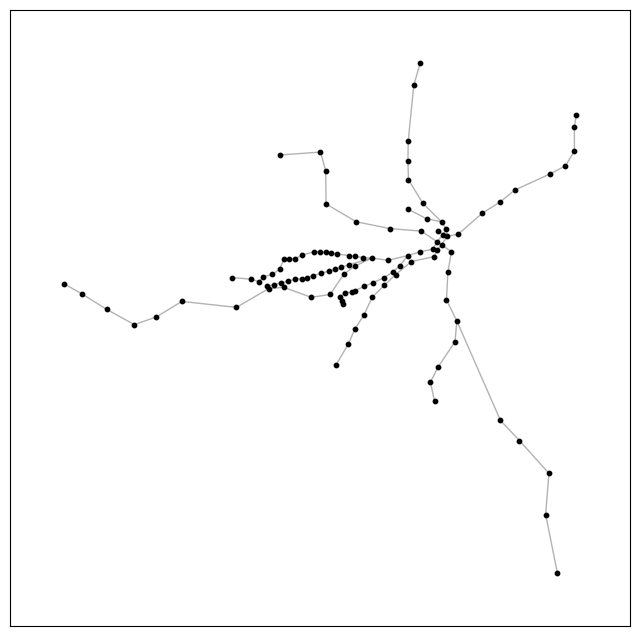

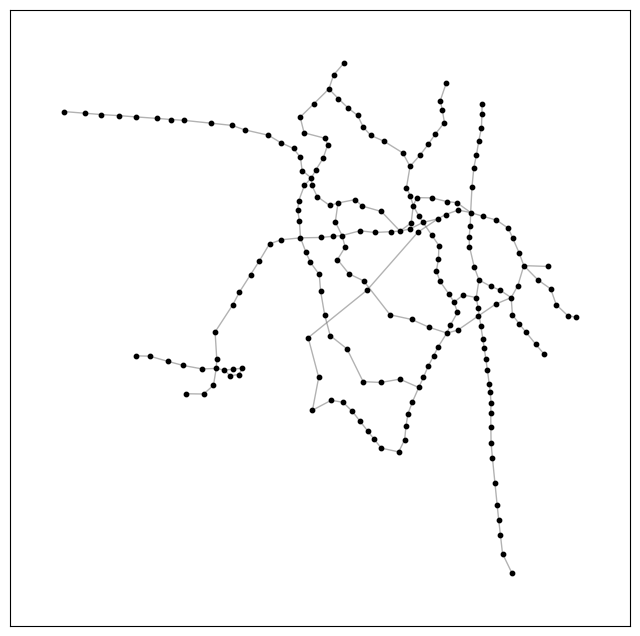

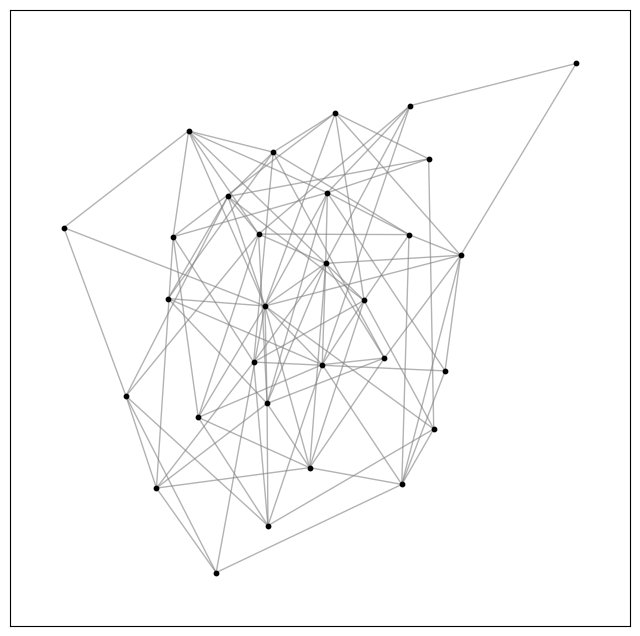

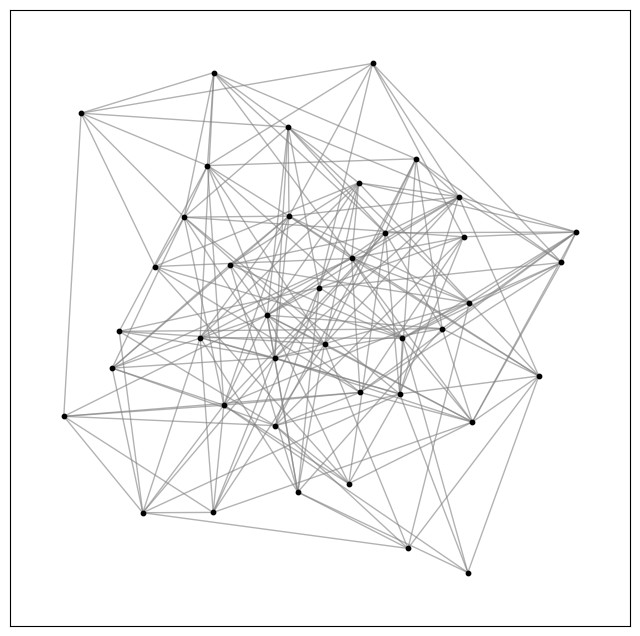

In [44]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os

# Load real metro networks
real_cities = {
    "Boston": {
        "nodes": pd.read_csv("../Boston_MBTA/Node_CSV.csv", encoding='latin-1'),
        "edges": pd.read_csv("../Boston_MBTA/Edge_CSV.csv", encoding='latin-1')
    },
    "Delhi": {
        "nodes": pd.read_csv("../Delhi_Metro/Node_CSV.csv", encoding='latin-1'),
        "edges": pd.read_csv("../Delhi_Metro/Edge_CSV.csv", encoding='latin-1')
    }
}

real_graphs = {}
real_positions = {}

for city, data in real_cities.items():
    edges = list(zip(data['edges']['Source'], data['edges']['Target']))
    G = nx.Graph()
    G.add_edges_from(edges)
    pos = {row['ID']: (row['Lon'], row['Lat']) for _, row in data['nodes'].iterrows()}
    real_graphs[city] = G
    real_positions[city] = pos

# === Create dense synthetic graphs ===
dense_graphs = {
    "Synthetic_30": nx.gnm_random_graph(30, 100), 
    "Synthetic_40": nx.gnm_random_graph(40, 200)  
}

# Random layout for visual noise
dense_positions = {name: nx.spring_layout(graph, seed=42) for name, graph in dense_graphs.items()}

# Save directory
# os.makedirs("fig_1", exist_ok=True)

# Plot all
for name, G in {**real_graphs, **dense_graphs}.items():
    pos = real_positions[name] if name in real_positions else dense_positions[name]

    plt.figure(figsize=(8, 8))
    ax = plt.gca()
    nx.draw_networkx_edges(G, pos=pos, edge_color="gray", alpha=0.6, ax=ax)
    nx.draw_networkx_nodes(G, pos=pos, node_color='black', node_size=10, ax=ax)
    ax.set_facecolor('white')
    plt.axis("on")
    plt.grid(False)
    filename = f"extended_material/ext_fig_3/{name.lower()}_network.svg"
    plt.savefig(filename, format='svg', dpi=600, bbox_inches='tight')
    plt.show()
    # plt.close()


## Attributes Box Plot

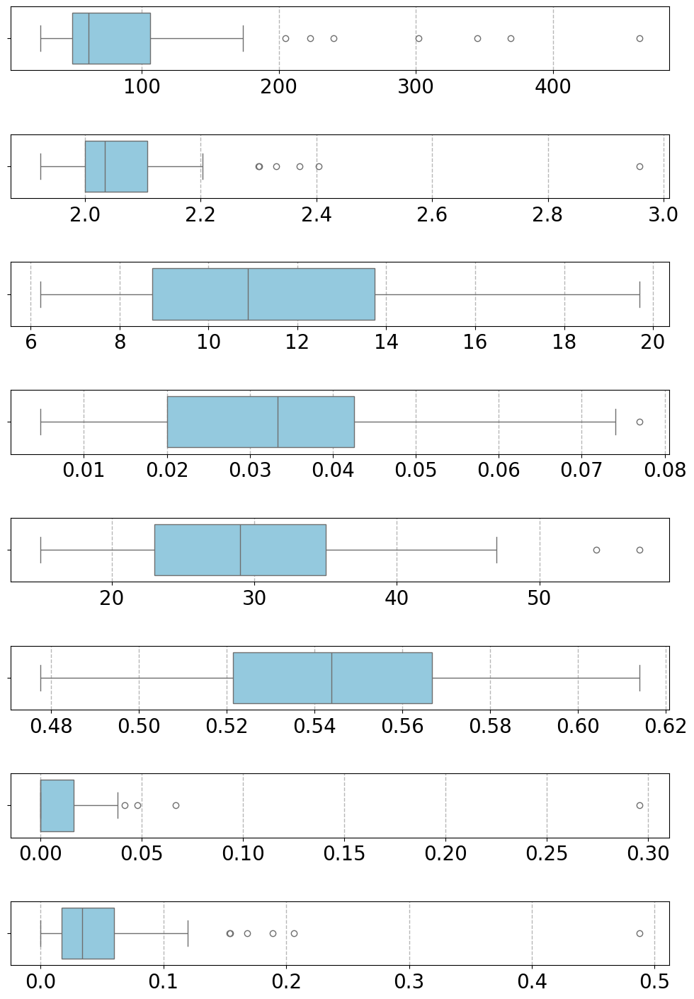

In [13]:
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Load the results
with open("failure_results.pkl", "rb") as f:
    results = pickle.load(f)

# Prepare the data
network_data = []
for city, data in results.items():
    attributes = {
        "City": city,
        "Nodes": data["network_attributes"]["Nodes"],
        "Avg_Degree": data["network_attributes"]["Avg_Degree"],
        "Avg_SPL": data["network_attributes"]["Avg_SPL"],
        "Density": data["network_attributes"]["Density"],
        "Diameter": data["network_attributes"]["Diameter"],
        "Modularity_Index": data["network_attributes"]["Modularity_Index"],
        "Clustering_Coefficient": data["network_attributes"]["Clustering_Coefficient"],
        "Normalized_Number_of_Loops": data["network_attributes"]["Normalized_Number_of_Loops"]
    }
    network_data.append(attributes)

# Convert to DataFrame
df = pd.DataFrame(network_data)

# Create output folder
# os.makedirs("extended_material/ext_fig_4", exist_ok=True)

# Plotting: One boxplot per attribute
num_attributes = len(df.columns) - 1  # Exclude 'City'
fig, axes = plt.subplots(num_attributes, 1, figsize=(12, num_attributes * 2.2), sharex=False)

for i, attribute in enumerate(df.columns[1:]):  # Skip 'City'
    sns.boxplot(x=df[attribute], ax=axes[i], color="skyblue")
    # axes[i].set_title(f"{attribute}", fontsize=12, loc="left")
    axes[i].set_xlabel("")  # ❌ No x-axis label
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].grid(True, axis='x', linestyle='--', linewidth=1, alpha=0.9)

# Adjust vertical spacing
plt.subplots_adjust(hspace=1)  # ⬅️ Increase spacing here

# Save figure
plt.savefig("extended_material/ext_fig_4/network_attributes_boxplot_spaced.svg", format='svg', dpi=600)
plt.show()


In [14]:
results

{'WashingtonDc': {'network_attributes': {'Nodes': 91,
   'Avg_Degree': 2.043956043956044,
   'Avg_SPL': 11.508669108669109,
   'Density': 0.02271062271062271,
   'Diameter': 28,
   'Modularity_Index': 0.5672910163024628,
   'Clustering_Coefficient': 0.0,
   'Number_of_Loops': 3,
   'Normalized_Number_of_Loops': 0.03296703296703297,
   'Algebraic_Connectivity': 0.01108612180814607,
   'Assortativity': 0.03337997201679053,
   'Rich_Club_Coefficient': 0.06763753222086555,
   'Transitivity': 0,
   'Global_Efficiency': 0.13929150141053523,
   'Local_Efficiency': 0.0,
   'Avg_Eccentricity': 21.395604395604394,
   'Network_Entropy': 0.7494437051132646,
   'CV': 0.30696994459398275},
  'failure_auc': {'Random': 0.18366220735785954,
   'Closeness': 0.13945293836598185,
   'Betweenness': 0.09728858098423317,
   'Eigen': 0.1375418060200669,
   'Degree': 0.09812470138557094,
   'Domirank': 0.08558289536550405,
   'Greedy': 0.0798494983277592},
  'performance_series': {'Random': [1.0,
    0.9516483

## Extended figure 5

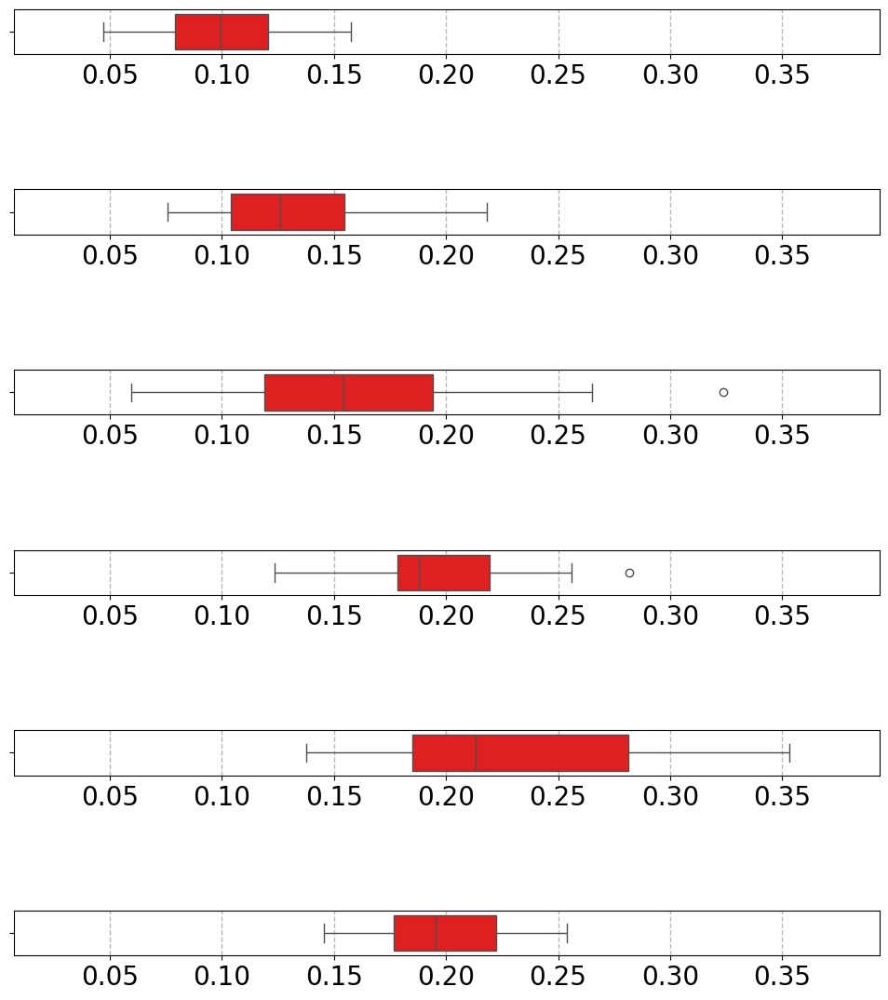

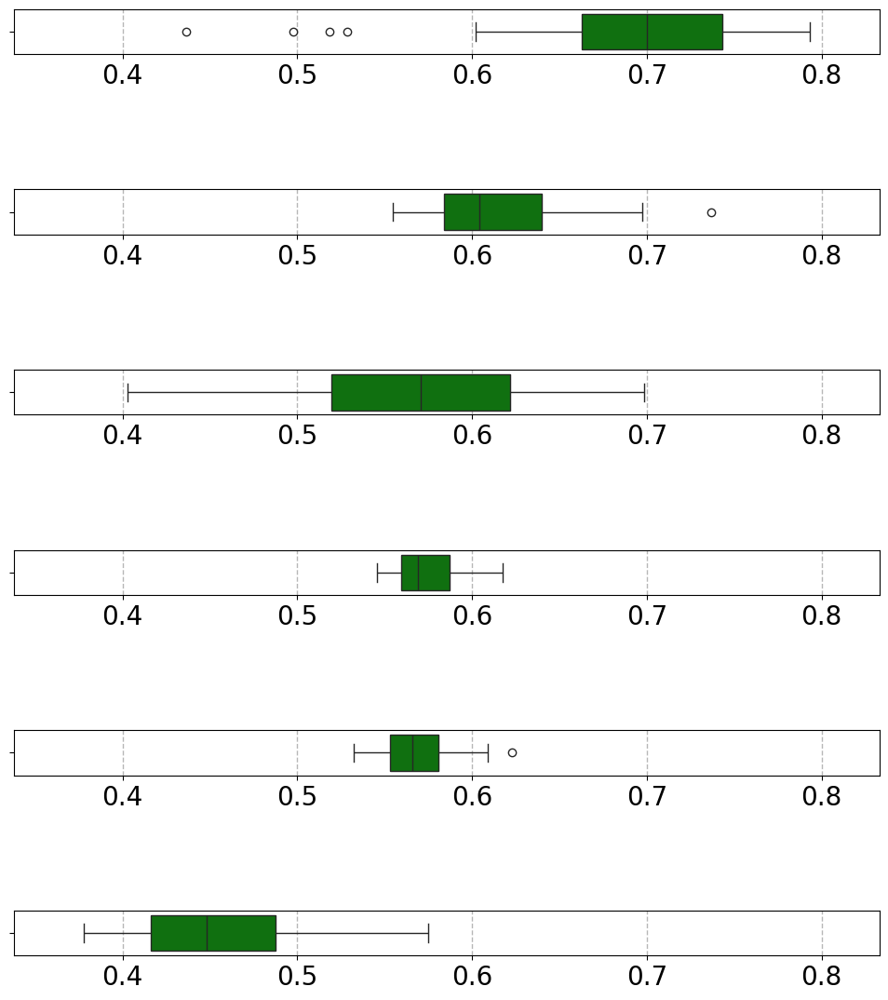

In [47]:
import pickle
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Load both failure and recovery results
with open("failure_results.pkl", "rb") as f:
    failure_data = pickle.load(f)

with open("recovery_results.pkl", "rb") as f:
    recovery_data = pickle.load(f)

# Ensure export folders exist
# os.makedirs("extended_material/ext_fig_4", exist_ok=True)

# === Order to enforce based on user-provided figure
ordered_methods = ["Domirank", "Betweenness", "Degree", "Closeness", "Eigen", "Random"]

# Define plotting function
def plot_auc_boxplots(data_dict, scenario_type="Failure"):
    # Extract method-wise AUCs into DataFrame
    df = pd.DataFrame({city: data[f"{scenario_type.lower()}_auc"] for city, data in data_dict.items()}).T
    df = df[ordered_methods]  # Reorder columns as per desired order

    # Compute global min and max with padding
    global_min = df.min().min()
    global_max = df.max().max()
    padding = 0.04
    xlim = (global_min - padding, global_max + padding)

    num_methods = len(df.columns)
    fig, axes = plt.subplots(num_methods, 1, figsize=(12, num_methods * 2.2), sharex=False)

    for i, method in enumerate(df.columns):
        sns.boxplot(x=df[method], ax=axes[i], color="green" if scenario_type == "Recovery" else "red")
        axes[i].set_xlim(xlim)  # Set consistent x-axis limits
        axes[i].set_xlabel("")
        axes[i].tick_params(axis='x', labelsize=20)
        axes[i].grid(True, axis='x', linestyle='--', linewidth=1, alpha=0.9)

    plt.subplots_adjust(hspace=3)
    filename = f"extended_material/ext_fig_5/{scenario_type.lower()}_auc_boxplots_ordered.svg"
    plt.savefig(filename, format="svg", dpi=600)
    plt.show()


# === Generate ordered box plots
plot_auc_boxplots(failure_data, scenario_type="Failure")
plot_auc_boxplots(recovery_data, scenario_type="Recovery")


## Scatter plots

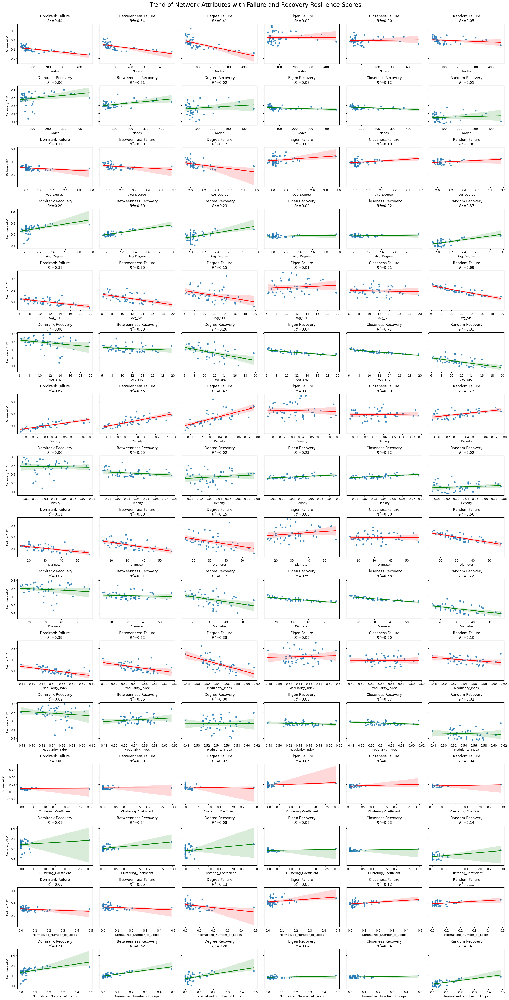

In [124]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import linregress
import pandas as pd
import pickle

# Load full_df_sorted from local files
with open("failure_results.pkl", "rb") as f:
    failure_data = pickle.load(f)

with open("recovery_results.pkl", "rb") as f:
    recovery_data = pickle.load(f)

# Combine into a DataFrame
combined_data = []
for city in failure_data:
    attrs = failure_data[city]["network_attributes"]
    row = {"City": city}
    row.update(attrs)
    for method in failure_data[city]["failure_auc"]:
        row[f"{method}_Failure"] = failure_data[city]["failure_auc"][method]
    for method in recovery_data[city]["recovery_auc"]:
        row[f"{method}_Recovery"] = recovery_data[city]["recovery_auc"][method]
    combined_data.append(row)

full_df_sorted = pd.DataFrame(combined_data)

# Variables to check
network_vars = ["Nodes", "Avg_Degree", "Avg_SPL", "Density", "Diameter",
                "Modularity_Index", "Clustering_Coefficient", "Normalized_Number_of_Loops"]

# Methods (y-axis) - resilience scores
methods = ["Domirank", "Betweenness", "Degree", "Eigen", "Closeness", "Random"]

# Create a single wide figure
fig, axes = plt.subplots(2 * len(network_vars), len(methods), figsize=(4 * len(methods), 3 * 2 * len(network_vars)), sharey='row')

for i, attr in enumerate(network_vars):
    for j, method in enumerate(methods):
        # Failure
        x = full_df_sorted[attr]
        y_failure = full_df_sorted[f"{method}_Failure"]
        slope_f, intercept_f, r_val_f, _, _ = linregress(x, y_failure)

        ax_f = axes[2 * i][j]
        sns.regplot(x=x, y=y_failure, ax=ax_f, scatter_kws={"s": 20}, line_kws={"color": "red"})
        ax_f.set_title(f"{method} Failure\n$R^2$={r_val_f**2:.2f}")
        ax_f.set_xlabel(attr)
        ax_f.set_ylabel("Failure AUC" if j == 0 else "")

        # Recovery
        y_recovery = full_df_sorted[f"{method}_Recovery"]
        slope_r, intercept_r, r_val_r, _, _ = linregress(x, y_recovery)

        ax_r = axes[2 * i + 1][j]
        sns.regplot(x=x, y=y_recovery, ax=ax_r, scatter_kws={"s": 20}, line_kws={"color": "green"})
        ax_r.set_title(f"{method} Recovery\n$R^2$={r_val_r**2:.2f}")
        ax_r.set_xlabel(attr)
        ax_r.set_ylabel("Recovery AUC" if j == 0 else "")

fig.suptitle("Trend of Network Attributes with Failure and Recovery Resilience Scores", fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.savefig("pairwise_plots/auc_with_individual_attributes.pdf",dpi=600)
plt.show()


## Higher order fitting

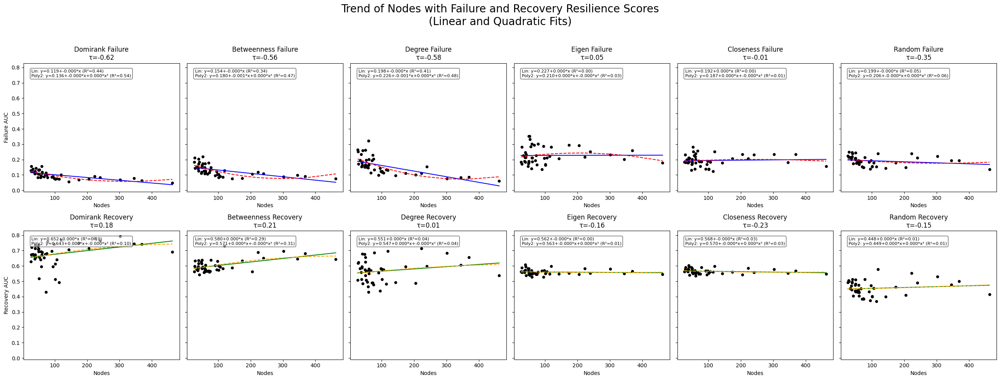

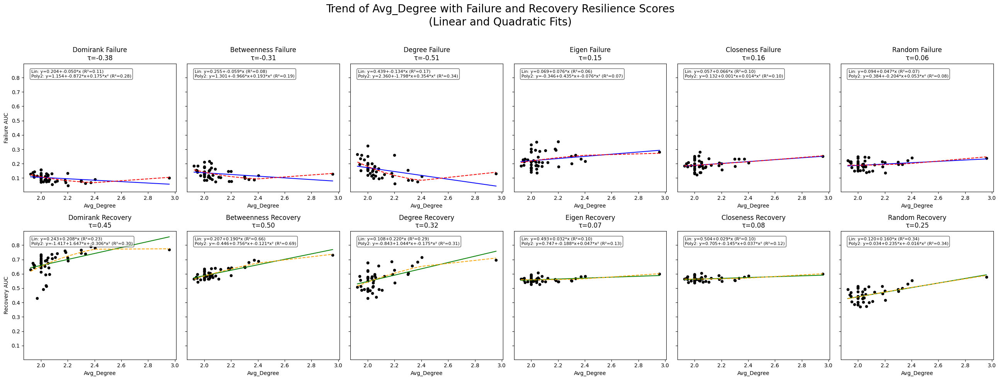

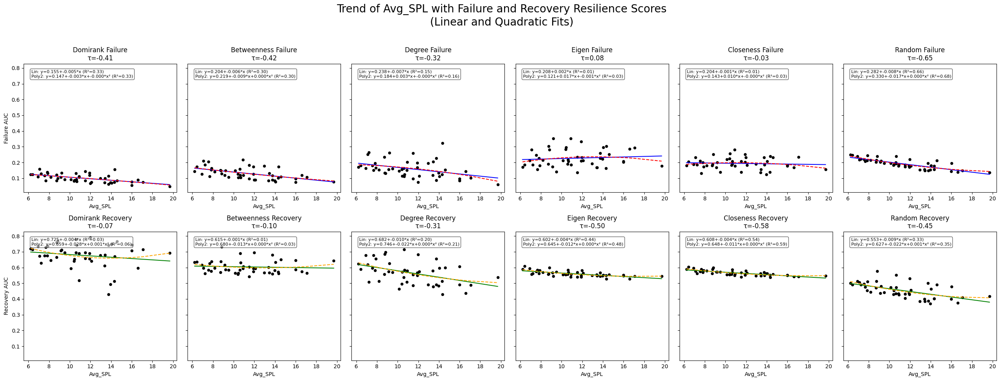

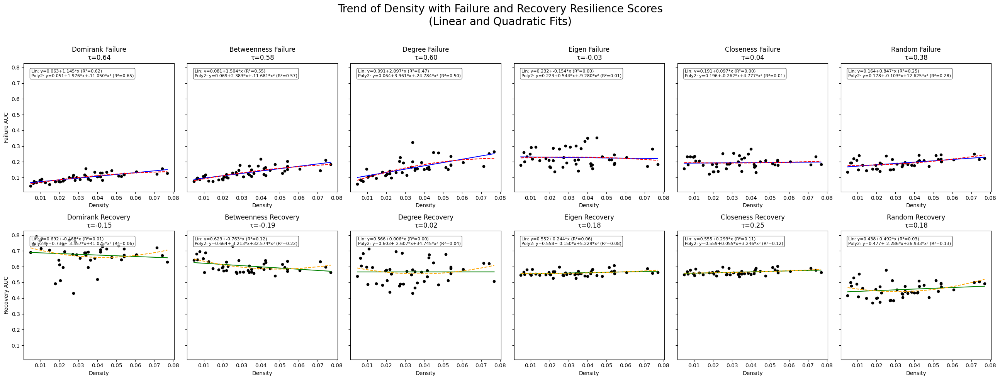

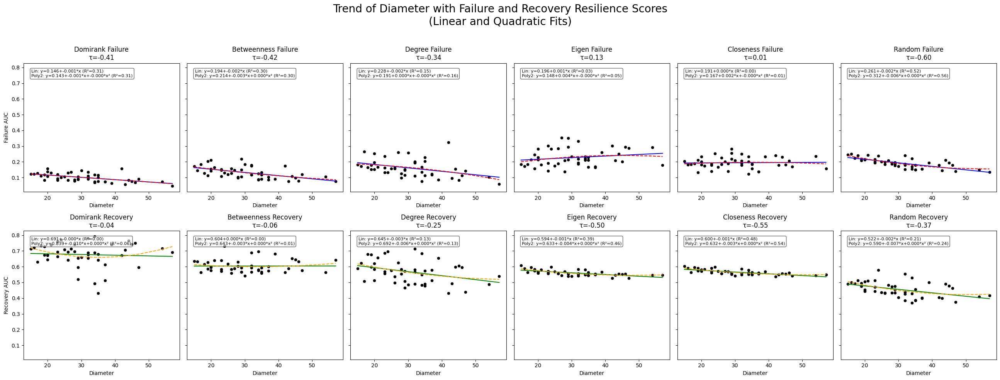

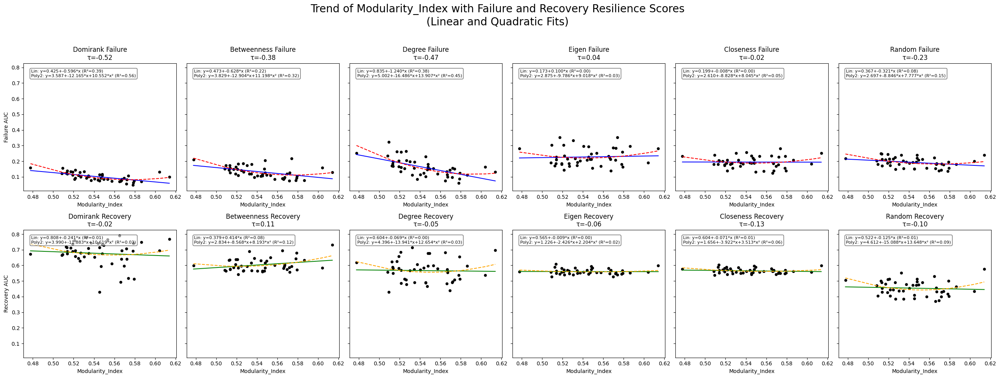

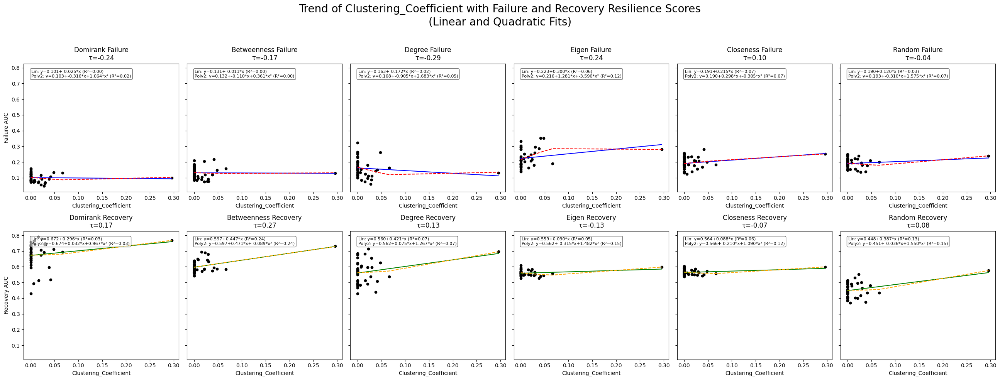

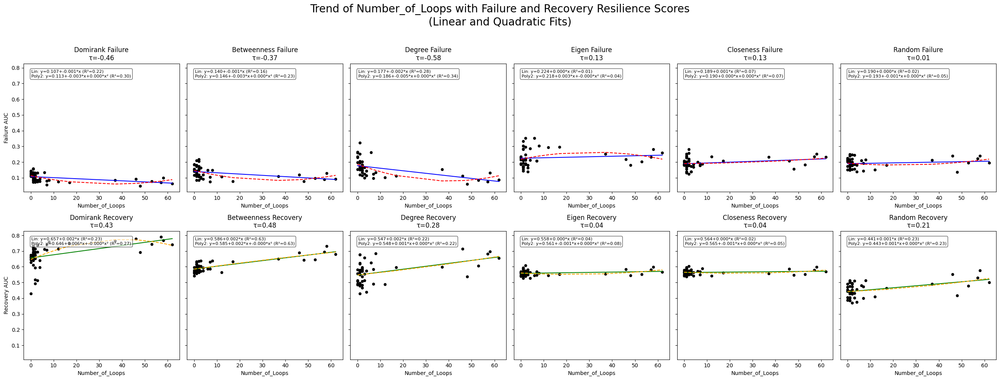

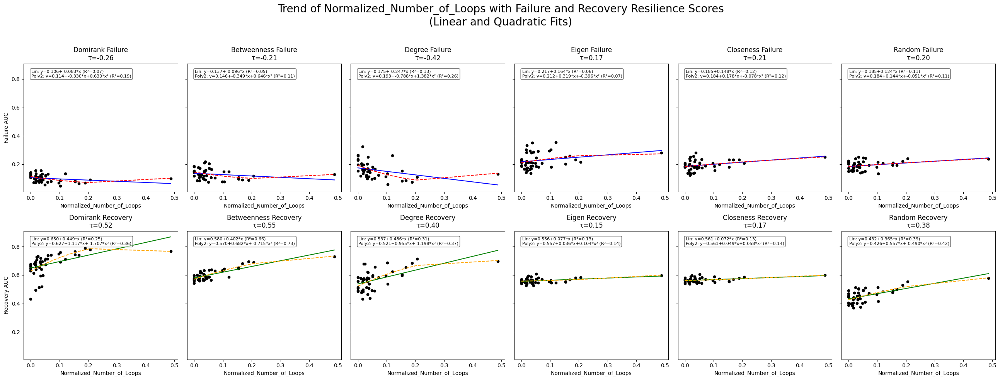

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kendalltau
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

# Variables you want to check (x-axis)
network_vars = ["Nodes", "Avg_Degree", "Avg_SPL", "Density", "Diameter",
                "Modularity_Index", "Clustering_Coefficient",
                "Number_of_Loops", "Normalized_Number_of_Loops"]

# Methods (y-axis) - resilience scores
methods = ["Domirank", "Betweenness", "Degree", "Eigen", "Closeness", "Random"]

# Polynomial features generator for degree 2
poly2 = PolynomialFeatures(degree=2, include_bias=False)

# Plot for each network attribute vs Failure and Recovery AUC
for attr in network_vars:
    fig, axes = plt.subplots(2, len(methods), figsize=(26, 10), sharey=True)
    
    for i, method in enumerate(methods):
        # Prepare x data
        x = full_df_sorted[attr].values.reshape(-1, 1)
        
        # --- Failure ---
        y_failure = full_df_sorted[f"{method}_Failure"].values
        tau_f, _ = kendalltau(x.flatten(), y_failure)

        # Linear regression (degree 1)
        model_linear_f = LinearRegression().fit(x, y_failure)
        y_pred_linear_f = model_linear_f.predict(x)
        r2_linear_f = r2_score(y_failure, y_pred_linear_f)

        # Polynomial regression (degree 2)
        X_poly_f = poly2.fit_transform(x)
        model_poly_f = LinearRegression().fit(X_poly_f, y_failure)
        y_pred_poly_f = model_poly_f.predict(X_poly_f)
        r2_poly_f = r2_score(y_failure, y_pred_poly_f)

        # Plot scatter points
        axes[0, i].scatter(x, y_failure, s=20, label="Data", color="black")

        # Sort x for smooth curve plotting
        sort_idx = np.argsort(x.flatten())

        # Plot linear fit
        axes[0, i].plot(x.flatten()[sort_idx], y_pred_linear_f[sort_idx], color="blue", label="Linear fit (deg 1)")

        # Plot quadratic fit
        axes[0, i].plot(x.flatten()[sort_idx], y_pred_poly_f[sort_idx], color="red", linestyle="--", label="Quadratic fit (deg 2)")

        axes[0, i].set_title(f"{method} Failure\nτ={tau_f:.2f}")
        axes[0, i].set_xlabel(attr)
        axes[0, i].set_ylabel("Failure AUC" if i == 0 else "")

        # Show equation and R²
        coef_lin_f = model_linear_f.coef_[0]
        intercept_lin_f = model_linear_f.intercept_

        coef_poly_f = model_poly_f.coef_
        intercept_poly_f = model_poly_f.intercept_

        eqn_f = (f"Lin: y={intercept_lin_f:.3f}+{coef_lin_f:.3f}*x (R²={r2_linear_f:.2f})\n"
                 f"Poly2: y={intercept_poly_f:.3f}+{coef_poly_f[0]:.3f}*x+{coef_poly_f[1]:.3f}*x² (R²={r2_poly_f:.2f})")
        
        axes[0, i].text(0.05, 0.95, eqn_f, transform=axes[0, i].transAxes, fontsize=8,
                        verticalalignment='top', bbox=dict(boxstyle="round", facecolor='white', alpha=0.6))

        # --- Recovery ---
        y_recovery = full_df_sorted[f"{method}_Recovery"].values
        tau_r, _ = kendalltau(x.flatten(), y_recovery)

        # Linear regression (degree 1)
        model_linear_r = LinearRegression().fit(x, y_recovery)
        y_pred_linear_r = model_linear_r.predict(x)
        r2_linear_r = r2_score(y_recovery, y_pred_linear_r)

        # Polynomial regression (degree 2)
        X_poly_r = poly2.fit_transform(x)
        model_poly_r = LinearRegression().fit(X_poly_r, y_recovery)
        y_pred_poly_r = model_poly_r.predict(X_poly_r)
        r2_poly_r = r2_score(y_recovery, y_pred_poly_r)

        # Plot scatter points
        axes[1, i].scatter(x, y_recovery, s=20, label="Data", color="black")

        # Plot linear fit
        axes[1, i].plot(x.flatten()[sort_idx], y_pred_linear_r[sort_idx], color="green", label="Linear fit (deg 1)")

        # Plot quadratic fit
        axes[1, i].plot(x.flatten()[sort_idx], y_pred_poly_r[sort_idx], color="orange", linestyle="--", label="Quadratic fit (deg 2)")

        axes[1, i].set_title(f"{method} Recovery\nτ={tau_r:.2f}")
        axes[1, i].set_xlabel(attr)
        axes[1, i].set_ylabel("Recovery AUC" if i == 0 else "")

        # Show equations and R²
        coef_lin_r = model_linear_r.coef_[0]
        intercept_lin_r = model_linear_r.intercept_

        coef_poly_r = model_poly_r.coef_
        intercept_poly_r = model_poly_r.intercept_

        eqn_r = (f"Lin: y={intercept_lin_r:.3f}+{coef_lin_r:.3f}*x (R²={r2_linear_r:.2f})\n"
                 f"Poly2: y={intercept_poly_r:.3f}+{coef_poly_r[0]:.3f}*x+{coef_poly_r[1]:.3f}*x² (R²={r2_poly_r:.2f})")
        
        axes[1, i].text(0.05, 0.95, eqn_r, transform=axes[1, i].transAxes, fontsize=8,
                        verticalalignment='top', bbox=dict(boxstyle="round", facecolor='white', alpha=0.6))

    fig.suptitle(f"Trend of {attr} with Failure and Recovery Resilience Scores\n(Linear and Quadratic Fits)", fontsize=20)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


## Stats for AUC

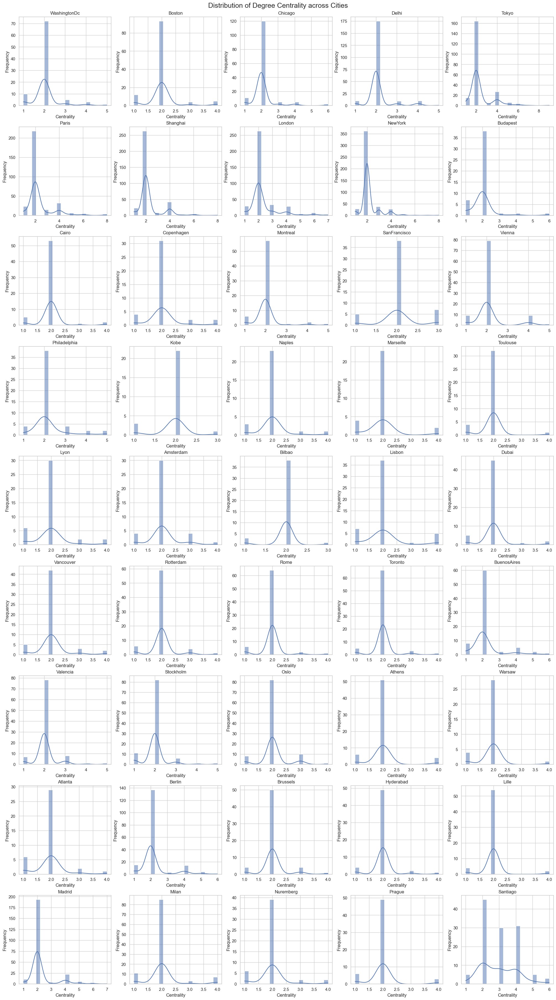

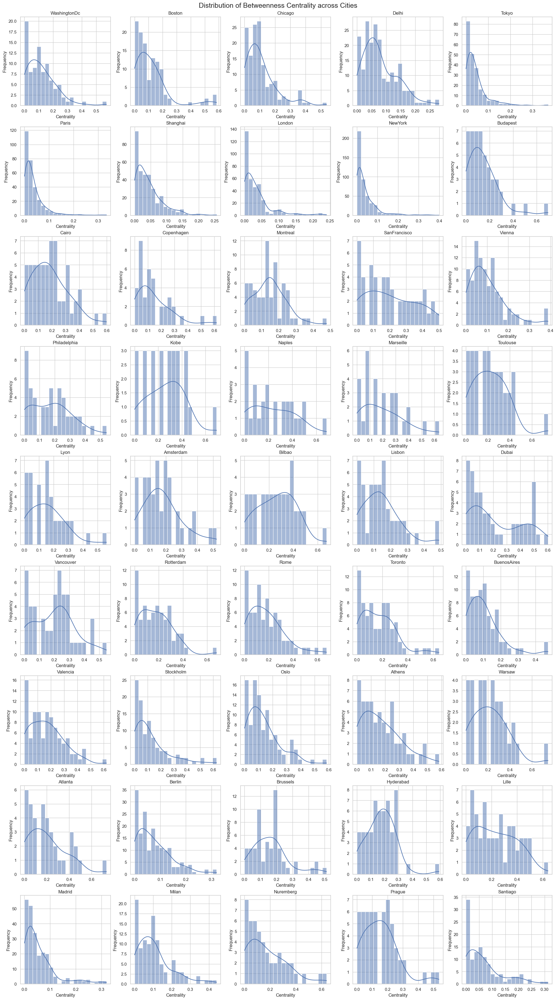

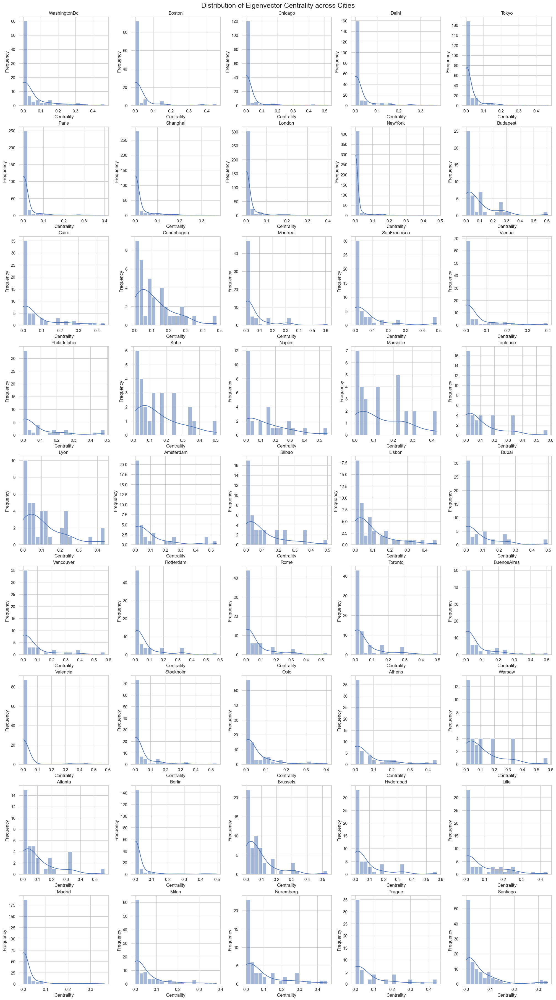

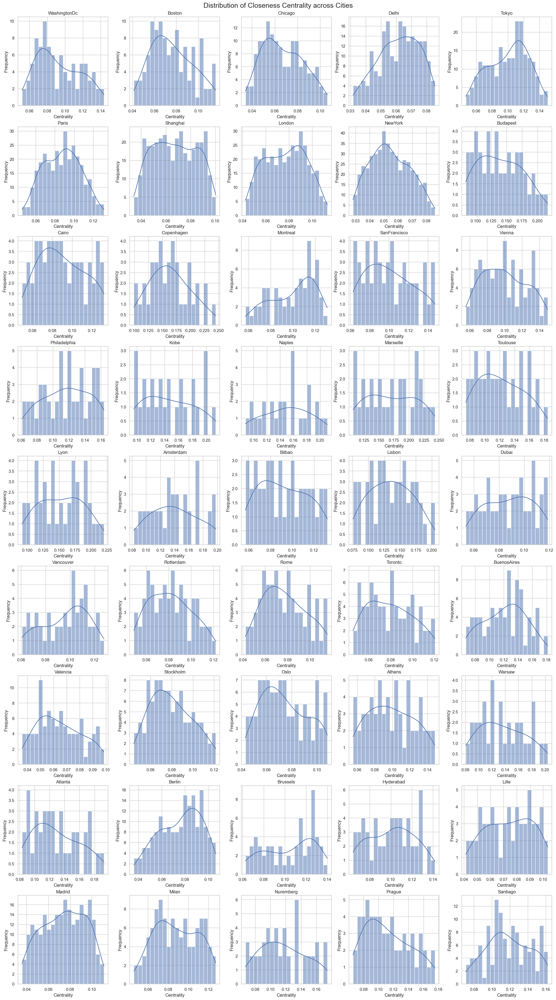

In [104]:
import pickle
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load all networks
with open("../all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

# Strategies and their corresponding NetworkX functions
centrality_funcs = {
    "Degree": lambda G: dict(G.degree()),
    "Betweenness": nx.betweenness_centrality,
    "Eigenvector": lambda G: nx.eigenvector_centrality(G, max_iter=1000),
    "Closeness": nx.closeness_centrality,
}

# Plot centrality distributions
for strategy, func in centrality_funcs.items():
    n_cols = 5
    n_rows = int(np.ceil(len(networks) / n_cols))
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows), constrained_layout=True)
    axs = axs.flatten()

    for i, (city, G) in enumerate(networks.items()):
        try:
            centralities = func(G)
            if isinstance(centralities, dict):
                values = list(centralities.values())
            else:
                values = list(dict(centralities).values())

            sns.histplot(values, bins=20, kde=True, ax=axs[i])
            axs[i].set_title(f"{city}")
            axs[i].set_xlabel("Centrality")
            axs[i].set_ylabel("Frequency")
        except Exception as e:
            axs[i].text(0.5, 0.5, f"Error: {e}", ha='center')
            axs[i].set_title(f"{city} (Error)")

    for j in range(i+1, len(axs)):
        axs[j].axis("off")

    plt.suptitle(f"Distribution of {strategy} Centrality across Cities", fontsize=18)
    plt.show()


In [28]:
# Re-import required modules after reset
import pickle
import pandas as pd
import numpy as np
from scipy.stats import iqr, skew, kurtosis

# Load the pickle files
with open("failure_results.pkl", "rb") as f:
    failure_data = pickle.load(f)

with open("recovery_results.pkl", "rb") as f:
    recovery_data = pickle.load(f)

strategies = ["Domirank", "Betweenness", "Degree", "Eigen", "Closeness", "Random"]

# Function to compute statistics for a given strategy across cities
def compute_stats(data, key="failure_auc"):
    stats = {}
    for strat in strategies:
        values = [city_data.get(key, {}).get(strat) for city_data in data.values()]
        values = [v for v in values if v is not None and np.isfinite(v)]
        if values:
            arr = np.array(values)
            stats[strat] = {
                "min": np.min(arr),
                "max": np.max(arr),
                "mean": np.mean(arr),
                "std": np.std(arr, ddof=1),
                "range": np.max(arr) - np.min(arr),
                "iqr": iqr(arr),
                "skewness": skew(arr),
                "kurtosis": kurtosis(arr),
                "cv": np.std(arr, ddof=1) / np.mean(arr) if np.mean(arr) != 0 else np.nan
            }
    return pd.DataFrame(stats).T.round(4)

failure_stats_df = compute_stats(failure_data, key="failure_auc")
recovery_stats_df = compute_stats(recovery_data, key="recovery_auc")

print(failure_stats_df)
print(recovery_stats_df)

                min     max    mean     std   range     iqr  skewness  \
Domirank     0.0473  0.1576  0.1005  0.0269  0.1103  0.0415    0.2465   
Betweenness  0.0757  0.2181  0.1313  0.0375  0.1423  0.0504    0.5070   
Degree       0.0597  0.3235  0.1601  0.0566  0.2638  0.0752    0.7012   
Eigen        0.1375  0.3533  0.2273  0.0555  0.2158  0.0961    0.5740   
Closeness    0.1234  0.2816  0.1943  0.0363  0.1582  0.0413    0.1321   
Random       0.1455  0.2538  0.1969  0.0305  0.1083  0.0455    0.0946   

             kurtosis      cv  
Domirank      -0.7008  0.2674  
Betweenness   -0.5719  0.2858  
Degree         0.2993  0.3535  
Eigen         -0.5391  0.2444  
Closeness     -0.3722  0.1867  
Random        -0.9739  0.1551  
                min     max    mean     std   range     iqr  skewness  \
Domirank     0.4362  0.7931  0.6874  0.0762  0.3569  0.0802   -1.4278   
Betweenness  0.5548  0.7369  0.6133  0.0401  0.1821  0.0558    0.9649   
Degree       0.4028  0.6982  0.5669  0.0728  

## Clustering in parametric space

In [80]:
import pickle
import pandas as pd
import plotly.express as px

# === Step 1: Load failure results ===
with open("failure_results.pkl", "rb") as f:
    failure_data = pickle.load(f)

# === Step 2: Extract relevant data ===
data = []
for city, res in failure_data.items():
    attr = res["network_attributes"]
    auc = res["failure_auc"].get("Domirank", None)

    if auc is not None:
        data.append({
            "City": city,
            "Density": attr["Density"],
            "Modularity_Index": attr["Modularity_Index"],
            "Normalized_Number_of_Loops": attr["Normalized_Number_of_Loops"],
            "Domirank_Failure": auc
        })

# === Step 3: Create DataFrame ===
df_3d = pd.DataFrame(data)

# === Step 4: Plot interactive 3D scatter ===
fig = px.scatter_3d(
    df_3d,
    x="Density",
    y="Modularity_Index",
    z="Normalized_Number_of_Loops",
    color="Domirank_Failure",
    color_continuous_scale="RdYlGn",
    hover_name="City",
    text="City",
    title="3D Parametric View of Cities Colored by DomiRank Failure AUC"
)

fig.update_traces(marker=dict(size=5))
fig.update_layout(
    scene=dict(
        xaxis_title="Density",
        yaxis_title="Modularity Index",
        zaxis_title="Normalized # Loops"
    )
)

# === Step 5: Save to HTML ===
fig.write_html("3d_plots/city_3d_domi_failure_colored.html")
# fig.show()

print("✅ Interactive plot saved as 'city_3d_domi_failure_colored.html'")


✅ Interactive plot saved as 'city_3d_domi_failure_colored.html'


In [82]:
import pickle
import pandas as pd
import plotly.express as px

# === Load recovery results ===
with open("recovery_results.pkl", "rb") as f:
    recovery_data = pickle.load(f)

# === Extract attributes and DomiRank Recovery AUC ===
recovery_records = []
for city, res in recovery_data.items():
    attr = res["network_attributes"]
    auc = res["recovery_auc"].get("Domirank", None)

    if auc is not None:
        recovery_records.append({
            "City": city,
            "Density": attr["Density"],
            "Modularity_Index": attr["Modularity_Index"],
            "Normalized_Number_of_Loops": attr["Normalized_Number_of_Loops"],
            "Domirank_Recovery": auc
        })

# === Create DataFrame ===
df_3d_rec = pd.DataFrame(recovery_records)

# === Plot ===
fig = px.scatter_3d(
    df_3d_rec,
    x="Density",
    y="Modularity_Index",
    z="Normalized_Number_of_Loops",
    color="Domirank_Recovery",
    color_continuous_scale="RdYlGn",
    hover_name="City",
    text="City",
    title="3D Parametric View of Cities Colored by DomiRank Recovery AUC"
)

fig.update_traces(marker=dict(size=5))
fig.update_layout(
    scene=dict(
        xaxis_title="Density",
        yaxis_title="Modularity Index",
        zaxis_title="Normalized # Loops"
    )
)

fig.write_html("3d_plots/city_3d_domi_recovery_colored.html")

print("✅ Recovery plot saved as 'city_3d_domi_recovery_colored.html'")


✅ Recovery plot saved as 'city_3d_domi_recovery_colored.html'


In [86]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import plotly.express as px

# === Use df_3d from failure or df_3d_rec from recovery ===
df_kmeans = df_3d.copy()  # or df_3d_rec for recovery

# === Normalize features ===
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_kmeans[["Density", "Modularity_Index", "Normalized_Number_of_Loops"]])

# === Fit K-Means ===
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
df_kmeans["Cluster"] = kmeans.fit_predict(X_scaled)

# === Plot with cluster colors ===
fig = px.scatter_3d(
    df_kmeans,
    x="Density",
    y="Modularity_Index",
    z="Normalized_Number_of_Loops",
    color="Cluster",
    hover_name="City",
    title="City Clustering by Network Attributes (K-Means)"
)

fig.update_traces(marker=dict(size=5))
fig.update_layout(
    scene=dict(
        xaxis_title="Density",
        yaxis_title="Modularity Index",
        zaxis_title="Normalized # Loops"
    )
)

fig.write_html("3d_plots/city_clusters_kmeans.html")


print("✅ K-means clustering plot saved as 'city_clusters_kmeans.html'")


✅ K-means clustering plot saved as 'city_clusters_kmeans.html'


In [92]:
import pickle
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px

# === Load failure results ===
with open("failure_results.pkl", "rb") as f:
    failure_data = pickle.load(f)

# === Extract all 8 attributes and AUC ===
records = []
for city, res in failure_data.items():
    attr = res["network_attributes"]
    auc = res["failure_auc"].get("Domirank", None)
    if auc is not None:
        record = {
            "City": city,
            "N": attr["Nodes"],
            "AD": attr["Avg_Degree"],
            "ASPL": attr["Avg_SPL"],
            "DEN": attr["Density"],
            "D": attr["Diameter"],
            "MI": attr["Modularity_Index"],
            "CC": attr["Clustering_Coefficient"],
            "NL": attr["Normalized_Number_of_Loops"],
            "Domirank_AUC": auc
        }
        records.append(record)

df_full = pd.DataFrame(records)

# === Normalize and apply PCA ===
features = ["N", "AD", "ASPL", "DEN", "D", "MI", "CC", "NL"]
X_scaled = StandardScaler().fit_transform(df_full[features])
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_scaled)

# === Create PCA DataFrame ===
df_pca = pd.DataFrame(X_pca, columns=["PC1", "PC2", "PC3"])
df_pca["City"] = df_full["City"]
df_pca["Domirank_AUC"] = df_full["Domirank_AUC"]

# === 3D Plot ===
fig = px.scatter_3d(
    df_pca,
    x="PC1",
    y="PC2",
    z="PC3",
    color="Domirank_AUC",
    color_continuous_scale="RdYlGn",
    hover_name="City",
    text= "City",
    title="PCA of All 8 Attributes Colored by DomiRank AUC"
)

fig.update_traces(marker=dict(size=5))
fig.write_html("3d_plots/city_pca_8dim_domi_failure_auc.html")



## 12 X 3

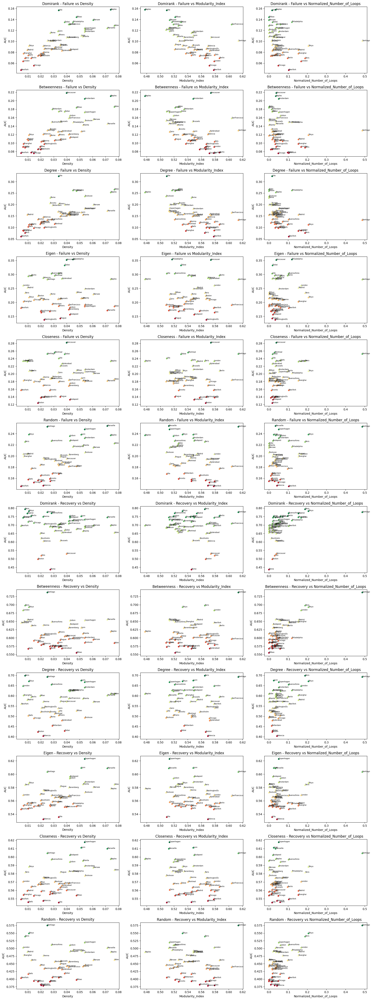

In [123]:
import os
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
with open("failure_results.pkl", "rb") as f:
    failure_data = pickle.load(f)

with open("recovery_results.pkl", "rb") as f:
    recovery_data = pickle.load(f)

# Extract strategies and attributes
strategies = ['Domirank', 'Betweenness', 'Degree', 'Eigen', 'Closeness', 'Random']
attributes = ['Nodes', 'Avg_Degree', 'Avg_SPL', 'Density', 'Diameter',
              'Modularity_Index', 'Clustering_Coefficient', 'Normalized_Number_of_Loops']

# Create DataFrames for both failure and recovery
failure_rows = []
recovery_rows = []

for city, data in failure_data.items():
    attrs = data['network_attributes']
    aucs = data['failure_auc']
    for strat in strategies:
        if strat in aucs:
            row = {**{k: attrs[k] for k in attributes}, 'AUC': aucs[strat], 'Strategy': strat, 'City': city}
            failure_rows.append(row)

for city, data in recovery_data.items():
    attrs = data['network_attributes']
    aucs = data['recovery_auc']
    for strat in strategies:
        if strat in aucs:
            row = {**{k: attrs[k] for k in attributes}, 'AUC': aucs[strat], 'Strategy': strat, 'City': city}
            recovery_rows.append(row)

failure_df = pd.DataFrame(failure_rows)
recovery_df = pd.DataFrame(recovery_rows)

# Plotting
fig, axes = plt.subplots(12, 3, figsize=(18, 48))
all_df = failure_df.copy()
all_df['Type'] = 'Failure'
recovery_df['Type'] = 'Recovery'
all_df = pd.concat([all_df, recovery_df])

for i, strat in enumerate(strategies):
    for j, attr in enumerate(['Density', 'Modularity_Index', 'Normalized_Number_of_Loops']):
        ax = axes[i, j]
        subset = all_df[all_df['Strategy'] == strat]
        sns.scatterplot(data=subset[subset['Type'] == 'Failure'], x=attr, y='AUC', hue='AUC',
                        palette='RdYlGn', ax=ax, legend=False)
        for _, row in subset.iterrows():
            if row['Type'] == 'Failure':
                ax.text(row[attr], row['AUC'], row['City'], fontsize=6)
        ax.set_title(f"{strat} - Failure vs {attr}")
        ax.set_ylabel("AUC")
        ax.set_xlabel(attr)

for i, strat in enumerate(strategies):
    for j, attr in enumerate(['Density', 'Modularity_Index', 'Normalized_Number_of_Loops']):
        ax = axes[i+6, j]
        subset = all_df[all_df['Strategy'] == strat]
        sns.scatterplot(data=subset[subset['Type'] == 'Recovery'], x=attr, y='AUC', hue='AUC',
                        palette='RdYlGn', ax=ax, legend=False)
        for _, row in subset.iterrows():
            if row['Type'] == 'Recovery':
                ax.text(row[attr], row['AUC'], row['City'], fontsize=6)
        ax.set_title(f"{strat} - Recovery vs {attr}")
        ax.set_ylabel("AUC")
        ax.set_xlabel(attr)

plt.tight_layout()
plt.savefig("3d_plots/main_attributes_relation_with_auc.pdf",dpi = 300)
plt.show()



## Leave 1 out and equations Failure

In [87]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import mutual_info_regression
import pickle
import os

# Load the failure results
with open("failure_results.pkl", "rb") as f:
    failure_data = pickle.load(f)

required_methods = ["Domirank", "Betweenness", "Degree", "Closeness", "Eigen", "Random"]
required_attributes = [
    "Nodes", "Avg_Degree", "Avg_SPL", "Density", "Diameter",
    "Modularity_Index", "Clustering_Coefficient", "Normalized_Number_of_Loops"
]

# Prepare valid cities
valid_cities = [
    city for city in failure_data
    if all(k in failure_data[city]["failure_auc"] for k in required_methods)
    and all(k in failure_data[city]["network_attributes"] for k in required_attributes)
]

attr_df = pd.DataFrame([
    failure_data[city]["network_attributes"] for city in valid_cities
], index=valid_cities)[required_attributes]

auc_df = pd.DataFrame([
    failure_data[city]["failure_auc"] for city in valid_cities
], index=valid_cities)[required_methods]

# Conflict logic
conflict_resolution = {
    frozenset(["Nodes", "Density"]): "Density",
    frozenset(["Avg_Degree", "Normalized_Number_of_Loops"]): "Normalized_Number_of_Loops",
    frozenset(["Avg_SPL", "Diameter"]): "Avg_SPL"
}

def apply_conflict_resolution(features):
    features = set(features)
    for conflict_set, keep in conflict_resolution.items():
        if conflict_set.issubset(features):
            features -= conflict_set - {keep}
    return list(features)

def apply_conflict_resolution_with_substitution(features):
    features = set(features)
    for conflict_set, keep in conflict_resolution.items():
        if conflict_set.issubset(features):
            features -= conflict_set - {keep}
    for conflict_set, keep in conflict_resolution.items():
        for f in conflict_set:
            if f in features and f != keep:
                features.remove(f)
                features.add(keep)
    return list(features)

def evaluate_model(X, y):
    model = LinearRegression().fit(X, y)
    return model

# Storage
coefficients = {
    method: {model: [] for model in ["All", "Top3", "DropConf", "SubConf"]}
    for method in required_methods
}

# LOOCV
for test_city in valid_cities:
    train_cities = [c for c in valid_cities if c != test_city]
    attr_train = attr_df.loc[train_cities]
    auc_train = auc_df.loc[train_cities]

    for method in required_methods:
        y_train = auc_train[method].values

        # All Variables
        model = evaluate_model(attr_train, y_train)
        coeff = dict(zip(required_attributes, model.coef_))
        coefficients[method]["All"].append({k: coeff.get(k, 0) for k in required_attributes})

        # Top 3 MI
        mi = mutual_info_regression(attr_train, y_train, random_state=42)
        top3 = attr_train.columns[np.argsort(mi)[::-1][:3]]
        model = evaluate_model(attr_train[top3], y_train)
        coeff = dict(zip(top3, model.coef_))
        coefficients[method]["Top3"].append({k: coeff.get(k, 0) for k in required_attributes})

        # Drop Conflicts
        top3_filtered = apply_conflict_resolution(top3)
        model = evaluate_model(attr_train[top3_filtered], y_train)
        coeff = dict(zip(top3_filtered, model.coef_))
        coefficients[method]["DropConf"].append({k: coeff.get(k, 0) for k in required_attributes})

        # Substitute Conflicts
        top3_sub = apply_conflict_resolution_with_substitution(top3)
        model = evaluate_model(attr_train[top3_sub], y_train)
        coeff = dict(zip(top3_sub, model.coef_))
        coefficients[method]["SubConf"].append({k: coeff.get(k, 0) for k in required_attributes})

# Save CSVs
os.makedirs("failure_loocv_all_methods", exist_ok=True)
for method in required_methods:
    for model_type in ["All", "Top3", "DropConf", "SubConf"]:
        df = pd.DataFrame(coefficients[method][model_type], index=valid_cities)
        df.to_csv(f"failure_loocv_all_methods/{method.lower()}_{model_type.lower()}_loocv_coefficients.csv")

print("✅ LOOCV coefficient tables saved for all methods in 'failure_loocv_all_methods/'")


✅ LOOCV coefficient tables saved for all methods in 'failure_loocv_all_methods/'


In [17]:
import os
import pandas as pd

# Folder containing the coefficient CSVs
folder = "failure_loocv_all_methods"
methods = ["Domirank", "Betweenness", "Degree", "Closeness", "Eigen", "Random"]
model_types = ["SubConf"]

print("\n📊 Standard Deviation of Coefficients from LOOCV (loaded from CSVs):\n")

for method in methods:
    print(f"--- {method} ---")
    for model_type in model_types:
        file_path = os.path.join(folder, f"{method.lower()}_{model_type.lower()}_loocv_coefficients.csv")
        if not os.path.exists(file_path):
            print(f"{model_type}: File not found.")
            continue
        df = pd.read_csv(file_path, index_col=0)
        stds = df.std(axis=0).round(4)
        print(f"{model_type}:")
        print(stds[stds != 0].to_string())  # print only non-zero stds
        print()



📊 Standard Deviation of Coefficients from LOOCV (loaded from CSVs):

--- Domirank ---
SubConf:
Density             0.0312
Modularity_Index    0.0275

--- Betweenness ---
SubConf:
Density             0.0429
Modularity_Index    0.0294

--- Degree ---
SubConf:
Avg_SPL                       0.0021
Density                       0.4138
Modularity_Index              0.2888
Normalized_Number_of_Loops    0.0341

--- Closeness ---
SubConf:
Density                       0.0909
Modularity_Index              0.0662
Clustering_Coefficient        0.0184
Normalized_Number_of_Loops    0.0593

--- Eigen ---
SubConf:
Avg_SPL                       0.0021
Density                       0.2960
Clustering_Coefficient        0.1485
Normalized_Number_of_Loops    0.0655

--- Random ---
SubConf:
Avg_SPL    0.0002
Density    0.0381



## Leave 1 out and equations Recovery

In [91]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import mutual_info_regression
import pickle
import os

# Load the failure results
with open("recovery_results.pkl", "rb") as f:
    recovery_data = pickle.load(f)

required_methods = ["Domirank", "Betweenness", "Degree", "Closeness", "Eigen", "Random"]
required_attributes = [
    "Nodes", "Avg_Degree", "Avg_SPL", "Density", "Diameter",
    "Modularity_Index", "Clustering_Coefficient", "Normalized_Number_of_Loops"
]

# Prepare valid cities
valid_cities = [
    city for city in recovery_data
    if all(k in recovery_data[city]["recovery_auc"] for k in required_methods)
    and all(k in recovery_data[city]["network_attributes"] for k in required_attributes)
]

attr_df = pd.DataFrame([
    recovery_data[city]["network_attributes"] for city in valid_cities
], index=valid_cities)[required_attributes]

auc_df = pd.DataFrame([
    recovery_data[city]["recovery_auc"] for city in valid_cities
], index=valid_cities)[required_methods]

# Conflict logic
conflict_resolution = {
    frozenset(["Nodes", "Density"]): "Density",
    frozenset(["Avg_Degree", "Normalized_Number_of_Loops"]): "Normalized_Number_of_Loops",
    frozenset(["Avg_SPL", "Diameter"]): "Avg_SPL"
}

def apply_conflict_resolution(features):
    features = set(features)
    for conflict_set, keep in conflict_resolution.items():
        if conflict_set.issubset(features):
            features -= conflict_set - {keep}
    return list(features)

def apply_conflict_resolution_with_substitution(features):
    features = set(features)
    for conflict_set, keep in conflict_resolution.items():
        if conflict_set.issubset(features):
            features -= conflict_set - {keep}
    for conflict_set, keep in conflict_resolution.items():
        for f in conflict_set:
            if f in features and f != keep:
                features.remove(f)
                features.add(keep)
    return list(features)

def evaluate_model(X, y):
    model = LinearRegression().fit(X, y)
    return model

# Storage
coefficients = {
    method: {model: [] for model in ["All", "Top3", "DropConf", "SubConf"]}
    for method in required_methods
}

# LOOCV
for test_city in valid_cities:
    train_cities = [c for c in valid_cities if c != test_city]
    attr_train = attr_df.loc[train_cities]
    auc_train = auc_df.loc[train_cities]

    for method in required_methods:
        y_train = auc_train[method].values

        # All Variables
        model = evaluate_model(attr_train, y_train)
        coeff = dict(zip(required_attributes, model.coef_))
        coefficients[method]["All"].append({k: coeff.get(k, 0) for k in required_attributes})

        # Top 3 MI
        mi = mutual_info_regression(attr_train, y_train, random_state=42)
        top3 = attr_train.columns[np.argsort(mi)[::-1][:3]]
        model = evaluate_model(attr_train[top3], y_train)
        coeff = dict(zip(top3, model.coef_))
        coefficients[method]["Top3"].append({k: coeff.get(k, 0) for k in required_attributes})

        # Drop Conflicts
        top3_filtered = apply_conflict_resolution(top3)
        model = evaluate_model(attr_train[top3_filtered], y_train)
        coeff = dict(zip(top3_filtered, model.coef_))
        coefficients[method]["DropConf"].append({k: coeff.get(k, 0) for k in required_attributes})

        # Substitute Conflicts
        top3_sub = apply_conflict_resolution_with_substitution(top3)
        model = evaluate_model(attr_train[top3_sub], y_train)
        coeff = dict(zip(top3_sub, model.coef_))
        coefficients[method]["SubConf"].append({k: coeff.get(k, 0) for k in required_attributes})

# Save CSVs
os.makedirs("recovery_loocv_all_methods", exist_ok=True)
for method in required_methods:
    for model_type in ["All", "Top3", "DropConf", "SubConf"]:
        df = pd.DataFrame(coefficients[method][model_type], index=valid_cities)
        df.to_csv(f"recovery_loocv_all_methods/{method.lower()}_{model_type.lower()}_loocv_coefficients.csv")

print("✅ LOOCV coefficient tables saved for all methods in 'recovery_loocv_all_methods/'")


✅ LOOCV coefficient tables saved for all methods in 'recovery_loocv_all_methods/'


In [19]:
import os
import pandas as pd

# Folder containing the coefficient CSVs
folder = "recovery_loocv_all_methods"
methods = ["Domirank", "Betweenness", "Degree", "Closeness", "Eigen", "Random"]
model_types = ["SubConf"]

print("\n📊 Standard Deviation of Coefficients from LOOCV (loaded from CSVs):\n")

for method in methods:
    print(f"--- {method} ---")
    for model_type in model_types:
        file_path = os.path.join(folder, f"{method.lower()}_{model_type.lower()}_loocv_coefficients.csv")
        if not os.path.exists(file_path):
            print(f"{model_type}: File not found.")
            continue
        df = pd.read_csv(file_path, index_col=0)
        stds = df.std(axis=0).round(4)
        print(f"{model_type}:")
        print(stds[stds != 0].to_string())  # print only non-zero stds
        print()


📊 Standard Deviation of Coefficients from LOOCV (loaded from CSVs):

--- Domirank ---
SubConf:
Density                       0.2825
Modularity_Index              0.3740
Normalized_Number_of_Loops    0.0910

--- Betweenness ---
SubConf:
Density                       0.0608
Normalized_Number_of_Loops    0.0338

--- Degree ---
SubConf:
Avg_SPL                       0.0055
Density                       1.1342
Normalized_Number_of_Loops    0.1837

--- Closeness ---
SubConf:
Avg_SPL    0.0002
Density    0.0184

--- Eigen ---
SubConf:
Avg_SPL                       0.0004
Density                       0.0764
Normalized_Number_of_Loops    0.0095

--- Random ---
SubConf:
Avg_SPL                       0.0050
Density                       1.1373
Modularity_Index              0.0864
Normalized_Number_of_Loops    0.2002



## corr plot for new attributes too

### 📊 Centrality Attributes

- **Avg Betweenness Centrality**: Average extent to which nodes act as bridges on shortest paths between other nodes.
- **Avg Closeness Centrality**: Measures how close each node is to all other nodes; averaged across the network.
- **Avg Eigenvector Centrality**: Indicates node importance based on connections to other highly connected nodes.
- **Avg PageRank Centrality**: Probability-based centrality measuring a node’s influence via random walks.
- **Avg Katz Centrality**: Scores nodes by immediate neighbors and all other nodes connected through them, with a decay factor.
- **Avg Harmonic Centrality**: Inverse of the shortest path length to all other nodes; more robust for disconnected graphs.
- **Avg Load Centrality**: Measures traffic a node handles assuming all pairs exchange unit flow along shortest paths.

### 🔗 Connectivity Measures

- **Algebraic Connectivity**: The second-smallest eigenvalue of the Laplacian matrix; reflects how well-knit the graph is.

### 🧱 Structural Metrics

- **Assortativity**: Correlation between degrees of connected nodes; positive values imply degree-similar nodes link.
- **Rich Club Coefficient**: Tendency of high-degree nodes to form tightly connected elite groups.
- **Transitivity**: Ratio of triangles to connected triplets in the network; reflects clustering tendency.

### ⚡ Efficiency & Path-Based Measures

- **Global Efficiency**: Average inverse shortest path length; indicates how efficiently information spreads.
- **Local Efficiency**: Efficiency of local subgraphs; measures robustness to small failures.
- **Avg Eccentricity**: Mean of the maximum distances from each node to others; captures reachability.

### 🧠 Spectral / Entropy-Based Metrics

- **Network Entropy**: Measures diversity of node degrees; higher entropy indicates more randomness in connectivity.


WashingtonDc
Boston
Chicago
Delhi
Tokyo
Paris
Shanghai
London
NewYork
Budapest
Cairo
Copenhagen
Montreal
SanFrancisco
Vienna
Philadelphia
Kobe
Naples
Marseille
Toulouse
Lyon
Amsterdam
Bilbao
Lisbon
Dubai
Vancouver
Rotterdam
Rome
Toronto
BuenosAires
Valencia
Stockholm
Oslo
Athens
Warsaw
Atlanta
Berlin
Brussels
Hyderabad
Lille
Madrid
Milan
Nuremberg
Prague
Santiago
done


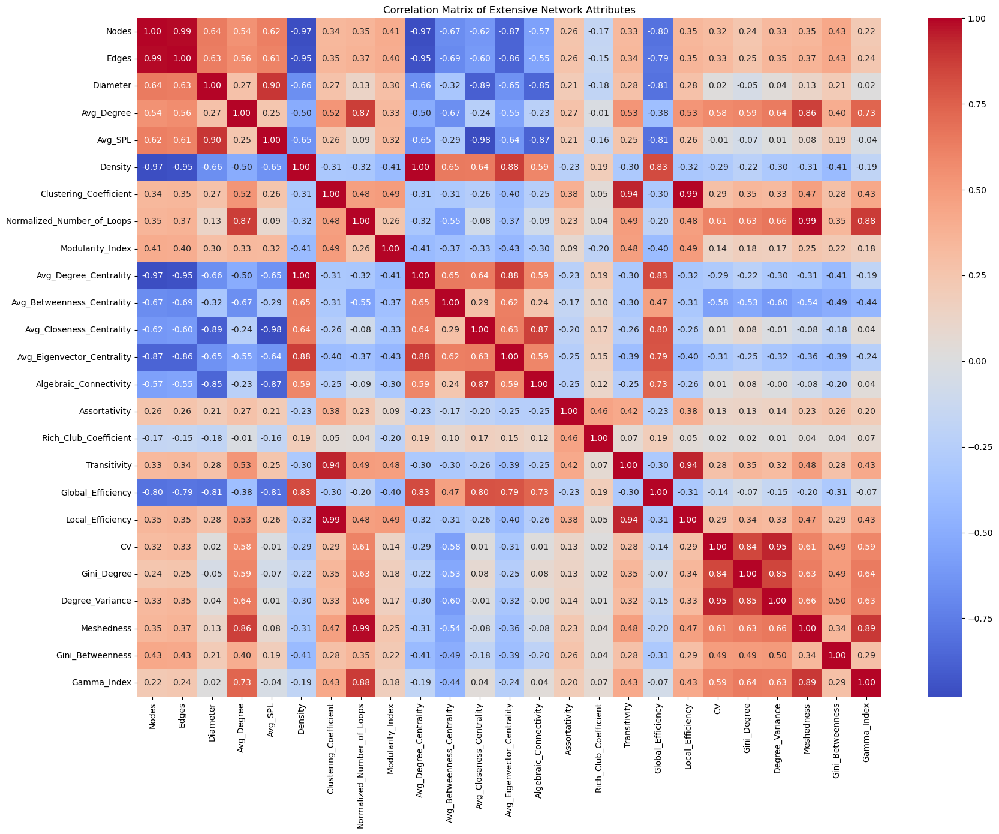

In [20]:
import pickle
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from networkx.algorithms import community

# Load the networks from the gpickle file
with open("../all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

# Function to calculate extensive network attributes
def calculate_network_attributes(G):
    attrs = {}
    N = G.number_of_nodes()
    E = G.number_of_edges()
    # Basic attributes
    attrs["Nodes"] = N
    attrs["Edges"] = E
    attrs["Diameter"] = nx.diameter(G) if nx.is_connected(G) else np.nan
    attrs["Avg_Degree"] = np.mean([deg for _, deg in G.degree()])
    attrs["Avg_SPL"] = nx.average_shortest_path_length(G) if nx.is_connected(G) else np.nan
    attrs["Density"] = nx.density(G)
    attrs["Clustering_Coefficient"] = nx.average_clustering(G)

    num_loops = sum(1 for cycle in nx.cycle_basis(G))
    attrs["Normalized_Number_of_Loops"] = num_loops / attrs["Nodes"]

    attrs["Modularity_Index"] = nx.algorithms.community.modularity(G, nx.algorithms.community.label_propagation_communities(G))

    # Centrality attributes
    attrs["Avg_Degree_Centrality"] = np.mean(list(nx.degree_centrality(G).values()))
    attrs["Avg_Betweenness_Centrality"] = np.mean(list(nx.betweenness_centrality(G).values()))
    attrs["Avg_Closeness_Centrality"] = np.mean(list(nx.closeness_centrality(G).values()))
    attrs["Avg_Eigenvector_Centrality"] = np.mean(list(nx.eigenvector_centrality(G, max_iter=1000).values()))
    # attrs["Avg_PageRank_Centrality"] = np.mean(list(nx.pagerank(G).values()))
    # attrs["Avg_Katz_Centrality"] = np.mean(list(nx.katz_centrality_numpy(G).values()))
    # attrs["Avg_Harmonic_Centrality"] = np.mean(list(nx.harmonic_centrality(G).values()))
    # attrs["Avg_Load_Centrality"] = np.mean(list(nx.load_centrality(G).values()))

    # Connectivity measures
    attrs["Algebraic_Connectivity"] = nx.algebraic_connectivity(G) if nx.is_connected(G) else np.nan

    # Structural measures
    attrs["Assortativity"] = nx.degree_assortativity_coefficient(G)
    attrs["Rich_Club_Coefficient"] = np.mean(list(nx.rich_club_coefficient(G, normalized=False).values()))
    attrs["Transitivity"] = nx.transitivity(G)
    # attrs["Network_Sparsity"] = 1 - nx.density(G)
    # Efficiency and path measures
    attrs["Global_Efficiency"] = nx.global_efficiency(G)
    attrs["Local_Efficiency"] = nx.local_efficiency(G)
    # attrs["Avg_Eccentricity"] = np.mean(list(nx.eccentricity(G).values())) if nx.is_connected(G) else np.nan

    # Hierarchical and spectral measures
    # attrs["Spectral_Radius"] = max(np.linalg.eigvals(nx.adjacency_matrix(G).todense())).real
    degree_sequence = [deg for _, deg in G.degree()]
    prob_degree = np.array([degree_sequence.count(i) / len(degree_sequence) for i in set(degree_sequence)])
    # attrs["Network_Entropy"] = -np.sum(prob_degree * np.log(prob_degree + 1e-12))

    degrees = [d for _, d in G.degree()]

    def gini(array):
        array = np.sort(np.array(array))
        n = len(array)
        index = np.arange(1, n + 1)
        return (np.sum((2 * index - n - 1) * array)) / (n * np.sum(array))
    
    attrs["CV"]= np.std(degrees) / np.mean(degrees)
    attrs["Gini_Degree"]= gini(degrees)
    attrs["Degree_Variance"]= np.var(degrees)
    
    # attrs["Beta_Index"] = E / (3 * N - 6) if N > 2 else np.nan
    # Add meshedness coefficient
    if N > 2:
        attrs["Meshedness"] = (E - N + 1) / (2 * N - 5)
    else:
        attrs["Meshedness"] = np.nan

    attrs["Avg_Degree_Centrality"] = np.mean(list(nx.degree_centrality(G).values()))

    # Gini of Betweenness Centrality
    betweenness_vals = list(nx.betweenness_centrality(G).values())
    attrs["Gini_Betweenness"] = gini(betweenness_vals)
    
    # Gamma Index
    if N > 2:
        attrs["Gamma_Index"] = E / (3 * (N - 2))
    else:
        attrs["Gamma_Index"] = np.nan
    

    return attrs

# Calculate attributes for all cities
results = {}
for city, G in networks.items():
    print(city)
    results[city] = calculate_network_attributes(G)

print("done")

# Save attributes to a pickle file
with open("all_possible_attributes.pkl", "wb") as f:
    pickle.dump(results, f)

with open("all_possible_attributes.pkl", "rb") as f:
    results = pickle.load(f)

# Create DataFrame
df = pd.DataFrame(results).T

# Compute correlation matrix
corr_matrix = df.corr(method='kendall')

# Plot correlation heatmap
plt.figure(figsize=(18, 14))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Extensive Network Attributes')
plt.tight_layout()
plt.show()


In [2]:
import pickle
import pandas as pd

# === Load the attributes dictionary ===
with open("all_possible_attributes.pkl", "rb") as f:
    all_attrs = pickle.load(f)

# === Convert to DataFrame ===
df = pd.DataFrame(all_attrs).T  # networks as rows, attributes as columns

# === Save as CSV ===
df.to_csv("all_network_attributes.csv", index=True)

print("✅ CSV saved as all_network_attributes.csv with shape:", df.shape)


✅ CSV saved as all_network_attributes.csv with shape: (45, 25)


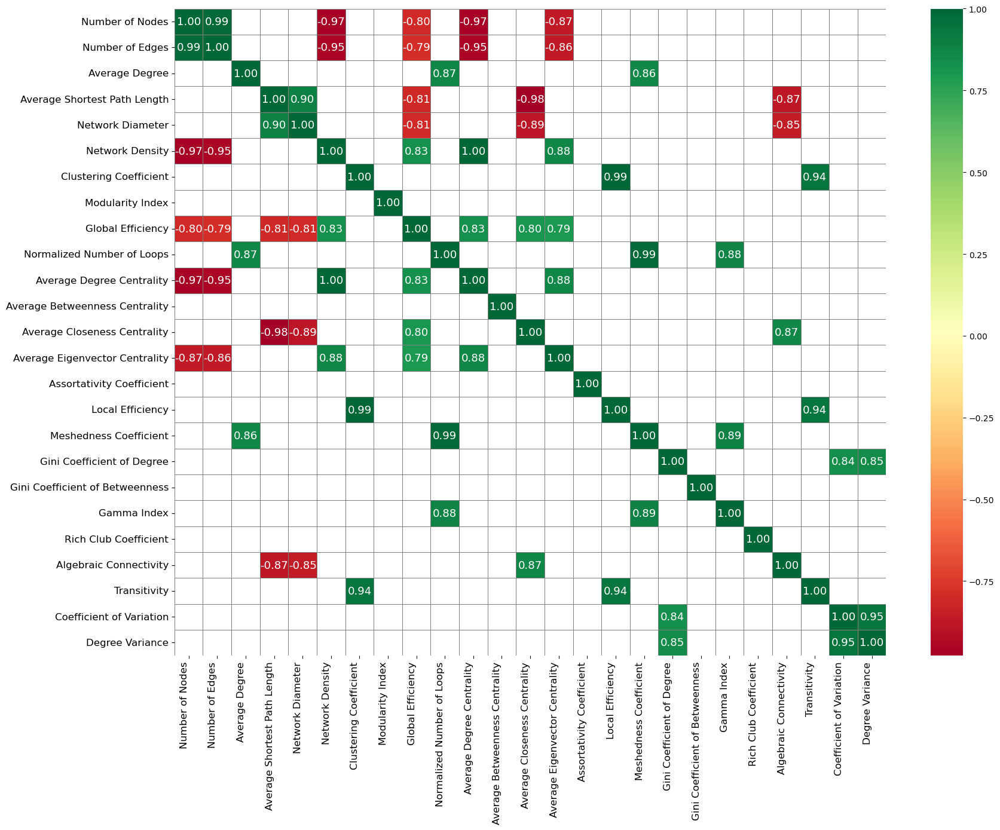

In [16]:
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load attributes
with open("all_possible_attributes.pkl", "rb") as f:
    results = pickle.load(f)

# results.pop("Boston", None)

# Create DataFrame
df = pd.DataFrame(results).T

# Rename mapping (code names → publication names)
rename_dict = {
    "Nodes": "Number of Nodes",
    "Edges": "Number of Edges",
    "Avg_Degree": "Average Degree",
    "Avg_SPL": "Average Shortest Path Length",
    "Diameter": "Network Diameter",
    "Density": "Network Density",
    "Clustering_Coefficient": "Clustering Coefficient",
    "Modularity_Index": "Modularity Index",
    "Global_Efficiency": "Global Efficiency",
    "Normalized_Number_of_Loops": "Normalized Number of Loops",
    "Avg_Degree_Centrality": "Average Degree Centrality",
    "Avg_Betweenness_Centrality": "Average Betweenness Centrality",
    "Avg_Closeness_Centrality": "Average Closeness Centrality",
    "Avg_Eigenvector_Centrality": "Average Eigenvector Centrality",
    "Assortativity": "Assortativity Coefficient",
    "Local_Efficiency": "Local Efficiency",
    "Meshedness": "Meshedness Coefficient",
    "Gini_Degree": "Gini Coefficient of Degree",
    "Gini_Betweenness": "Gini Coefficient of Betweenness",
    "Gamma_Index": "Gamma Index",
    "Rich_Club_Coefficient": "Rich Club Coefficient",
    "Algebraic_Connectivity": "Algebraic Connectivity",
    "Transitivity": "Transitivity",
    "CV": "Coefficient of Variation",
    "Degree_Variance": "Degree Variance"
}

# Use the ordered list of new names
selected_attributes = list(rename_dict.values())

# Filter and rename columns
df = df[rename_dict.keys()]
df = df.rename(columns=rename_dict)

# Compute Kendall correlation matrix
corr_matrix = df.corr(method='kendall')

# Apply mask for |corr| >= 0.75
highlight_mask = corr_matrix.abs() >= 0.75
masked_corr = corr_matrix.where(highlight_mask)

# Plot heatmap
# Plot heatmap with bigger fonts
plt.figure(figsize=(18, 14))
sns.heatmap(
    masked_corr,
    annot=True,
    cmap='RdYlGn',
    fmt='.2f',
    mask=~highlight_mask,
    linewidths=0.5,
    linecolor='gray',
    cbar=True,
    annot_kws={"size": 13}   # <-- controls the correlation numbers
)

# Increase axis tick label size
plt.xticks(fontsize=12, rotation=90, ha='right')
plt.yticks(fontsize=12, rotation=0)

# plt.title('Correlation Matrix (|corr| > 0.75 Highlighted Only)', fontsize=18)
plt.tight_layout()
plt.savefig("new_figures/corr_table/all_network_corr_latest.svg", format="svg", dpi=400)
plt.show()



## Bubbles/Cluster

In [19]:
!pip install adjustText

In [ ]:
!pip uninstall numpy

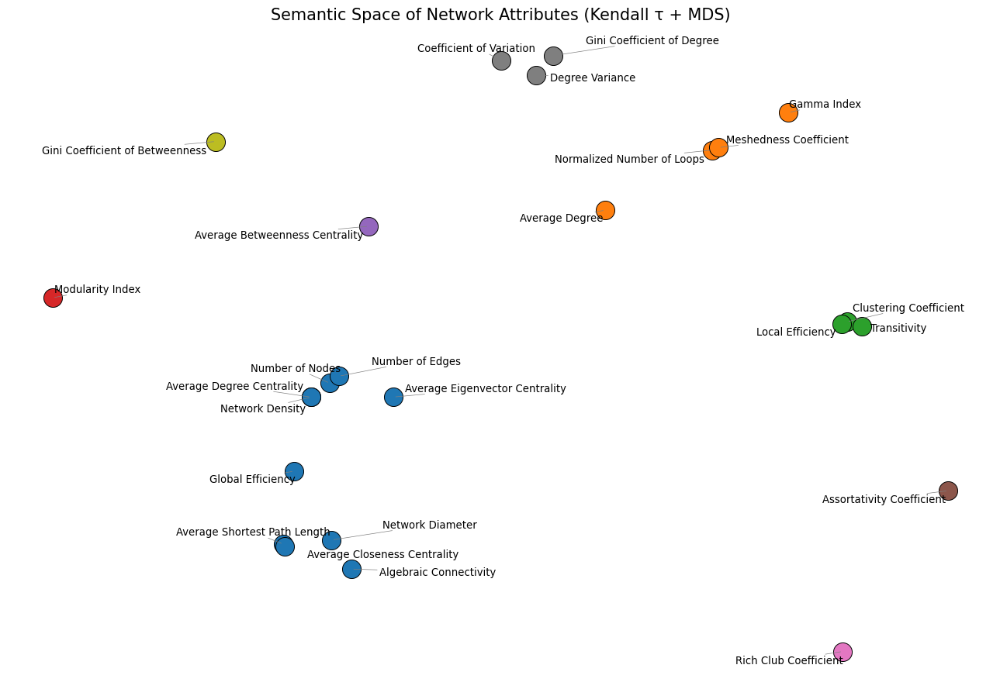


🔗 Clusters of Strongly Correlated Attributes (|τ| ≥ 0.75):

Cluster 1: ['Algebraic Connectivity', 'Average Closeness Centrality', 'Average Degree Centrality', 'Average Eigenvector Centrality', 'Average Shortest Path Length', 'Network Density', 'Network Diameter', 'Number of Edges', 'Global Efficiency', 'Number of Nodes']
Cluster 2: ['Average Degree', 'Gamma Index', 'Meshedness Coefficient', 'Normalized Number of Loops']
Cluster 3: ['Clustering Coefficient', 'Local Efficiency', 'Transitivity']
Cluster 4: ['Modularity Index']
Cluster 5: ['Average Betweenness Centrality']
Cluster 6: ['Assortativity Coefficient']
Cluster 7: ['Rich Club Coefficient']
Cluster 8: ['Coefficient of Variation', 'Degree Variance', 'Gini Coefficient of Degree']
Cluster 9: ['Gini Coefficient of Betweenness']


In [15]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from sklearn.manifold import MDS
from adjustText import adjust_text
import os

# === Load the attributes ===
with open("all_possible_attributes.pkl", "rb") as f:
    results = pickle.load(f)


# === Create DataFrame ===
df = pd.DataFrame(results).T

# === Define selected attributes ===
selected_attributes = [
    "Nodes",
    "Edges",
    "Diameter",
    "Avg_Degree",
    "Avg_SPL",
    "Density",
    "Clustering_Coefficient",
    "Normalized_Number_of_Loops",
    "Modularity_Index",
    "Avg_Degree_Centrality",
    "Avg_Betweenness_Centrality",
    "Avg_Closeness_Centrality",
    "Avg_Eigenvector_Centrality",
    "Algebraic_Connectivity",
    "Assortativity",
    "Rich_Club_Coefficient",
    "Transitivity",
    "Global_Efficiency",
    "Local_Efficiency",
    "CV",
    "Gini_Degree",
    "Degree_Variance",
    "Meshedness",
    "Gini_Betweenness",
    "Gamma_Index"
]
df = df[selected_attributes]

# === Mapping to publication-style attribute names ===
rename_dict = {
    "Nodes": "Number of Nodes",
    "Edges": "Number of Edges",
    "Avg_Degree": "Average Degree",
    "Avg_SPL": "Average Shortest Path Length",
    "Diameter": "Network Diameter",
    "Density": "Network Density",
    "Clustering_Coefficient": "Clustering Coefficient",
    "Modularity_Index": "Modularity Index",
    "Global_Efficiency": "Global Efficiency",
    "Normalized_Number_of_Loops": "Normalized Number of Loops",
    "Avg_Degree_Centrality": "Average Degree Centrality",
    "Avg_Betweenness_Centrality": "Average Betweenness Centrality",
    "Avg_Closeness_Centrality": "Average Closeness Centrality",
    "Avg_Eigenvector_Centrality": "Average Eigenvector Centrality",
    "Assortativity": "Assortativity Coefficient",
    "Local_Efficiency": "Local Efficiency",
    "Meshedness": "Meshedness Coefficient",
    "Gini_Degree": "Gini Coefficient of Degree",
    "Gini_Betweenness": "Gini Coefficient of Betweenness",
    "Gamma_Index": "Gamma Index",
    "Rich_Club_Coefficient": "Rich Club Coefficient",
    "Algebraic_Connectivity": "Algebraic Connectivity",
    "Transitivity": "Transitivity",
    "CV": "Coefficient of Variation",
    "Degree_Variance": "Degree Variance"
}

# === Compute Kendall correlation matrix and convert to distance ===
corr_matrix = df.corr(method='kendall')
distance_matrix = 1 - abs(corr_matrix.fillna(0))

# === Run MDS ===
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
embedding = mds.fit_transform(distance_matrix)

# === Build graph from attributes with |tau| ≥ 0.75 ===
G = nx.Graph()
G.add_nodes_from(selected_attributes)

for i in selected_attributes:
    for j in selected_attributes:
        if i != j and abs(corr_matrix.loc[i, j]) >= 0.75:
            G.add_edge(i, j)

# === Identify clusters ===
components = list(nx.connected_components(G))
attr_to_cluster = {}
for idx, cluster in enumerate(components):
    for attr in cluster:
        attr_to_cluster[attr] = f"Cluster {idx+1}"

# === Assign colors to clusters ===
cluster_list = sorted(set(attr_to_cluster.values()))
palette = sns.color_palette("tab10", len(cluster_list))
color_map = {cluster: palette[i] for i, cluster in enumerate(cluster_list)}

# === Plot MDS Scatter ===
plt.figure(figsize=(13, 9))
texts = []

for i, attr in enumerate(selected_attributes):
    cluster = attr_to_cluster.get(attr, "Unclustered")
    color = color_map.get(cluster, "gray")
    x, y = embedding[i]

    # Use publication-style name
    label = rename_dict.get(attr, attr)
    plt.scatter(x, y, color=color, s=300, edgecolor='black', linewidth=0.7)
    texts.append(plt.text(x, y, label, fontsize=9.5, ha='center', va='center'))

# Adjust overlapping labels
adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5))

plt.title("Semantic Space of Network Attributes (Kendall τ + MDS)", fontsize=15)
plt.axis('off')
plt.tight_layout()
os.makedirs("new_figures/cluster_and_distance", exist_ok=True)
plt.savefig("new_figures/cluster_and_distance/mds_attribute_space.svg", format="svg", dpi=300)
plt.show()

# === Print Clusters with Publication Names ===
print("\n🔗 Clusters of Strongly Correlated Attributes (|τ| ≥ 0.75):\n")
for i, group in enumerate(components, 1):
    pretty_names = [rename_dict.get(attr, attr) for attr in sorted(group)]
    print(f"Cluster {i}: {pretty_names}")


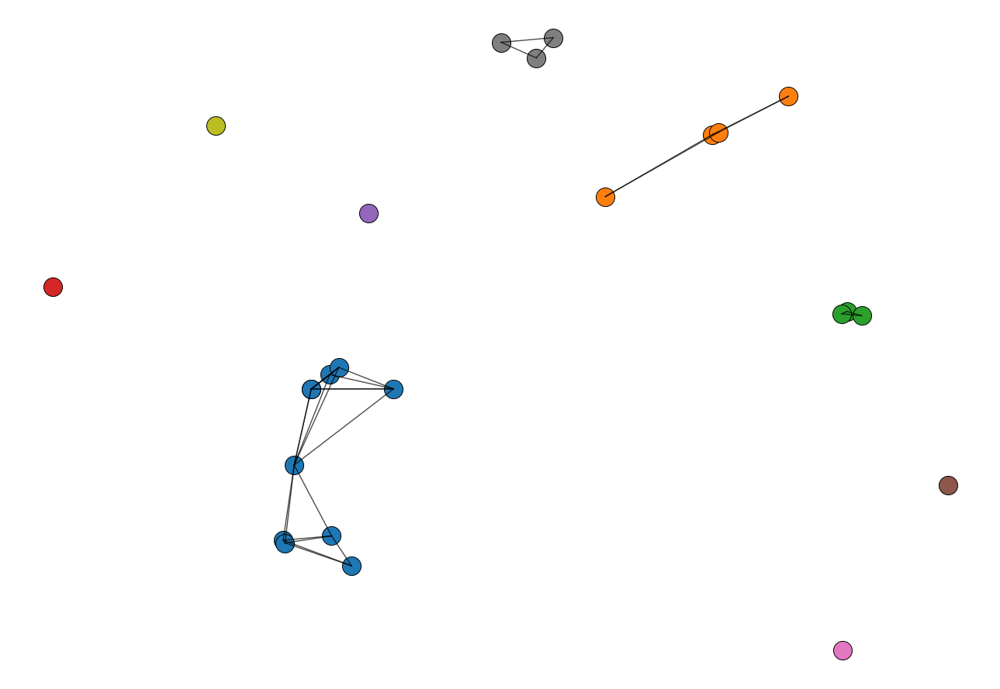

In [25]:
# === Plot MDS Scatter with correlation edges ===
plt.figure(figsize=(13, 9))

# Draw edges between strongly correlated attributes (|τ| ≥ 0.75)
for i, attr1 in enumerate(selected_attributes):
    for j, attr2 in enumerate(selected_attributes):
        if i < j and abs(corr_matrix.loc[attr1, attr2]) >= 0.75:
            x1, y1 = embedding[i]
            x2, y2 = embedding[j]
            plt.plot([x1, x2], [y1, y2], color="black", linewidth=1, alpha=0.7)

# Plot nodes (cluster-colored)
for i, attr in enumerate(selected_attributes):
    cluster = attr_to_cluster.get(attr, "Unclustered")
    color = color_map.get(cluster, "gray")
    x, y = embedding[i]
    plt.scatter(x, y, color=color, s=300, edgecolor="black", linewidth=0.7)

# Remove text labels & title (as per your request)
plt.axis("off")

plt.tight_layout()
os.makedirs("new_figures/cluster_and_distance", exist_ok=True)
plt.savefig("new_figures/cluster_and_distance/mds_attribute_space_with_edges.svg", format="svg", dpi=300)
plt.show()


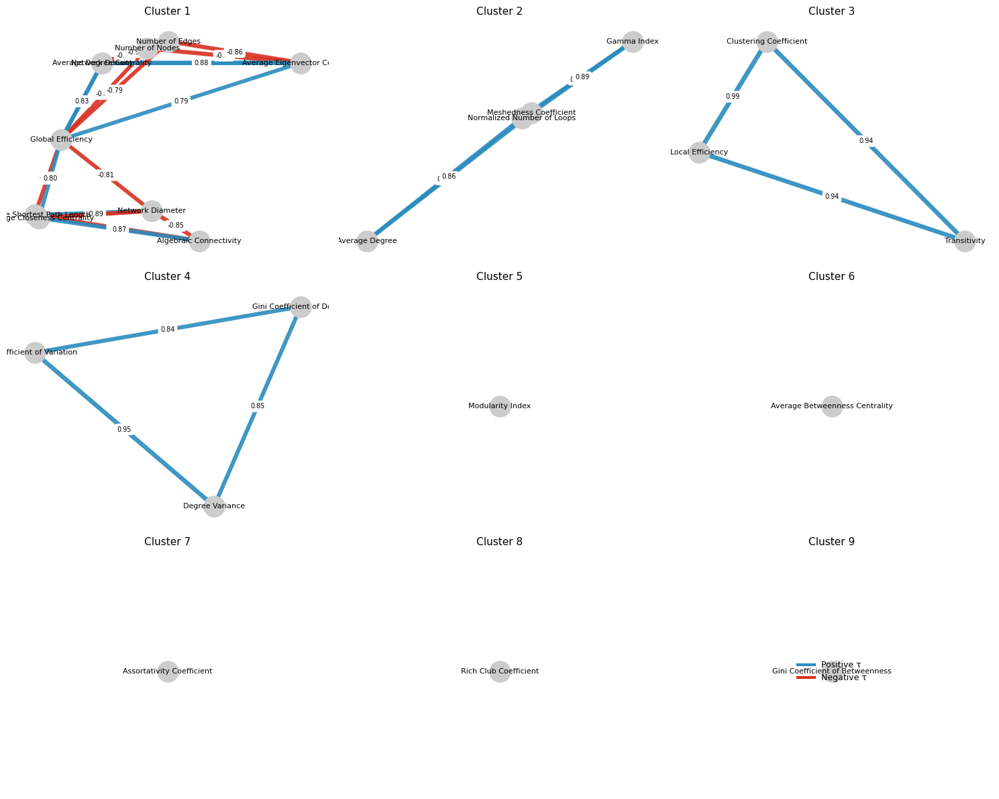

In [2]:
# ===== Plot all 9 clusters (each GCC separately) =====
from matplotlib.lines import Line2D

# Rebuild clusters from your graph G
components = list(nx.connected_components(G))
components = sorted(components, key=lambda x: -len(x))  # largest first

# Position embedding from MDS
pos_emb = {attr: embedding[i] for i, attr in enumerate(selected_attributes)}

# Layout for subplots
n_clusters = len(components)   # should be 9
ncols = 3
nrows = int(np.ceil(n_clusters / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(15, 12))
axes = axes.flatten()

for idx, comp in enumerate(components):
    ax = axes[idx]
    subG = G.subgraph(comp).copy()

    # Attach Kendall τ info
    for u, v in subG.edges():
        w = float(corr_matrix.loc[u, v])
        subG[u][v]["tau"] = w
        subG[u][v]["abs_tau"] = abs(w)
        subG[u][v]["sign"] = np.sign(w)

    # Positions restricted to subgraph
    pos_sub = {n: pos_emb[n] for n in subG.nodes()}
    node_labels = {n: rename_dict.get(n, n) for n in subG.nodes()}
    edge_labels = {(u, v): f'{subG[u][v]["tau"]:.2f}' for u, v in subG.edges()}

    # Styling
    edge_colors = ["#2b8cbe" if subG[u][v]["sign"] >= 0 else "#d7301f" for u, v in subG.edges()]
    edge_widths = [1.0 + 4.0 * subG[u][v]["abs_tau"] for u, v in subG.edges()]

    # Draw
    nx.draw_networkx_nodes(subG, pos_sub, node_size=500, node_color="#cccccc", ax=ax)
    nx.draw_networkx_labels(subG, pos_sub, labels=node_labels, font_size=8, font_color="black", ax=ax)
    nx.draw_networkx_edges(subG, pos_sub, edge_color=edge_colors, width=edge_widths, alpha=0.9, ax=ax)
    nx.draw_networkx_edge_labels(subG, pos_sub, edge_labels=edge_labels, font_size=7, rotate=False, ax=ax)

    ax.set_title(f"Cluster {idx+1}", fontsize=11)
    ax.axis("off")

# Legend for edge sign (bottom right subplot)
handles = [
    Line2D([0], [0], color="#2b8cbe", lw=3, label="Positive τ"),
    Line2D([0], [0], color="#d7301f", lw=3, label="Negative τ"),
]
axes[-1].legend(handles=handles, frameon=False, fontsize=9, loc="center")

plt.tight_layout()
os.makedirs("new_figures/cluster_and_distance", exist_ok=True)
plt.savefig("new_figures/cluster_and_distance/all_clusters_graphs.svg", format="svg", dpi=300)
plt.show()


In [3]:
# === Print exact MDS coordinates (x, y) ===
print("\n📍 Exact MDS coordinates of each attribute (note: unitless & arbitrary orientation):\n")
for i, attr in enumerate(selected_attributes):
    label = rename_dict.get(attr, attr)
    x, y = embedding[i]
    print(f"{label:35s} -> x = {x:.4f}, y = {y:.4f}")



📍 Exact MDS coordinates of each attribute (note: unitless & arbitrary orientation):

Number of Nodes                     -> x = -0.2011, y = -0.1108
Number of Edges                     -> x = -0.1908, y = -0.0967
Network Diameter                    -> x = -0.1990, y = -0.4287
Average Degree                      -> x = 0.1152, y = 0.2399
Average Shortest Path Length        -> x = -0.2546, y = -0.4371
Network Density                     -> x = -0.2224, y = -0.1392
Clustering Coefficient              -> x = 0.3926, y = 0.0136
Normalized Number of Loops          -> x = 0.2377, y = 0.3617
Modularity Index                    -> x = -0.5194, y = 0.0623
Average Degree Centrality           -> x = -0.2224, y = -0.1392
Average Betweenness Centrality      -> x = -0.1563, y = 0.2074
Average Closeness Centrality        -> x = -0.2525, y = -0.4425
Average Eigenvector Centrality      -> x = -0.1279, y = -0.1389
Algebraic Connectivity              -> x = -0.1762, y = -0.4875
Assortativity Coefficient 

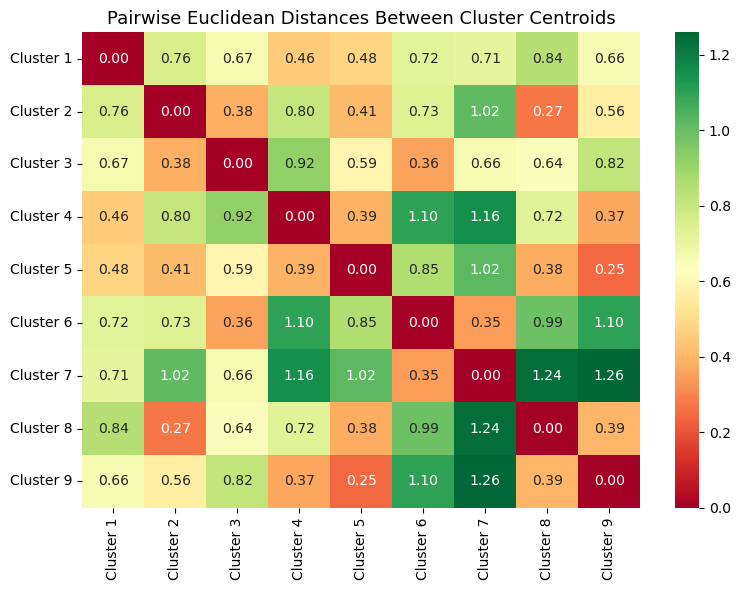


📏 Euclidean Distance Matrix Between Clusters:
          Cluster 1 Cluster 2 Cluster 3 Cluster 4 Cluster 5 Cluster 6  \
Cluster 1       0.0     0.762     0.667     0.456     0.481      0.72   
Cluster 2     0.762       0.0      0.38     0.804     0.413     0.735   
Cluster 3     0.667      0.38       0.0     0.917     0.587     0.356   
Cluster 4     0.456     0.804     0.917       0.0     0.391       1.1   
Cluster 5     0.481     0.413     0.587     0.391       0.0     0.854   
Cluster 6      0.72     0.735     0.356       1.1     0.854       0.0   
Cluster 7     0.709     1.018     0.664     1.156     1.019     0.348   
Cluster 8     0.842     0.274     0.643     0.725     0.378      0.99   
Cluster 9     0.662     0.564     0.817     0.368     0.246     1.099   

          Cluster 7 Cluster 8 Cluster 9  
Cluster 1     0.709     0.842     0.662  
Cluster 2     1.018     0.274     0.564  
Cluster 3     0.664     0.643     0.817  
Cluster 4     1.156     0.725     0.368  
Cluster 5   

In [12]:
from scipy.spatial.distance import euclidean
import pandas as pd

# Step 1: Group embeddings by cluster
cluster_coords = {cluster: [] for cluster in cluster_list}
for i, attr in enumerate(selected_attributes):
    cluster = attr_to_cluster.get(attr, "Unclustered")
    cluster_coords[cluster].append(embedding[i])

# Step 2: Compute centroid of each cluster
cluster_centroids = {
    cluster: np.mean(coords, axis=0)
    for cluster, coords in cluster_coords.items()
}

# Step 3: Compute pairwise distances between centroids
clusters_sorted = sorted(cluster_centroids.keys())
distance_matrix = pd.DataFrame(index=clusters_sorted, columns=clusters_sorted)

for c1 in clusters_sorted:
    for c2 in clusters_sorted:
        dist = euclidean(cluster_centroids[c1], cluster_centroids[c2])
        distance_matrix.loc[c1, c2] = round(dist, 3)

# Step 4: Display as heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(distance_matrix.astype(float), annot=True, cmap="RdYlGn", fmt=".2f")
plt.title("Pairwise Euclidean Distances Between Cluster Centroids", fontsize=13)
plt.tight_layout()
plt.savefig("new_figures/cluster_and_distance/distance_matrix.svg", format="svg", dpi=300)

plt.show()

# Optional: Print raw matrix
print("\n📏 Euclidean Distance Matrix Between Clusters:")
print(distance_matrix)


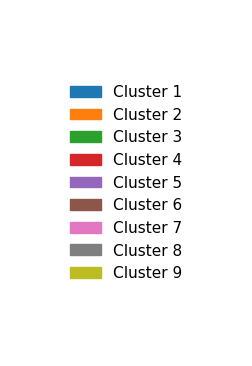

In [17]:
# === Generate Vertical Legend Bar ===
import matplotlib.patches as mpatches

# Create figure and axis
fig, ax = plt.subplots(figsize=(3, len(cluster_list) * 0.5))

# Create legend patches
patches = [mpatches.Patch(color=color_map[cluster], label=cluster) for cluster in cluster_list]

# Add legend to plot
legend = ax.legend(handles=patches, loc='center', frameon=False, fontsize=11)
ax.axis('off')

# Save the legend
os.makedirs("new_figures/cluster_and_distance", exist_ok=True)
plt.savefig("new_figures/cluster_and_distance/legend_bar.svg", format='svg', dpi=300, bbox_inches='tight')
plt.show()


## Correlation from attributes to scores

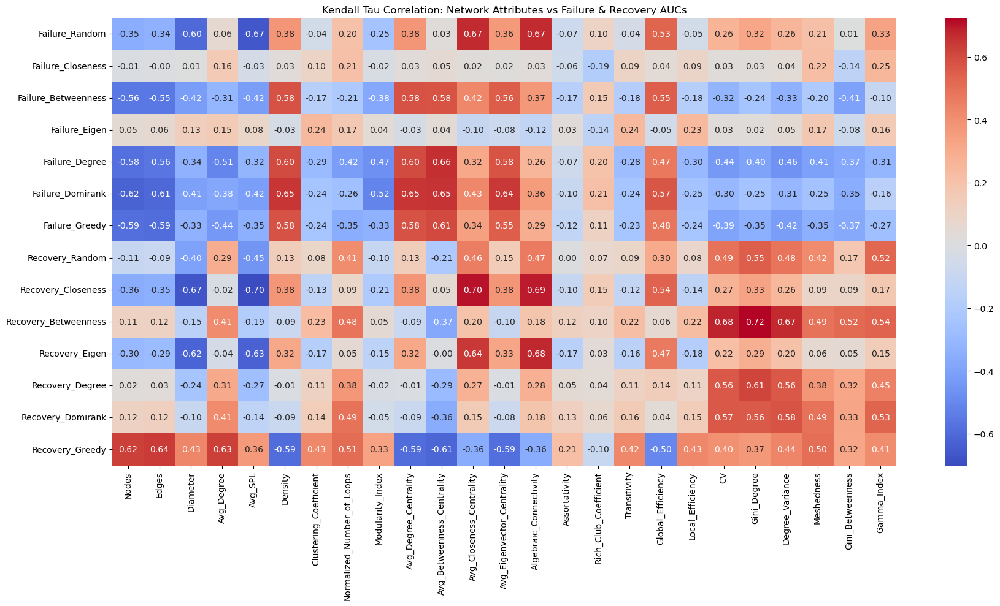

In [28]:
import pickle
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kendalltau

# Load network attributes
with open("all_possible_attributes.pkl", "rb") as f:
    attr_results = pickle.load(f)
df = pd.DataFrame(attr_results).T

# Load AUC data
with open("failure_results.pkl", "rb") as f:
    failure_data = pickle.load(f)

with open("recovery_results.pkl", "rb") as f:
    recovery_data = pickle.load(f)

# Extract available strategies from one city (assumes uniform structure)
example_city = next(iter(failure_data))
strategies = list(failure_data[example_city]['failure_auc'].keys())

# Build DataFrames for failure and recovery AUCs
failure_auc_df = pd.DataFrame({
    city: {method: failure_data[city]['failure_auc'].get(method, np.nan) for method in strategies}
    for city in df.index if city in failure_data
}).T

recovery_auc_df = pd.DataFrame({
    city: {method: recovery_data[city]['recovery_auc'].get(method, np.nan) for method in strategies}
    for city in df.index if city in recovery_data
}).T

# Align on common cities
common_cities = df.index.intersection(failure_auc_df.index).intersection(recovery_auc_df.index)
df = df.loc[common_cities]
failure_auc_df = failure_auc_df.loc[common_cities]
recovery_auc_df = recovery_auc_df.loc[common_cities]

# Function to compute Kendall Tau correlations
def kendall_corr(df1, df2):
    correlations = {}
    for col2 in df2.columns:
        correlations[col2] = []
        for col1 in df1.columns:
            valid_idx = df1[col1].notna() & df2[col2].notna()
            if valid_idx.sum() >= 2:
                tau, _ = kendalltau(df1[col1][valid_idx], df2[col2][valid_idx])
            else:
                tau = np.nan
            correlations[col2].append(tau)
    return pd.DataFrame(correlations, index=df1.columns)

# Compute Kendall Tau correlations
failure_kendall = kendall_corr(df, failure_auc_df)
recovery_kendall = kendall_corr(df, recovery_auc_df)

# Combine and transpose for heatmap
combined_kendall = pd.concat([
    failure_kendall.add_prefix("Failure_"),
    recovery_kendall.add_prefix("Recovery_")
], axis=1).T

# Plot Kendall Tau heatmap
plt.figure(figsize=(18, 10))
sns.heatmap(combined_kendall, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Kendall Tau Correlation: Network Attributes vs Failure & Recovery AUCs")
plt.tight_layout()
plt.show()


## MI with all attributes

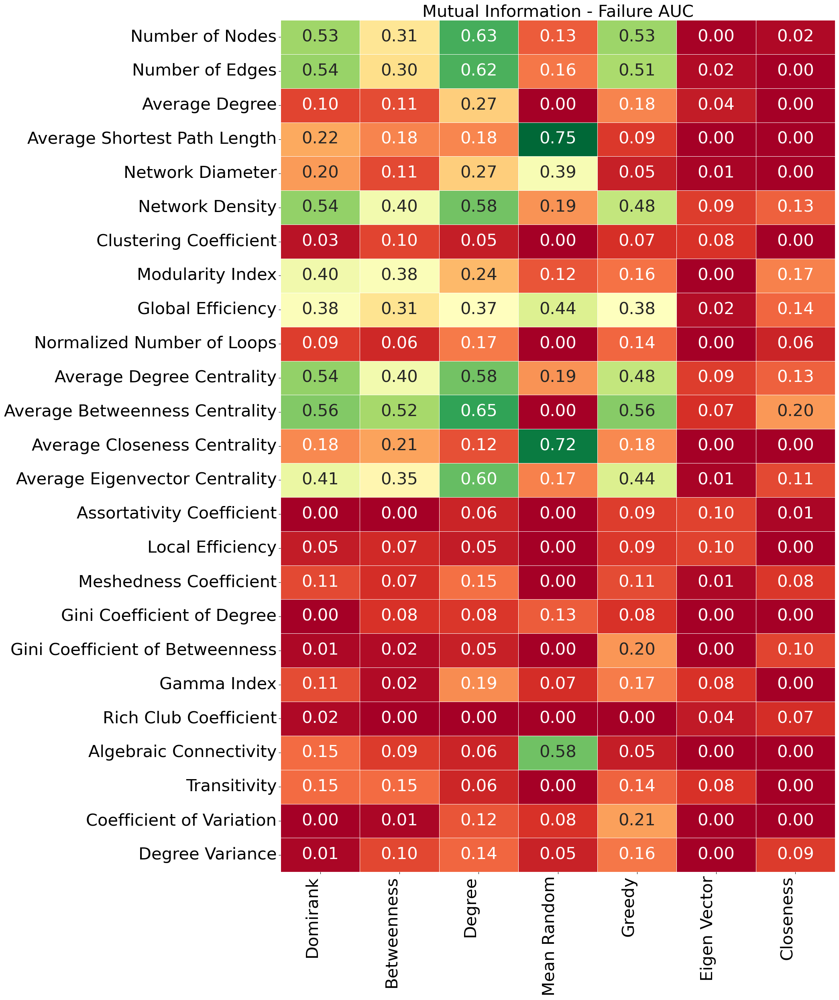

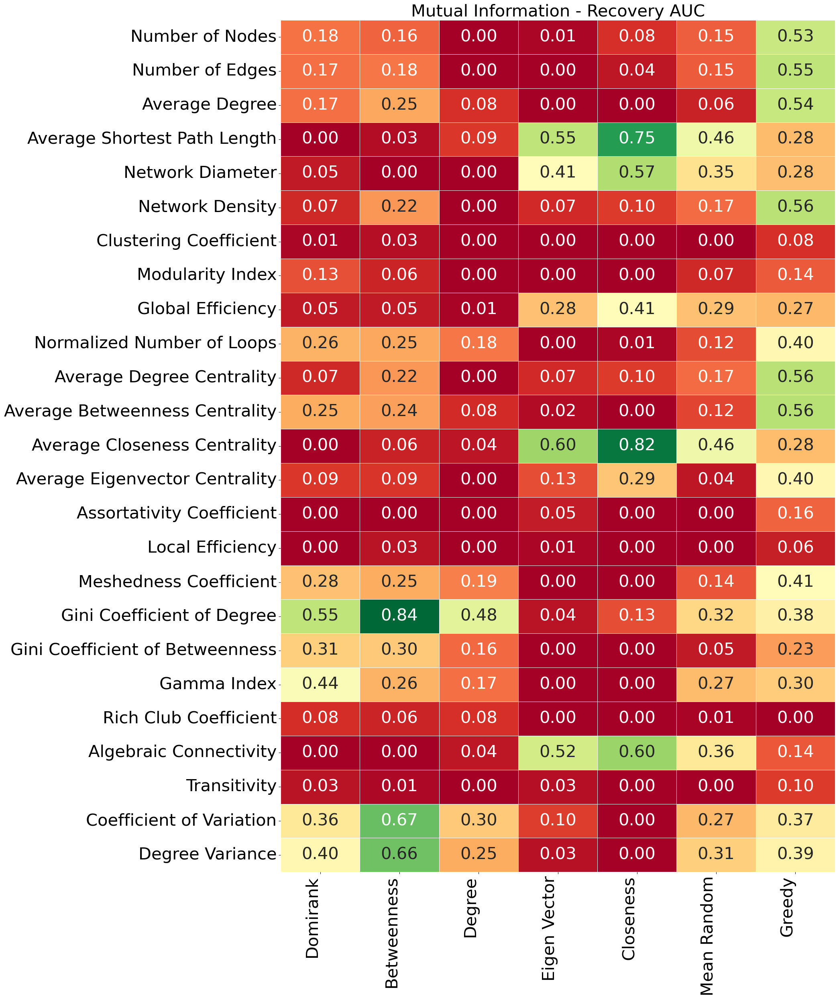

In [29]:
import pickle
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kendalltau
from sklearn.feature_selection import mutual_info_regression
import os

# Load data
with open("failure_results.pkl", "rb") as f:
    failure_data = pickle.load(f)

with open("recovery_results.pkl", "rb") as f:
    recovery_data = pickle.load(f)

with open("all_possible_attributes.pkl", "rb") as f:
    all_attrs = pickle.load(f)


# Methods to evaluate
required_methods = ["Betweenness", "Degree", "Random", "Domirank", "Greedy", "Eigen", "Closeness"]

# Filter valid cities
valid_cities = []
for city in failure_data:
    if city not in recovery_data or city not in all_attrs:
        continue
    f_auc = failure_data[city].get("failure_auc", {})
    r_auc = recovery_data[city].get("recovery_auc", {})
    attrs = all_attrs[city]

    if (
        all(method in f_auc and pd.notnull(f_auc[method]) for method in required_methods) and
        all(method in r_auc and pd.notnull(r_auc[method]) for method in required_methods) and
        all(np.isfinite(val) for val in attrs.values())
    ):
        valid_cities.append(city)

# Mapping of internal names → publication names
rename_dict = {
    "Nodes": "Number of Nodes",
    "Edges": "Number of Edges",
    "Avg_Degree": "Average Degree",
    "Avg_SPL": "Average Shortest Path Length",
    "Diameter": "Network Diameter",
    "Density": "Network Density",
    "Clustering_Coefficient": "Clustering Coefficient",
    "Modularity_Index": "Modularity Index",
    "Global_Efficiency": "Global Efficiency",
    "Normalized_Number_of_Loops": "Normalized Number of Loops",
    "Avg_Degree_Centrality": "Average Degree Centrality",
    "Avg_Betweenness_Centrality": "Average Betweenness Centrality",
    "Avg_Closeness_Centrality": "Average Closeness Centrality",
    "Avg_Eigenvector_Centrality": "Average Eigenvector Centrality",
    "Assortativity": "Assortativity Coefficient",
    "Local_Efficiency": "Local Efficiency",
    "Meshedness": "Meshedness Coefficient",
    "Gini_Degree": "Gini Coefficient of Degree",
    "Gini_Betweenness": "Gini Coefficient of Betweenness",
    "Gamma_Index": "Gamma Index",
    "Rich_Club_Coefficient": "Rich Club Coefficient",
    "Algebraic_Connectivity": "Algebraic Connectivity",
    "Transitivity": "Transitivity",
    "CV": "Coefficient of Variation",
    "Degree_Variance": "Degree Variance"
}

selected_attributes = list(rename_dict.keys())
publication_names = list(rename_dict.values())

# Extract and rename attribute data
attr_df = pd.DataFrame([
    {rename_dict[k]: all_attrs[city][k] for k in selected_attributes} for city in valid_cities
], index=valid_cities)

# Ensure correct column order
attr_df = attr_df[publication_names]

# Extract AUC values
failure_auc_df = pd.DataFrame([
    failure_data[city]["failure_auc"] for city in valid_cities
], index=valid_cities)[required_methods]

recovery_auc_df = pd.DataFrame([
    recovery_data[city]["recovery_auc"] for city in valid_cities
], index=valid_cities)[required_methods]

# Compute Kendall Tau
def compute_kendall_tau(attr_df, auc_df):
    tau_df = pd.DataFrame(index=attr_df.columns, columns=auc_df.columns)
    for attr in attr_df.columns:
        for method in auc_df.columns:
            tau, _ = kendalltau(attr_df[attr], auc_df[method])
            tau_df.loc[attr, method] = tau
    return tau_df.astype(float)

tau_failure = compute_kendall_tau(attr_df, failure_auc_df)
tau_recovery = compute_kendall_tau(attr_df, recovery_auc_df)

# Compute Mutual Information
def compute_mutual_info(attr_df, auc_df):
    mi_df = pd.DataFrame(index=attr_df.columns, columns=auc_df.columns)
    for method in auc_df.columns:
        y = auc_df[method].values
        mi = mutual_info_regression(attr_df.values, y, random_state=42)
        mi_df[method] = mi
    mi_df.index = attr_df.columns
    return mi_df.astype(float)

mi_failure = compute_mutual_info(attr_df, failure_auc_df)
mi_recovery = compute_mutual_info(attr_df, recovery_auc_df)

# Order methods for heatmap presentation
ordered_methods_recovery = ["Domirank", "Betweenness", "Degree", "Eigen", "Closeness", "Random", "Greedy"]
ordered_methods_failure = ["Domirank", "Betweenness", "Degree", "Random","Greedy","Eigen", "Closeness"]

mi_failure = mi_failure[ordered_methods_failure]
mi_recovery = mi_recovery[ordered_methods_recovery]
tau_failure = tau_failure[ordered_methods_failure]
tau_recovery = tau_recovery[ordered_methods_recovery]

# Plot heatmaps
def plot_heatmap(df, filename, title, n_cols_fixed=7):
    # Fix per-cell size
    cell_height = 1   # height per attribute
    cell_width = 3    # width per method
    
    # Use max # of columns (so failure/recovery align)
    height = len(df) * cell_height
    width = n_cols_fixed * cell_width

    plt.figure(figsize=(width, height))
    sns.heatmap(
        df,
        annot=True,
        fmt=".2f",
        cmap="RdYlGn",
        linewidths=0.5,
        annot_kws={"size": 30},
        cbar=False   # remove legend bar
    )
    plt.xticks(rotation=90, ha="right", fontsize=30)
    plt.yticks(rotation=0, fontsize=30)
    plt.title(title, fontsize=30)
    plt.tight_layout()
    plt.savefig(f"new_figures/mi_scores/{filename}.svg", format='svg', dpi=600)
    plt.show()
    
# Rename "Random" to "Mean Random" for readability in plots
mi_failure.rename(columns={"Random": "Mean Random"}, inplace=True)
mi_recovery.rename(columns={"Random": "Mean Random"}, inplace=True)
mi_failure.rename(columns={"Eigen": "Eigen Vector"}, inplace=True)
mi_recovery.rename(columns={"Eigen": "Eigen Vector"}, inplace=True)
tau_failure.rename(columns={"Random": "Mean Random"}, inplace=True)
tau_recovery.rename(columns={"Random": "Mean Random"}, inplace=True)

# Generate and save plots
plot_heatmap(mi_failure, "failure_mi_all_attributes", "Mutual Information - Failure AUC")
plot_heatmap(mi_recovery, "recovery_mi_all_attributes", "Mutual Information - Recovery AUC")
# plot_heatmap(tau_failure, "failure_tau_all_attributes", "Kendall Tau - Failure AUC")
# plot_heatmap(tau_recovery, "recovery_tau_all_attributes", "Kendall Tau - Recovery AUC")


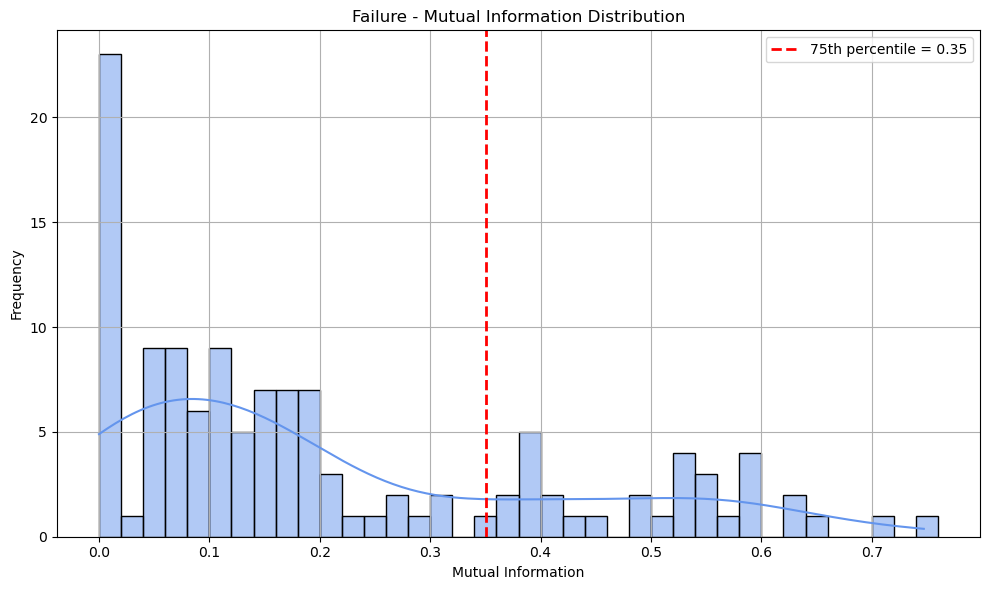

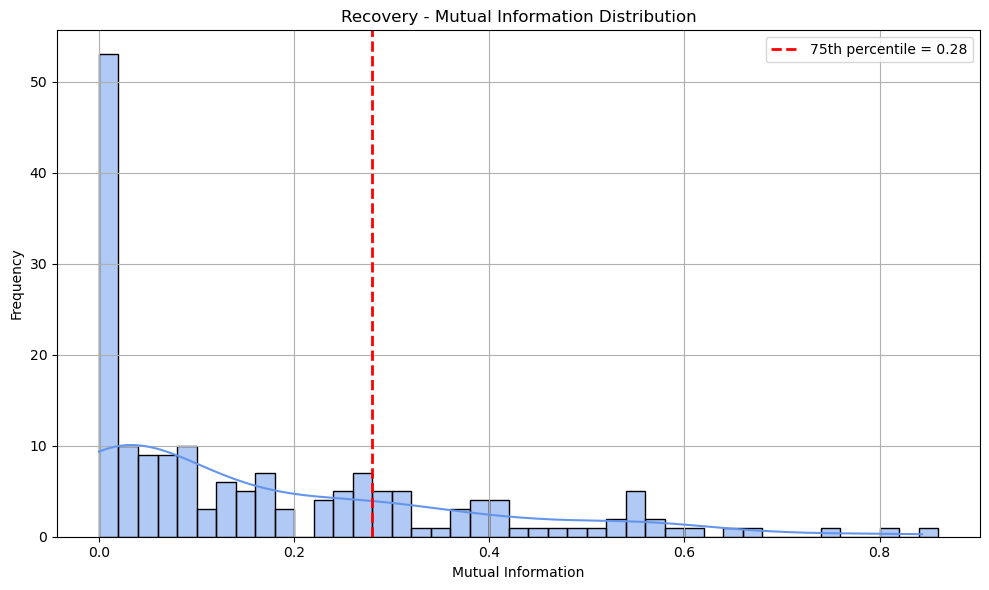

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_combined_mi_distribution(mi_df, title, filename):
    # Flatten all MI scores into a single array
    all_scores = mi_df.values.flatten()
    all_scores = all_scores[~np.isnan(all_scores)]  # remove NaNs if any

    # Compute 75th percentile threshold
    threshold = np.percentile(all_scores, 75)

    # Define bin edges with step of 0.02
    bins = np.arange(0, max(all_scores) + 0.02, 0.02)

    # Plot
    plt.figure(figsize=(10, 6))
    sns.histplot(all_scores, bins=bins, kde=True, color='cornflowerblue')
    plt.axvline(threshold, color='red', linestyle='--', linewidth=2, label=f'75th percentile = {threshold:.2f}')
    plt.title(f"{title} - Mutual Information Distribution")
    plt.xlabel("Mutual Information")
    plt.ylabel("Frequency")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()

    # Save figure
    os.makedirs("new_figures/mi_distribution", exist_ok=True)
    plt.savefig(f"new_figures/mi_distribution/{filename}.svg", format="svg", dpi=300)
    plt.show()

# Save both plots
plot_combined_mi_distribution(mi_failure, "Failure", "failure_distribution")
plot_combined_mi_distribution(mi_recovery, "Recovery", "recovery_distribution")


In [15]:
# ===== Hardcode the cluster numbering from the first script =====

# Normalizer to avoid whitespace/name mismatches
def _norm(s):
    return " ".join(str(s).split())

CLUSTER_SPEC = {
    1: ['Algebraic Connectivity', 'Average Closeness Centrality', 'Average Degree Centrality',
        'Average Eigenvector Centrality', 'Average Shortest Path Length', 'Network Density',
        'Network Diameter', 'Number of Edges', 'Global Efficiency', 'Number of Nodes'],
    2: ['Average Degree', 'Gamma Index', 'Meshedness Coefficient', 'Normalized Number of Loops'],
    3: ['Clustering Coefficient', 'Local Efficiency', 'Transitivity'],
    4: ['Modularity Index'],
    5: ['Average Betweenness Centrality'],
    6: ['Assortativity Coefficient'],
    7: ['Rich Club Coefficient'],
    8: ['Coefficient of Variation', 'Degree Variance', 'Gini Coefficient of Degree'],
    9: ['Gini Coefficient of Betweenness'],
}

# Build normalized lookup attr -> "Cluster k"
attr_to_cluster = {}
for k, attrs in CLUSTER_SPEC.items():
    for a in attrs:
        attr_to_cluster[_norm(a)] = f"Cluster {k}"

# Optional: sanity check for attributes not covered by the map
if 'attr_df' in globals():
    unknown = [_norm(c) for c in attr_df.columns if _norm(c) not in attr_to_cluster]
    if unknown:
        print("⚠️ Attributes not in hardcoded cluster map:", sorted(set(unknown)))

# ===== Utilities to get high-MI attributes and to print with clusters =====

from collections import defaultdict
import numpy as np
import pandas as pd

def get_high_mi_attributes(mi_df, threshold):
    high_attrs_per_strategy = {}
    for strategy in mi_df.columns:
        col = mi_df[strategy]
        sel = col[col >= threshold]
        high_attrs_per_strategy[strategy] = sel.index.tolist()
    return high_attrs_per_strategy

def print_top_attributes_with_clusters_and_scores(title, top_attrs_dict, mi_df):
    print(f"\n🔎 {title}")
    for strategy, attrs in top_attrs_dict.items():
        print(f"\n▶ Strategy: {strategy}")

        # Sort by MI desc (robust to NaNs)
        def _score(a):
            try:
                v = mi_df.loc[a, strategy]
                return float(v) if pd.notnull(v) else -np.inf
            except Exception:
                return -np.inf

        sorted_attrs = sorted(attrs, key=_score, reverse=True)

        for attr in sorted_attrs:
            cluster = attr_to_cluster.get(_norm(attr), "No Cluster")
            try:
                mi_score = float(mi_df.loc[attr, strategy])
            except Exception:
                mi_score = np.nan
            print(f" - {attr}: {cluster}, MI = {mi_score:.4f}")

# ===== Compute thresholds from your existing MI dataframes =====
# (Assumes mi_failure, mi_recovery already exist with publication-style attribute names.)
mi_failure_75 = mi_failure.stack().quantile(0.75)
mi_recovery_75 = mi_recovery.stack().quantile(0.75)

# ===== Get attributes above threshold =====
high_failure_attrs = get_high_mi_attributes(mi_failure, mi_failure_75)
high_recovery_attrs = get_high_mi_attributes(mi_recovery, mi_recovery_75)

# ===== Output with the hardcoded clusters =====
print(mi_failure_75)
print(mi_recovery_75)

print_top_attributes_with_clusters_and_scores("High MI Attributes (Failure)", high_failure_attrs, mi_failure)
print_top_attributes_with_clusters_and_scores("High MI Attributes (Recovery)", high_recovery_attrs, mi_recovery)


0.3507583408483108
0.28027303495652167

🔎 High MI Attributes (Failure)

▶ Strategy: Domirank
 - Average Betweenness Centrality: Cluster 5, MI = 0.5635
 - Network Density: Cluster 1, MI = 0.5435
 - Average Degree Centrality: Cluster 1, MI = 0.5435
 - Number of Edges: Cluster 1, MI = 0.5399
 - Number of Nodes: Cluster 1, MI = 0.5297
 - Average Eigenvector Centrality: Cluster 1, MI = 0.4140
 - Modularity Index: Cluster 4, MI = 0.4019
 - Global Efficiency: Cluster 1, MI = 0.3808

▶ Strategy: Betweenness
 - Average Betweenness Centrality: Cluster 5, MI = 0.5205
 - Network Density: Cluster 1, MI = 0.3974
 - Average Degree Centrality: Cluster 1, MI = 0.3974
 - Modularity Index: Cluster 4, MI = 0.3839
 - Average Eigenvector Centrality: Cluster 1, MI = 0.3508

▶ Strategy: Degree
 - Average Betweenness Centrality: Cluster 5, MI = 0.6488
 - Number of Nodes: Cluster 1, MI = 0.6288
 - Number of Edges: Cluster 1, MI = 0.6240
 - Average Eigenvector Centrality: Cluster 1, MI = 0.5981
 - Network Densit

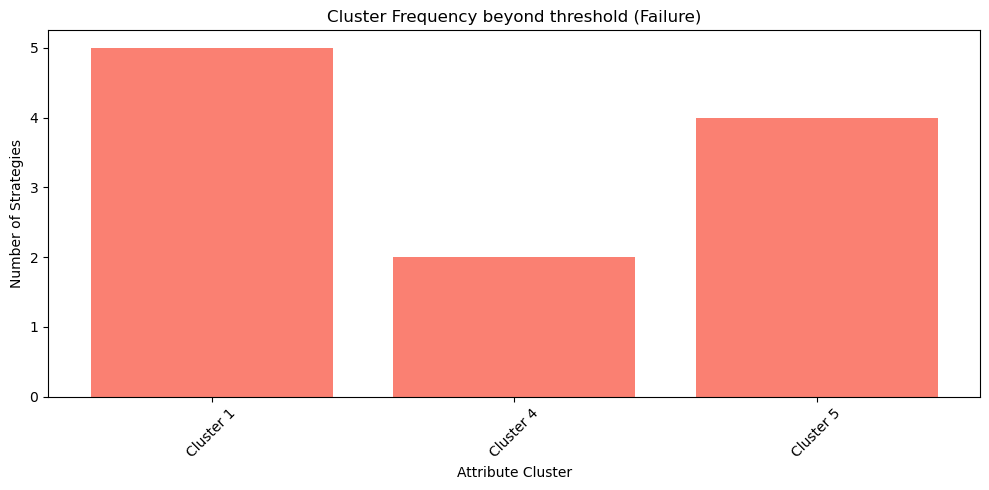

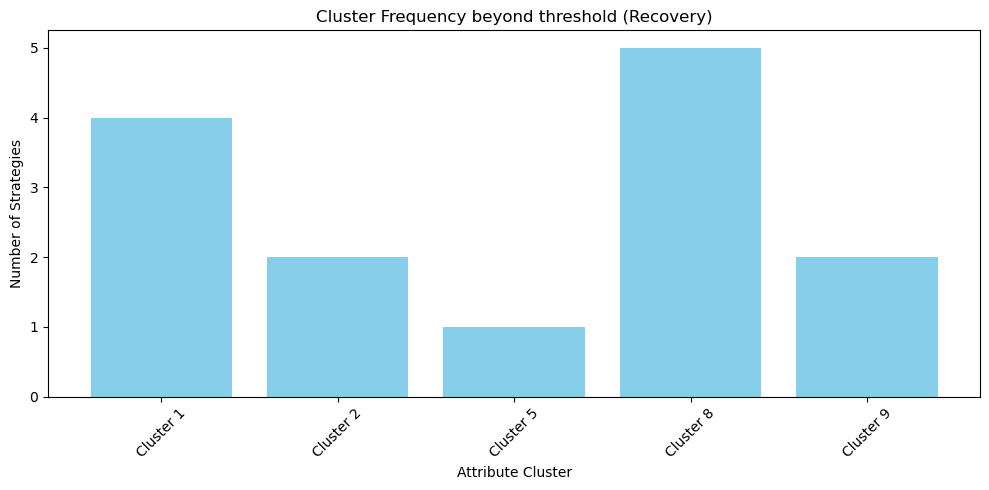

In [16]:
import matplotlib.pyplot as plt
from collections import defaultdict, Counter

def compute_cluster_frequencies(top_attrs_dict, attr_to_cluster):
    cluster_counts = defaultdict(set)  # Set to store unique clusters per strategy

    for strategy, attrs in top_attrs_dict.items():
        for attr in attrs:
            cluster = attr_to_cluster.get(attr, "Unclustered")
            cluster_counts[strategy].add(cluster)

    # Flatten and count
    flat_clusters = [cluster for clusters in cluster_counts.values() for cluster in clusters]
    return Counter(flat_clusters)

# Compute frequencies
failure_cluster_freq = compute_cluster_frequencies(high_failure_attrs, attr_to_cluster)
recovery_cluster_freq = compute_cluster_frequencies(high_recovery_attrs, attr_to_cluster)

# Plotting function
def plot_cluster_frequencies(counter, title, color):
    plt.figure(figsize=(10, 5))
    sorted_items = sorted(counter.items(), key=lambda x: x[0])
    labels, values = zip(*sorted_items)
    plt.bar(labels, values, color=color)
    plt.title(title)
    plt.ylabel("Number of Strategies")
    plt.xlabel("Attribute Cluster")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig(f"new_figures/mi_frequency/{title}.svg", format="svg", dpi=300)
    plt.show()

# Plot frequency of clusters
plot_cluster_frequencies(failure_cluster_freq, "Cluster Frequency beyond threshold (Failure)", "salmon")
plot_cluster_frequencies(recovery_cluster_freq, "Cluster Frequency beyond threshold (Recovery)", "skyblue")
